# **RTL to GDSII complete flow for CORDIC_Neuron design**

In [ ]:
import os
import sys
import shutil

os.environ["LOCALE_ARCHIVE"] = "/usr/lib/locale/locale-archive"

if "google.colab" in sys.modules:
    if shutil.which("nix-env") is None:
        !curl -L https://nixos.org/nix/install | bash -s -- --daemon --yes
        !echo "extra-experimental-features = nix-command flakes" >> /etc/nix/nix.conf
        !killall nix-daemon
else:
    if shutil.which("nix-env") is None:
        raise RuntimeError("Nix is not installed!")

os.environ["PATH"] = f"/nix/var/nix/profiles/default/bin/:{os.getenv('PATH')}"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  4267  100  4267    0     0  10348      0 --:--:-- --:--:-- --:--:-- 10348
downloading Nix 2.28.2 binary tarball for x86_64-linux from 'https://releases.nixos.org/nix/nix-2.28.2/nix-2.28.2-x86_64-linux.tar.xz' to '/tmp/nix-binary-tarball-unpack.ugcxWU2H88'...
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 22.8M  100 22.8M    0     0  87.4M      0 --:--:-- --:--:-- --:--:-- 87.5M
Note: a multi-user installation is possible. See https://nixos.org/manual/nix/stable/installation/installing-binary.html#multi-user-installation
Switching to the Multi-user Installer
Welcome to the Multi-User Nix Installation

This installation tool will set up 

In [ ]:
# @title Get OpenLane {display-mode: "form"}

import os
import subprocess
import IPython

openlane_version = "version-2.1"  # @param {key:"OpenLane Version", type:"string"}

if openlane_version == "latest":
    openlane_version = "main"

pdk_root = "~/.volare"  # @param {key:"PDK Root", type:"string"}

pdk_root = os.path.expanduser(pdk_root)

pdk = "sky130"  # @param {key:"PDK (without the variant)", type:"string"}

openlane_ipynb_path = os.path.join(os.getcwd(), "openlane_ipynb")

display(IPython.display.HTML("<h3>Downloading OpenLane…</a>"))


TESTING_LOCALLY = False
!rm -rf {openlane_ipynb_path}
!mkdir -p {openlane_ipynb_path}
if TESTING_LOCALLY:
    !ln -s {os.getcwd()} {openlane_ipynb_path}
else:
    !curl -L "https://github.com/efabless/openlane2/tarball/{openlane_version}" | tar -xzC {openlane_ipynb_path} --strip-components 1

try:
    import tkinter
except ImportError:
    if "google.colab" in sys.modules:
        !sudo apt-get install python-tk

try:
    import tkinter
except ImportError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to import the <code>tkinter</code> library for Python, which is required to load PDK configuration values. Make sure <code>python3-tk</code> or equivalent is installed on your system.</a>'
        )
    )
    raise e from None


display(IPython.display.HTML("<h3>Downloading OpenLane's dependencies…</a>"))
try:
    subprocess.check_call(
        ["nix", "profile", "install", ".#colab-env", "--accept-flake-config"],
        cwd=openlane_ipynb_path,
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install binary dependencies using Nix…</h3>'
        )
    )

display(IPython.display.HTML("<h3>Downloading Python dependencies using PIP…</a>"))
try:
    subprocess.check_call(
        ["pip3", "install", "."],
        cwd=openlane_ipynb_path,
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install Python dependencies using PIP…</h3>'
        )
    )
    raise e from None

display(IPython.display.HTML("<h3>Downloading PDK…</a>"))
import volare

volare.enable(
    volare.get_volare_home(pdk_root),
    pdk,
    open(
        os.path.join(openlane_ipynb_path, "openlane", "open_pdks_rev"),
        encoding="utf8",
    )
    .read()
    .strip(),
)

sys.path.insert(0, openlane_ipynb_path)
display(IPython.display.HTML("<h3>⭕️ Done.</a>"))

import logging

# Remove the stupid default colab logging handler
logging.getLogger().handlers.clear()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 9491k    0 9491k    0     0  13.5M      0 --:--:-- --:--:-- --:--:-- 13.5M


Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a not found locally, attempting to download…

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a enabled for the sky130 PDK.

In [ ]:
import openlane

print(openlane.__version__)

2.1.11


### Creating the design

In [ ]:
%%writefile cordic_neuron.v

module cordic_neuron #(
    parameter MAC_ITERATIONS = 24,
    parameter INT_SIZE = 8,
    parameter FLOAT_SIZE = 24
)(
    input wire clk,
    input wire rst,
    input wire start,
    input wire signed [31:0] x_in,  // Q8.24 format
    input wire signed [31:0] y_in,  // Q8.24 format
    input wire signed [31:0] z_in,  // scalar multiplier in Q8.24
    output wire signed [31:0] mac_x_out,  // Added MAC x output
    output wire signed [31:0] mac_y_out,  // Added MAC y output
    output wire signed [31:0] tanh_out,
    output reg done
);

    // State definitions
    localparam IDLE = 2'd0;
    localparam MAC_PROCESS = 2'd1;
    localparam TANH_PROCESS = 2'd2;
    localparam COMPLETE = 2'd3;

    reg [1:0] current_state, next_state;

    // Signals for MAC operation
    reg mac_rst;

    // Signals for tanh operation
    reg tanh_en;

    // Instantiate the MAC module (cordic_linear_mode)
    cordic_linear_mode #(
        .ITERATIONS(MAC_ITERATIONS)
    ) mac_inst (
        .clk(clk),
        .rst(mac_rst),
        .x_in(x_in),
        .y_in(y_in),
        .z_in(z_in),
        .x_out(mac_x_out),
        .y_out(mac_y_out)
    );

    // Instantiate the tanh module
    cordictanh tanh_inst (
        .CLK(clk),
        .EN(tanh_en),
        .z(mac_y_out),
        .out(tanh_out)
    );

    // Counter for MAC iterations
    reg [7:0] mac_counter;
    reg mac_complete;

    // Timer for tanh process (to determine when it's complete)
    reg [7:0] tanh_counter;
    localparam TANH_CYCLES = 50; // Adjust based on actual cycles needed for tanh to complete

    // State machine - sequential logic
    always @(posedge clk or posedge rst) begin
        if (rst) begin
            current_state <= IDLE;
            mac_counter <= 0;
            tanh_counter <= 0;
            mac_complete <= 0;
            done <= 0;
        end else begin
            current_state <= next_state;

            // MAC counter logic
            if (current_state == MAC_PROCESS) begin
                mac_counter <= mac_counter + 1;
                if (mac_counter >= MAC_ITERATIONS - 1) begin
                    mac_complete <= 1;
                end
            end else if (current_state == IDLE) begin
                mac_counter <= 0;
                mac_complete <= 0;
            end

            // Tanh counter logic
            if (current_state == TANH_PROCESS) begin
                tanh_counter <= tanh_counter + 1;
            end else if (current_state == IDLE) begin
                tanh_counter <= 0;
            end

            // Done signal
            if (current_state == COMPLETE) begin
                done <= 1;
            end else begin
                done <= 0;
            end
        end
    end

    // State machine - combinational logic
    always @(*) begin
        // Default values
        mac_rst = 0;
        tanh_en = 0;

        case (current_state)
            IDLE: begin
                mac_rst = 1; // Reset MAC module
                if (start) begin
                    next_state = MAC_PROCESS;
                end else begin
                    next_state = IDLE;
                end
            end

            MAC_PROCESS: begin
                mac_rst = 0; // MAC module active
                if (mac_complete) begin
                    next_state = TANH_PROCESS;
                end else begin
                    next_state = MAC_PROCESS;
                end
            end

            TANH_PROCESS: begin
                if (tanh_counter == 0) begin
                    tanh_en = 1; // Start tanh calculation
                end else begin
                    tanh_en = 0; // Keep tanh running
                end

                if (tanh_counter >= TANH_CYCLES) begin
                    next_state = COMPLETE;
                end else begin
                    next_state = TANH_PROCESS;
                end
            end

            COMPLETE: begin
                next_state = IDLE;
            end

            default: next_state = IDLE;
        endcase
    end

endmodule

module cordic_linear_mode #(
    parameter ITERATIONS = 24  // CORDIC iterations (matches fractional precision)
)(
    input wire clk,
    input wire rst,
    input wire signed [31:0] x_in,  // Q8.24 format
    input wire signed [31:0] y_in,  // Q8.24 format
    input wire signed [31:0] z_in,  // scalar multiplier in Q8.24
    output reg signed [31:0] x_out,
    output reg signed [31:0] y_out
);

    // Internal registers
    reg signed [31:0] x ;
    reg signed [31:0] y ;
    reg signed [31:0] z ;

    // reg signed [31:0] x_new ;
    // reg signed [31:0] y_new ;
    // reg signed [31:0] z_new ;

    integer i;

    always @(posedge clk or posedge rst) begin
        if (rst) begin
            // for (i = 0; i <= ITERATIONS; i = i + 1) begin
            //     x <= x_in;
            //     y <= y_in;
            //     z <= z_in;
            // end
            x <= x_in;
            y <= y_in;
            z <= z_in;
            x_out <= 0;
            y_out <= 0;
            i = 0;
        end else begin
            // Initialization
            // x[0] <= x_in;
            // y[0] <= y_in;
            // z[0] <= z_in;

            // Iterative CORDIC in linear mode
            // for (i = 0; i < ITERATIONS; i = i + 1) begin
            if (i < ITERATIONS)
            begin
                if (z[31] == 0) begin  // z >= 0
                    x <= x;
                    y <= y + (x >>> i);
                    z <= z - (32'sd1 <<< (24 - i));  // Subtract 2^-i
                end else begin
                    x <= x;
                    y <= y - (x >>> i);
                    z <= z + (32'sd1 <<< (24 - i));  // Add 2^-i
                end
                i = i+1;
            end

            // end

            // Outputs
            x_out <= x;
            y_out <= y;
        end
    end

    // always @(negedge clk) begin
    //     x <= x_new;
    //     y <= y_new;
    //     z <= z_new;
    // end

endmodule

module cordicdiv(CLK, EN, y, x, out);
    parameter FLOAT_SIZE = 24;
    parameter INT_SIZE = 8;

    input wire CLK;
    input wire EN;
    input wire signed [INT_SIZE-1:-FLOAT_SIZE] y;
    input wire signed [INT_SIZE-1:-FLOAT_SIZE] x;
    output reg signed [INT_SIZE-1:-FLOAT_SIZE] out;

    parameter MAX_ITERATION = FLOAT_SIZE+1;
    reg signed [INT_SIZE-1:-FLOAT_SIZE] y_;
    reg signed [INT_SIZE-1:-FLOAT_SIZE] z_;
    reg [4:0] i;
    always @(posedge CLK)
    begin
        if (EN) //  Like Reset
        begin
            out <= 32'h00_000000;
            z_ <= 32'h00_000000;
            y_ <= y;
            i <= 5'b0000;
        end
        else
        begin
            if (i < MAX_ITERATION && |y_)
            begin
                y_ <= y_[INT_SIZE-1] ? y_ + (x >>> i) : y_ - (x >>> i);
                z_ <= y_[INT_SIZE-1] ? z_ - $signed(32'h01_000000 >> i) : z_ + $signed(32'h01_000000 >> i);
                i <= i + 1;
            end
            out <= z_;
        end
    end
endmodule

module cordictanh(CLK, EN, z, out);
    parameter FLOAT_SIZE = 24;
    parameter INT_SIZE = 8;

    input wire CLK;
    input wire EN;
    input wire signed [INT_SIZE-1:-FLOAT_SIZE] z;
    output wire signed [INT_SIZE-1:-FLOAT_SIZE] out;

    parameter MAX_ITERATION_DIV = 31;
    reg signed [INT_SIZE-1:-FLOAT_SIZE] x_;
    reg signed [INT_SIZE-1:-FLOAT_SIZE] y_;
    reg signed [INT_SIZE-1:-FLOAT_SIZE] z_;
    reg signed [4:0] i;
    wire signed [INT_SIZE-1:-FLOAT_SIZE] Z_UPDATE;
    atanh_LOOKUP LOOKUP(
        .index(i),
        .value(Z_UPDATE));
    reg div_en;
    reg IS_FIRST4;
    reg IS_FIRST13;
    reg IS_Z_ZERO;

    always @(posedge CLK)
    begin
        if (EN) //  Like Reset
        begin
            x_ <= 32'h01_000000;
            y_ <= 32'h00_000000;
            z_ <= z;
            i <= -3;
            div_en <= 1'b0;
            IS_FIRST4 <= 1'b1;
            IS_FIRST13 <= 1'b1;
            IS_Z_ZERO <= 1'b0;
        end
        else
        begin
            if (|z_)    //  z not zero
            begin
                z_ <= z_[INT_SIZE-1] ? z_ + Z_UPDATE : z_ - Z_UPDATE;

                if (i < 1)
                begin
                    x_ <= z_[INT_SIZE-1] ? x_ - y_ + (y_ >>> -(i-2)) : x_ + y_ - (y_ >>> -(i-2));
                    y_ <= z_[INT_SIZE-1] ? y_ - x_ + (x_ >>> -(i-2)) : y_ + x_ - (x_ >>> -(i-2));
                    i <= i + 1;
                end
                else if (i == 4)
                begin
                    x_ <= z_[INT_SIZE-1] ? x_ - (y_ >>> i) : x_ + (y_ >>> i);
                    y_ <= z_[INT_SIZE-1] ? y_ - (x_ >>> i) : y_ + (x_ >>> i);
                    if (IS_FIRST4)  IS_FIRST4 <= 1'b0;
                    else            i <= i + 1;
                end
                else if (i == 13)
                begin
                    x_ <= z_[INT_SIZE-1] ? x_ - (y_ >>> i) : x_ + (y_ >>> i);
                    y_ <= z_[INT_SIZE-1] ? y_ - (x_ >>> i) : y_ + (x_ >>> i);
                    if (IS_FIRST13)  IS_FIRST13 <= 1'b0;
                    else            i <= i + 1;
                end
                else if (i < 14)
                begin
                    x_ <= z_[INT_SIZE-1] ? x_ - (y_ >>> i) : x_ + (y_ >>> i);
                    y_ <= z_[INT_SIZE-1] ? y_ - (x_ >>> i) : y_ + (x_ >>> i);
                    i <= i + 1;
                end
                else if (i == 14)
                begin
                    div_en <= 1'b1;
                    i <= i + 1;
                end
                else
                begin
                    div_en <= 1'b0;
                    i <= i;
                end
            end
            else
            begin
                if (IS_Z_ZERO)
                    div_en <= 1'b0;
                else
                begin
                    IS_Z_ZERO <= 1'b1;
                    div_en <= 1'b1;
                end

            end
        end
    end

    cordicdiv divider(
        .CLK(CLK),
        .EN(div_en),
        .y(y_),
        .x(x_),
        .out(out)
    );
endmodule

module atanh_LOOKUP(index, value);
    localparam FLOAT_SIZE = 24;
    localparam INT_SIZE = 8;

    input wire signed [4:0] index;
    output reg signed [INT_SIZE-1:-FLOAT_SIZE] value;

    always @(index)
    begin
        case (index)
            -3: value = 32'h02_12523d;  //  atanh(1-2^(-5))
            -2: value = 32'h01_b78ce5;  //  atanh(1-2^(-4))
            -1: value = 32'h01_5aa164;  //  atanh(1-2^(-3))
            0:  value = 32'h00_f91395;  //  atanh(1-2^(-2))
            1:  value = 32'h00_8c9f54;  //  atanh(2^(-1))
            2:  value = 32'h00_4162bc;  //  atanh(2^(-2))
            3:  value = 32'h00_202b12;  //  atanh(2^(-3))
            4:  value = 32'h00_100559;  //  atanh(2^(-4))
            5:  value = 32'h00_0800ab;  //  atanh(2^(-5))
            6:  value = 32'h00_040015;  //  atanh(2^(-6))
            7:  value = 32'h00_020003;  //  atanh(2^(-7))
            8:  value = 32'h00_010000;  //  atanh(2^(-8))
            9:  value = 32'h00_008000;  //  atanh(2^(-9))
            10: value = 32'h00_004000;  //  atanh(2^(-10))
            11: value = 32'h00_002000;  //  atanh(2^(-11))
            12: value = 32'h00_001000;  //  atanh(2^(-12))
            13: value = 32'h00_000800;  //  atanh(2^(-13))
            default:
                value = 32'h00_000000;
        endcase
    end
endmodule



Writing cordic_neuron.v


### Setting up the configuration

Reference for `Config.interactive` [here](https://openlane2.readthedocs.io/en/latest/reference/api/config/index.html#openlane.config.Config.interactive).



In [ ]:
from openlane.config import Config

Config.interactive(
    "cordic_neuron",
    PDK="sky130A",
    CLOCK_PORT="clk",
    CLOCK_NET="clk",
    CLOCK_PERIOD=50,
    PRIMARY_GDSII_STREAMOUT_TOOL="klayout",
)


### Interactive Configuration
#### Initial Values

<br />

```yaml
CELL_BB_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox_pp.v
CELL_GDS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/gds/sky130_fd_sc_hd.gds
CELL_LEFS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef
CELL_PAD_EXCLUDE:
- sky130_fd_sc_hd__tap*
- sky130_fd_sc_hd__decap*
- sky130_ef_sc_hd__decap*
- sky130_fd_sc_hd__fill*
CELL_SPICE_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice
CELL_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/primitives.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd.v
CLOCK_NET: clk
CLOCK_PERIOD: 50
CLOCK_PORT: clk
CLOCK_TRANSITION_CONSTRAINT: 0.15
CLOCK_UNCERTAINTY_CONSTRAINT: 0.25
CLOCK_WIRE_RC_LAYERS: null
DECAP_CELL:
- sky130_ef_sc_hd__decap_12
- sky130_fd_sc_hd__decap_8
- sky130_fd_sc_hd__decap_6
- sky130_fd_sc_hd__decap_4
- sky130_fd_sc_hd__decap_3
DEFAULT_CORNER: nom_tt_025C_1v80
DEFAULT_MAX_TRAN: null
DESIGN_DIR: .
DESIGN_NAME: cordic_neuron
DIE_AREA: null
DIODE_CELL: sky130_fd_sc_hd__diode_2/DIODE
ENDCAP_CELL: sky130_fd_sc_hd__decap_3
EXTRA_EXCLUDED_CELLS: null
EXTRA_GDS_FILES: null
EXTRA_LEFS: null
EXTRA_LIBS: null
EXTRA_SPICE_MODELS: null
EXTRA_VERILOG_MODELS: null
FALLBACK_SDC_FILE: /content/openlane_ipynb/openlane/scripts/base.sdc
FILL_CELL:
- sky130_fd_sc_hd__fill*
FP_IO_HLAYER: met3
FP_IO_VLAYER: met2
FP_TAPCELL_DIST: 13
FP_TRACKS_INFO: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tracks.info
GND_NETS: null
GND_PIN: VGND
GPIO_PADS_LEF:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_fd_io.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_ef_io.lef
GPIO_PADS_LEF_CORE_SIDE:
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_fd_io_core.lef
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_ef_io_core.lef
GPIO_PADS_VERILOG:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/verilog/sky130_ef_io.v
GPIO_PAD_CELLS:
- sky130_fd_io*
- sky130_ef_io*
IO_DELAY_CONSTRAINT: 20
LIB:
  '*_ff_n40C_1v95':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib
  '*_ss_100C_1v60':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib
  '*_tt_025C_1v80':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib
MACROS: null
MAX_CAPACITANCE_CONSTRAINT: 0.2
MAX_FANOUT_CONSTRAINT: 10
MAX_TRANSITION_CONSTRAINT: 0.75
OUTPUT_CAP_LOAD: 33.442
PDK: sky130A
PDK_ROOT: /root/.volare
PLACE_SITE: unithd
PNR_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/drc_exclude.cells
PRIMARY_GDSII_STREAMOUT_TOOL: klayout
RT_MAX_LAYER: met5
RT_MIN_LAYER: met1
SCL_GROUND_PINS:
- VGND
- VNB
SCL_POWER_PINS:
- VPWR
- VPB
SIGNAL_WIRE_RC_LAYERS: null
STA_CORNERS:
- nom_tt_025C_1v80
- nom_ss_100C_1v60
- nom_ff_n40C_1v95
- min_tt_025C_1v80
- min_ss_100C_1v60
- min_ff_n40C_1v95
- max_tt_025C_1v80
- max_ss_100C_1v60
- max_ff_n40C_1v95
STD_CELL_LIBRARY: sky130_fd_sc_hd
SYNTH_BUFFER_CELL: sky130_fd_sc_hd__buf_2/A/X
SYNTH_CLK_DRIVING_CELL: null
SYNTH_DRIVING_CELL: sky130_fd_sc_hd__inv_2/Y
SYNTH_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/no_synth.cells
SYNTH_TIEHI_CELL: sky130_fd_sc_hd__conb_1/HI
SYNTH_TIELO_CELL: sky130_fd_sc_hd__conb_1/LO
TECH_LEFS:
  max_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__max.tlef
  min_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__min.tlef
  nom_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef
TIME_DERATING_CONSTRAINT: 5
TRISTATE_CELLS:
- sky130_fd_sc_hd__ebuf*
VDD_NETS: null
VDD_PIN: VPWR
VDD_PIN_VOLTAGE: 1.8
WELLTAP_CELL: sky130_fd_sc_hd__tapvpwrvgnd_1
WIRE_LENGTH_THRESHOLD: null
meta:
  flow: null
  openlane_version: 2.1.11
  step: null
  substituting_steps: null
  version: 1

```


### Running implementation steps
Reference steps here: https://openlane2.readthedocs.io/en/latest/reference/step_config_vars.html

In [ ]:
from openlane.steps import Step

In [ ]:
Synthesis = Step.factory.get("Yosys.Synthesis")

Synthesis.display_help()


(step-yosys-synthesis)=
### Synthesis

```{eval-rst}

Performs synthesis and technology mapping on Verilog RTL files
using Yosys and ABC, emitting a netlist.

Some metrics will also be extracted and updated, namely:

* ``design__instance__count``
* ``design__instance_unmapped__count``
* ``design__instance__area``

```

#### Importing
```python
from openlane.steps.yosys import Synthesis

# or

from openlane.steps import Step

Synthesis = Step.factory.get("Yosys.Synthesis")
```


#### Inputs and Outputs

| Inputs | Outputs |
| - | - |
|  | Verilog Netlist (.nl.v) |

(yosys.synthesis-configuration-variables)=
#### Configuration Variables

| Variable Name | Type | Description | Default | Units |
| - | - | - | - | - |
| `SYNTH_LATCH_MAP`{#var-yosys-synthesis-synth_latch_map}<sup>PDK</sup> | Path? | A path to a file containing the latch mapping for Yosys. | `None` |  |
| `SYNTH_TRISTATE_MAP`{#var-yosys-synthesis-synth_tristate_map}<sup>PDK</sup> | Path? | A path to a file containing the tri-state buffer mapping for Yosys. | `None` |  |
| `SYNTH_CSA_MAP`{#var-yosys-synthesis-synth_csa_map}<sup>PDK</sup> | Path? | A path to a file containing the carry-select adder mapping for Yosys. | `None` |  |
| `SYNTH_RCA_MAP`{#var-yosys-synthesis-synth_rca_map}<sup>PDK</sup> | Path? | A path to a file containing the ripple-carry adder mapping for Yosys. | `None` |  |
| `SYNTH_FA_MAP`{#var-yosys-synthesis-synth_fa_map}<sup>PDK</sup> | Path? | A path to a file containing the full adder mapping for Yosys. | `None` |  |
| `SYNTH_MUX_MAP`{#var-yosys-synthesis-synth_mux_map}<sup>PDK</sup> | Path? | A path to a file containing the mux mapping for Yosys. | `None` |  |
| `SYNTH_MUX4_MAP`{#var-yosys-synthesis-synth_mux4_map}<sup>PDK</sup> | Path? | A path to a file containing the mux4 mapping for Yosys. | `None` |  |
| `USE_LIGHTER`{#var-yosys-synthesis-use_lighter} | bool | Activates Lighter, an experimental plugin that attempts to optimize clock-gated flip-flops. | `False` |  |
| `LIGHTER_DFF_MAP`{#var-yosys-synthesis-lighter_dff_map} | Path? | An override to the custom DFF map file provided for the given SCL by Lighter. | `None` |  |
| `YOSYS_LOG_LEVEL`{#var-yosys-synthesis-yosys_log_level} | 'ALL'｜<br />'WARNING'｜<br />'ERROR' | Which log level for Yosys. At WARNING or higher, the initialization splash is also disabled. | `ALL` |  |
| `SYNTH_CHECKS_ALLOW_TRISTATE`{#var-yosys-synthesis-synth_checks_allow_tristate} | bool | Ignore multiple-driver warnings if they are connected to tri-state buffers on a best-effort basis. | `True` |  |
| `SYNTH_AUTONAME`{#var-yosys-synthesis-synth_autoname} | bool | Generates names for netlist instances. This results in instance names that can be extremely long, but are more human-readable. | `False` |  |
| `SYNTH_STRATEGY`{#var-yosys-synthesis-synth_strategy} | 'AREA 0'｜<br />'AREA 1'｜<br />'AREA 2'｜<br />'AREA 3'｜<br />'DELAY 0'｜<br />'DELAY 1'｜<br />'DELAY 2'｜<br />'DELAY 3'｜<br />'DELAY 4' | Strategies for abc logic synthesis and technology mapping. AREA strategies usually result in a more compact design, while DELAY strategies usually result in a design that runs at a higher frequency. Please note that there is no way to know which strategy is the best before trying them. | `AREA 0` |  |
| `SYNTH_ABC_BUFFERING`{#var-yosys-synthesis-synth_abc_buffering} | bool | Enables `abc` cell buffering. | `False` |  |
| `SYNTH_ABC_LEGACY_REFACTOR`{#var-yosys-synthesis-synth_abc_legacy_refactor} | bool | Replaces the ABC command `drf -l` with `refactor` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_ABC_LEGACY_REWRITE`{#var-yosys-synthesis-synth_abc_legacy_rewrite} | bool | Replaces the ABC command `drw -l` with `rewrite` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_DIRECT_WIRE_BUFFERING`{#var-yosys-synthesis-synth_direct_wire_buffering} | bool | Enables inserting buffer cells for directly connected wires. | `True` |  |
| `SYNTH_SPLITNETS`{#var-yosys-synthesis-synth_splitnets} | bool | Splits multi-bit nets into single-bit nets. Easier to trace but may not be supported by all tools. | `True` |  |
| `SYNTH_SIZING`{#var-yosys-synthesis-synth_sizing} | bool | Enables `abc` cell sizing (instead of buffering). | `False` |  |
| `SYNTH_NO_FLAT`{#var-yosys-synthesis-synth_no_flat} | bool | A flag that disables flattening the hierarchy during synthesis, only flattening it after synthesis, mapping and optimizations. | `False` |  |
| `SYNTH_SHARE_RESOURCES`{#var-yosys-synthesis-synth_share_resources} | bool | A flag that enables yosys to reduce the number of cells by determining shareable resources and merging them. | `True` |  |
| `SYNTH_ADDER_TYPE`{#var-yosys-synthesis-synth_adder_type} | 'YOSYS'｜<br />'FA'｜<br />'RCA'｜<br />'CSA' | Adder type to which the $add and $sub operators are mapped to.  Possible values are `YOSYS/FA/RCA/CSA`; where `YOSYS` refers to using Yosys internal adder definition, `FA` refers to full-adder structure, `RCA` refers to ripple carry adder structure, and `CSA` refers to carry select adder. | `YOSYS` |  |
| `SYNTH_EXTRA_MAPPING_FILE`{#var-yosys-synthesis-synth_extra_mapping_file} | Path? | Points to an extra techmap file for yosys that runs right after yosys `synth` before generic techmap. | `None` |  |
| `SYNTH_PARAMETERS`{#var-yosys-synthesis-synth_parameters} | List[str]? | Key-value pairs to be `chparam`ed in Yosys, in the format `key1=value1`. | `None` |  |
| `SYNTH_ELABORATE_ONLY`{#var-yosys-synthesis-synth_elaborate_only} | bool | "Elaborate" the design only without attempting any logic mapping. Useful when dealing with structural Verilog netlists. | `False` |  |
| `SYNTH_ELABORATE_FLATTEN`{#var-yosys-synthesis-synth_elaborate_flatten} | bool | If `SYNTH_ELABORATE_ONLY` is specified, this variable controls whether or not the top level should be flattened. | `True` |  |
| `VERILOG_FILES`{#var-yosys-synthesis-verilog_files} | List[Path] | The paths of the design's Verilog files. | `None` |  |
| `VERILOG_DEFINES`{#var-yosys-synthesis-verilog_defines} | List[str]? | Preprocessor defines for input Verilog files. | `None` |  |
| `VERILOG_POWER_DEFINE`{#var-yosys-synthesis-verilog_power_define} | str | Specifies the name of the define used to guard power and ground connections in the input RTL. | `USE_POWER_PINS` |  |
| `VERILOG_INCLUDE_DIRS`{#var-yosys-synthesis-verilog_include_dirs} | List[str]? | Specifies the Verilog `include` directories. | `None` |  |
| `USE_SYNLIG`{#var-yosys-synthesis-use_synlig} | bool | Use the Synlig plugin to process files, which has better SystemVerilog parsing capabilities but may not be compatible with all Yosys commands and attributes. | `False` |  |
| `SYNLIG_DEFER`{#var-yosys-synthesis-synlig_defer} | bool | Uses -defer flag when reading files the Synlig plugin, which may improve performance by reading each file separately, but is experimental. | `False` |  |



* Then run it. Note you can pass step-specific configs using Python keyword
  arguments.

### Synthesis


In [ ]:
from openlane.state import State

synthesis = Synthesis(
    VERILOG_FILES=["./cordic_neuron.v"],
    state_in=State(),
)
synthesis.start()

──────────────────────────────────────────────────── Synthesis ────────────────────────────────────────────────────

[12:18:03] VERBOSE  Running 'Yosys.Synthesis'…                                                         ]8;id=182557;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=550575;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:18:03] VERBOSE  Logging subprocess to ]8;id=304947;file:///content/openlane_run/1-yosys-synthesis/yosys-synthesis.log\openlane_run/]8;;\]8;id=63469;file:///content/openlane_run/1-yosys-synthesis/yosys-synthesis.log\1]8;;\]8;id=304947;file:///content/openlane_run/1-yosys-synthesis/yosys-synthesis.log\-yosys-synthesis/yosys-synthesis.log]8;;\…          ]8;id=145911;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=139411;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

/----------------------------------------------------------------------------\

|                                                                            |

|  yosys -- Yosys Open SYnthesis Suite                                       |

|                                                                            |

|  Copyright (C) 2012 - 2020  Claire Xenia Wolf <claire@yosyshq.com>         |

|                                                                            |

|  Permission to use, copy, modify, and/or distribute this software for any  |

|  purpose with or without fee is hereby granted, provided that the above    |

|  copyright notice and this permission notice appear in all copies.         |

|                                                                            |

|  THE SOFTWARE IS PROVIDED "AS IS" AND THE AUTHOR DISCLAIMS ALL WARRANTIES  |

|  WITH REGARD TO THIS SOFTWARE INCLUDING ALL IMPLIED WARRANTIES OF          |

|  MERCHANTABILITY AND FITNESS. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR   |

|  ANY SPECIAL, DIRECT, INDIRECT, OR CONSEQUENTIAL DAMAGES OR ANY DAMAGES    |

|  WHATSOEVER RESULTING FROM LOSS OF USE, DATA OR PROFITS, WHETHER IN AN     |

|  ACTION OF CONTRACT, NEGLIGENCE OR OTHER TORTIOUS ACTION, ARISING OUT OF   |

|  OR IN CONNECTION WITH THE USE OR PERFORMANCE OF THIS SOFTWARE.            |

|                                                                            |

\----------------------------------------------------------------------------/

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Loaded SDC plugin

[TCL: yosys -import] Command name collision: found pre-existing command `cd' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `eval' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `exec' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `read' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `trace' -> skip.

1. Executing Liberty frontend: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib

Imported 428 cell types from liberty file.

2. Executing Verilog-2005 frontend: ./cordic_neuron.v

Parsing SystemVerilog input from `./cordic_neuron.v' to AST representation.

Generating RTLIL representation for module `\cordic_neuron'.

Generating RTLIL representation for module `\cordic_linear_mode'.

Generating RTLIL representation for module `\cordicdiv'.

Generating RTLIL representation for module `\cordictanh'.

Generating RTLIL representation for module `\atanh_LOOKUP'.

Note: Assuming pure combinatorial block at ./cordic_neuron.v:368.5-391.8 in

compliance with IEC 62142(E):2005 / IEEE Std. 1364.1(E):2002. Recommending

use of @* instead of @(...) for better match of synthesis and simulation.

Successfully finished Verilog frontend.

3. Executing HIERARCHY pass (managing design hierarchy).

3.1. Analyzing design hierarchy..

Top module:  \cordic_neuron

Used module:     \cordictanh

Used module:         \cordicdiv

Used module:         \atanh_LOOKUP

Used module:     \cordic_linear_mode

Parameter \ITERATIONS = 24

3.2. Executing AST frontend in derive mode using pre-parsed AST for module `\cordic_linear_mode'.

Parameter \ITERATIONS = 24

Generating RTLIL representation for module                                                                         
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000'.

3.3. Analyzing design hierarchy..

Top module:  \cordic_neuron

Used module:     \cordictanh

Used module:         \cordicdiv

Used module:         \atanh_LOOKUP

Used module:     $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000

3.4. Analyzing design hierarchy..

Top module:  \cordic_neuron

Used module:     \cordictanh

Used module:         \cordicdiv

Used module:         \atanh_LOOKUP

Used module:     $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000

Removing unused module `\cordic_linear_mode'.

Removed 1 unused modules.

Renaming module cordic_neuron to cordic_neuron.

4. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/1-yosys-synthesis/hierarchy.dot'.

Dumping module cordic_neuron to page 1.

5. Executing TRIBUF pass.

6. Executing HIERARCHY pass (managing design hierarchy).

6.1. Analyzing design hierarchy..

Top module:  \cordic_neuron

Used module:     \cordictanh

Used module:         \cordicdiv

Used module:         \atanh_LOOKUP

Used module:     $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000

6.2. Analyzing design hierarchy..

Top module:  \cordic_neuron

Used module:     \cordictanh

Used module:         \cordicdiv

Used module:         \atanh_LOOKUP

Used module:     $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000

Removed 0 unused modules.

7. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Cleaned up 0 empty switches.

8. Executing PROC_RMDEAD pass (remove dead branches from decision trees).

Removed 1 dead cases from process $proc$./cordic_neuron.v:101$10 in module cordic_neuron.

Marked 5 switch rules as full_case in process $proc$./cordic_neuron.v:101$10 in module cordic_neuron.

Marked 4 switch rules as full_case in process $proc$./cordic_neuron.v:63$1 in module cordic_neuron.

Marked 10 switch rules as full_case in process $proc$./cordic_neuron.v:282$42 in module cordictanh.

Marked 1 switch rules as full_case in process $proc$./cordic_neuron.v:237$27 in module cordicdiv.

Marked 3 switch rules as full_case in process $proc$./cordic_neuron.v:172$110 in module                            
$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.

Marked 1 switch rules as full_case in process $proc$./cordic_neuron.v:368$109 in module atanh_LOOKUP.

Removed a total of 1 dead cases.

9. Executing PROC_PRUNE pass (remove redundant assignments in processes).

Removed 5 redundant assignments.

Promoted 5 assignments to connections.

10. Executing PROC_INIT pass (extract init attributes).

11. Executing PROC_ARST pass (detect async resets in processes).

Found async reset \rst in `\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

Found async reset \rst in                                                                                          
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

12. Executing PROC_ROM pass (convert switches to ROMs).

Converted 0 switches.

<suppressed ~26 debug messages>

13. Executing PROC_MUX pass (convert decision trees to multiplexers).

Creating decoders for process `\cordic_neuron.$proc$./cordic_neuron.v:101$10'.

1/7: $4\next_state[1:0]

2/7: $2\tanh_en[0:0]

3/7: $3\next_state[1:0]

4/7: $2\next_state[1:0]

5/7: $1\next_state[1:0]

6/7: $1\mac_rst[0:0]

7/7: $1\tanh_en[0:0]

Creating decoders for process `\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

1/5: $0\done[0:0]

2/5: $0\current_state[1:0]

3/5: $0\tanh_counter[7:0]

4/5: $0\mac_complete[0:0]

5/5: $0\mac_counter[7:0]

Creating decoders for process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

1/8: $0\IS_Z_ZERO[0:0]

2/8: $0\IS_FIRST13[0:0]

3/8: $0\IS_FIRST4[0:0]

4/8: $0\div_en[0:0]

5/8: $0\x_[31:0]

6/8: $0\z_[31:0]

7/8: $0\y_[31:0]

8/8: $0\i[4:0]

Creating decoders for process `\cordicdiv.$proc$./cordic_neuron.v:237$27'.

1/4: $0\out[31:0]

2/4: $0\z_[31:0]

3/4: $0\y_[31:0]

4/4: $0\i[4:0]

Creating decoders for process                                                                                      
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

1/7: $2\i[31:0]

2/7: $0\y_out[31:0]

3/7: $0\x_out[31:0]

4/7: $1\i[31:0]

5/7: $0\y[31:0]

6/7: $0\x[31:0]

7/7: $0\z[31:0]

Creating decoders for process `\atanh_LOOKUP.$proc$./cordic_neuron.v:368$109'.

1/1: $1\value[31:0]

14. Executing PROC_DLATCH pass (convert process syncs to latches).

No latch inferred for signal `\cordic_neuron.\next_state' from process                                             
`\cordic_neuron.$proc$./cordic_neuron.v:101$10'.

No latch inferred for signal `\cordic_neuron.\mac_rst' from process                                                
`\cordic_neuron.$proc$./cordic_neuron.v:101$10'.

No latch inferred for signal `\cordic_neuron.\tanh_en' from process                                                
`\cordic_neuron.$proc$./cordic_neuron.v:101$10'.

No latch inferred for signal `\atanh_LOOKUP.\value' from process `\atanh_LOOKUP.$proc$./cordic_neuron.v:368$109'.

15. Executing PROC_DFF pass (convert process syncs to FFs).

Creating register for signal `\cordic_neuron.\done' using process `\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

created $adff cell `$procdff$377' with positive edge clock and positive level reset.

Creating register for signal `\cordic_neuron.\current_state' using process                                         
`\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

created $adff cell `$procdff$378' with positive edge clock and positive level reset.

Creating register for signal `\cordic_neuron.\mac_counter' using process                                           
`\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

created $adff cell `$procdff$379' with positive edge clock and positive level reset.

Creating register for signal `\cordic_neuron.\mac_complete' using process                                          
`\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

created $adff cell `$procdff$380' with positive edge clock and positive level reset.

Creating register for signal `\cordic_neuron.\tanh_counter' using process                                          
`\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

created $adff cell `$procdff$381' with positive edge clock and positive level reset.

Creating register for signal `\cordictanh.\i' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$382' with positive edge clock.

Creating register for signal `\cordictanh.\y_' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$383' with positive edge clock.

Creating register for signal `\cordictanh.\z_' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$384' with positive edge clock.

Creating register for signal `\cordictanh.\x_' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$385' with positive edge clock.

Creating register for signal `\cordictanh.\div_en' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$386' with positive edge clock.

Creating register for signal `\cordictanh.\IS_FIRST4' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$387' with positive edge clock.

Creating register for signal `\cordictanh.\IS_FIRST13' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$388' with positive edge clock.

Creating register for signal `\cordictanh.\IS_Z_ZERO' using process `\cordictanh.$proc$./cordic_neuron.v:282$42'.

created $dff cell `$procdff$389' with positive edge clock.

Creating register for signal `\cordicdiv.\out' using process `\cordicdiv.$proc$./cordic_neuron.v:237$27'.

created $dff cell `$procdff$390' with positive edge clock.

Creating register for signal `\cordicdiv.\i' using process `\cordicdiv.$proc$./cordic_neuron.v:237$27'.

created $dff cell `$procdff$391' with positive edge clock.

Creating register for signal `\cordicdiv.\y_' using process `\cordicdiv.$proc$./cordic_neuron.v:237$27'.

created $dff cell `$procdff$392' with positive edge clock.

Creating register for signal `\cordicdiv.\z_' using process `\cordicdiv.$proc$./cordic_neuron.v:237$27'.

created $dff cell `$procdff$393' with positive edge clock.

Creating register for signal `$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.\x_out'  
using process                                                                                                      
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

created $adff cell `$procdff$394' with positive edge clock and positive level reset.

Creating register for signal `$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.\y_out'  
using process                                                                                                      
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

created $adff cell `$procdff$395' with positive edge clock and positive level reset.

Creating register for signal `$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.\z' using
process                                                                                                            
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

Warning: Async reset value `\z_in' is not constant!

created $aldff cell `$procdff$396' with positive edge clock and positive level non-const reset.

Creating register for signal `$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.\x' using
process                                                                                                            
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

Warning: Async reset value `\x_in' is not constant!

created $aldff cell `$procdff$397' with positive edge clock and positive level non-const reset.

Creating register for signal `$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.\y' using
process                                                                                                            
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

Warning: Async reset value `\y_in' is not constant!

created $aldff cell `$procdff$398' with positive edge clock and positive level non-const reset.

Creating register for signal `$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.\i' using
process                                                                                                            
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

created $adff cell `$procdff$399' with positive edge clock and positive level reset.

16. Executing PROC_MEMWR pass (convert process memory writes to cells).

17. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Found and cleaned up 5 empty switches in `\cordic_neuron.$proc$./cordic_neuron.v:101$10'.

Removing empty process `cordic_neuron.$proc$./cordic_neuron.v:101$10'.

Found and cleaned up 6 empty switches in `\cordic_neuron.$proc$./cordic_neuron.v:63$1'.

Removing empty process `cordic_neuron.$proc$./cordic_neuron.v:63$1'.

Found and cleaned up 10 empty switches in `\cordictanh.$proc$./cordic_neuron.v:282$42'.

Removing empty process `cordictanh.$proc$./cordic_neuron.v:282$42'.

Found and cleaned up 2 empty switches in `\cordicdiv.$proc$./cordic_neuron.v:237$27'.

Removing empty process `cordicdiv.$proc$./cordic_neuron.v:237$27'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

Removing empty process                                                                                             
`$paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.$proc$./cordic_neuron.v:172$110'.

Found and cleaned up 1 empty switch in `\atanh_LOOKUP.$proc$./cordic_neuron.v:368$109'.

Removing empty process `atanh_LOOKUP.$proc$./cordic_neuron.v:368$109'.

Cleaned up 26 empty switches.

18. Executing CHECK pass (checking for obvious problems).

Checking module cordic_neuron...

Checking module cordictanh...

Checking module cordicdiv...

Checking module $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000...

Checking module atanh_LOOKUP...

Found and reported 0 problems.

19. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~7 debug messages>

Optimizing module cordictanh.

Optimizing module cordicdiv.

Optimizing module $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.

<suppressed ~3 debug messages>

Optimizing module atanh_LOOKUP.

<suppressed ~1 debug messages>

20. Executing FLATTEN pass (flatten design).

Deleting now unused module cordictanh.

Deleting now unused module cordicdiv.

Deleting now unused module $paramod\cordic_linear_mode\ITERATIONS=s32'00000000000000000000000000011000.

Deleting now unused module atanh_LOOKUP.

<suppressed ~4 debug messages>

21. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

22. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 1 unused cells and 111 unused wires.

<suppressed ~2 debug messages>

23. Executing OPT pass (performing simple optimizations).

23.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

23.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

<suppressed ~159 debug messages>

Removed a total of 53 cells.

23.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Replacing known input bits on port B of cell $flatten\tanh_inst.$procmux$187: \tanh_inst.IS_Z_ZERO -> 1'1

Replacing known input bits on port A of cell $flatten\tanh_inst.$procmux$198: \tanh_inst.IS_FIRST13 -> 1'0

Replacing known input bits on port A of cell $flatten\tanh_inst.$procmux$216: \tanh_inst.IS_FIRST4 -> 1'0

Analyzing evaluation results.

dead port 2/2 on $mux $procmux$128.

dead port 2/2 on $mux $procmux$134.

dead port 2/2 on $mux $procmux$141.

dead port 2/2 on $mux $procmux$149.

Removed 4 multiplexer ports.

<suppressed ~23 debug messages>

23.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

New ctrl vector for $pmux cell $procmux$156: { $eq$./cordic_neuron.v:79$5_Y $auto$opt_reduce.cc:134:opt_pmux$401 }

New ctrl vector for $pmux cell $procmux$161: { $eq$./cordic_neuron.v:85$6_Y $auto$opt_reduce.cc:134:opt_pmux$403 }

Optimizing cells in module \cordic_neuron.

Performed a total of 5 changes.

23.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

<suppressed ~12 debug messages>

Removed a total of 4 cells.

23.6. Executing OPT_DFF pass (perform DFF optimizations).

Handling D = Q on $flatten\mac_inst.$procdff$397 ($aldff) from module cordic_neuron (removing D path).

23.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 64 unused wires.

<suppressed ~1 debug messages>

23.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

23.9. Rerunning OPT passes. (Maybe there is more to do..)

23.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~25 debug messages>

23.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

23.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

23.13. Executing OPT_DFF pass (perform DFF optimizations).

23.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

23.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

23.16. Finished OPT passes. (There is nothing left to do.)

24. Executing FSM pass (extract and optimize FSM).

24.1. Executing FSM_DETECT pass (finding FSMs in design).

Not marking cordic_neuron.current_state as FSM state register:

Circuit seems to be self-resetting.

24.2. Executing FSM_EXTRACT pass (extracting FSM from design).

24.3. Executing FSM_OPT pass (simple optimizations of FSMs).

24.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

24.5. Executing FSM_OPT pass (simple optimizations of FSMs).

24.6. Executing FSM_RECODE pass (re-assigning FSM state encoding).

24.7. Executing FSM_INFO pass (dumping all available information on FSM cells).

24.8. Executing FSM_MAP pass (mapping FSMs to basic logic).

25. Executing OPT pass (performing simple optimizations).

25.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

25.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

25.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~25 debug messages>

25.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

25.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

25.6. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $procdff$381 ($adff) from module cordic_neuron (D = $0\tanh_counter[7:0], Q = \tanh_counter).

Adding EN signal on $procdff$380 ($adff) from module cordic_neuron (D = $0\mac_complete[0:0], Q = \mac_complete).

Adding EN signal on $procdff$379 ($adff) from module cordic_neuron (D = $0\mac_counter[7:0], Q = \mac_counter).

Adding SRST signal on $flatten\tanh_inst.\divider.$procdff$393 ($dff) from module cordic_neuron (D =               
$flatten\tanh_inst.\divider.$procmux$324_Y, Q = \tanh_inst.divider.z_, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$417 ($sdff) from module cordic_neuron (D =                               
$flatten\tanh_inst.\divider.$ternary$./cordic_neuron.v:251$40_Y, Q = \tanh_inst.divider.z_).

Adding EN signal on $flatten\tanh_inst.\divider.$procdff$392 ($dff) from module cordic_neuron (D =                 
$flatten\tanh_inst.\divider.$0\y_[31:0], Q = \tanh_inst.divider.y_).

Adding SRST signal on $flatten\tanh_inst.\divider.$procdff$391 ($dff) from module cordic_neuron (D =               
$flatten\tanh_inst.\divider.$procmux$334_Y, Q = \tanh_inst.divider.i, rval = 5'00000).

Adding EN signal on $auto$ff.cc:266:slice$422 ($sdff) from module cordic_neuron (D =                               
$flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41_Y [4:0], Q = \tanh_inst.divider.i).

Adding SRST signal on $flatten\tanh_inst.\divider.$procdff$390 ($dff) from module cordic_neuron (D =               
\tanh_inst.divider.z_, Q = \tanh_inst.divider.out, rval = 0).

Adding SRST signal on $flatten\tanh_inst.$procdff$389 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$190_Y, Q = \tanh_inst.IS_Z_ZERO, rval = 1'0).

Adding EN signal on $auto$ff.cc:266:slice$425 ($sdff) from module cordic_neuron (D = 1'1, Q =                      
\tanh_inst.IS_Z_ZERO).

Adding SRST signal on $flatten\tanh_inst.$procdff$388 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$208_Y, Q = \tanh_inst.IS_FIRST13, rval = 1'1).

Adding EN signal on $auto$ff.cc:266:slice$427 ($sdff) from module cordic_neuron (D = 1'0, Q =                      
\tanh_inst.IS_FIRST13).

Adding SRST signal on $flatten\tanh_inst.$procdff$387 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$223_Y, Q = \tanh_inst.IS_FIRST4, rval = 1'1).

Adding EN signal on $auto$ff.cc:266:slice$435 ($sdff) from module cordic_neuron (D = 1'0, Q =                      
\tanh_inst.IS_FIRST4).

Adding SRST signal on $flatten\tanh_inst.$procdff$386 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$247_Y, Q = \tanh_inst.div_en, rval = 1'0).

Adding EN signal on $auto$ff.cc:266:slice$441 ($sdff) from module cordic_neuron (D =                               
$flatten\tanh_inst.$procmux$247_Y, Q = \tanh_inst.div_en).

Adding SRST signal on $flatten\tanh_inst.$procdff$385 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$265_Y, Q = \tanh_inst.x_, rval = 16777216).

Adding EN signal on $auto$ff.cc:266:slice$453 ($sdff) from module cordic_neuron (D =                               
$flatten\tanh_inst.$procmux$263_Y, Q = \tanh_inst.x_).

Adding EN signal on $flatten\tanh_inst.$procdff$384 ($dff) from module cordic_neuron (D =                          
$flatten\tanh_inst.$0\z_[31:0], Q = \tanh_inst.z_).

Adding SRST signal on $flatten\tanh_inst.$procdff$383 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$289_Y, Q = \tanh_inst.y_, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$462 ($sdff) from module cordic_neuron (D =                               
$flatten\tanh_inst.$procmux$287_Y, Q = \tanh_inst.y_).

Adding SRST signal on $flatten\tanh_inst.$procdff$382 ($dff) from module cordic_neuron (D =                        
$flatten\tanh_inst.$procmux$316_Y, Q = \tanh_inst.i, rval = 5'11101).

Adding EN signal on $auto$ff.cc:266:slice$468 ($sdff) from module cordic_neuron (D =                               
$flatten\tanh_inst.$procmux$314_Y, Q = \tanh_inst.i).

Adding EN signal on $flatten\mac_inst.$procdff$399 ($adff) from module cordic_neuron (D =                          
$flatten\mac_inst.$add$./cordic_neuron.v:204$123_Y, Q = \mac_inst.i).

Adding EN signal on $flatten\mac_inst.$procdff$398 ($aldff) from module cordic_neuron (D =                         
$flatten\mac_inst.$procmux$344_Y, Q = \mac_inst.y).

Adding EN signal on $flatten\mac_inst.$procdff$396 ($aldff) from module cordic_neuron (D =                         
$flatten\mac_inst.$procmux$354_Y, Q = \mac_inst.z).

25.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 26 unused cells and 26 unused wires.

<suppressed ~27 debug messages>

25.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~8 debug messages>

25.9. Rerunning OPT passes. (Maybe there is more to do..)

25.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~19 debug messages>

25.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

25.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

<suppressed ~15 debug messages>

Removed a total of 5 cells.

25.13. Executing OPT_DFF pass (perform DFF optimizations).

25.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 5 unused wires.

<suppressed ~1 debug messages>

25.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

25.16. Rerunning OPT passes. (Maybe there is more to do..)

25.17. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~20 debug messages>

25.18. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

25.19. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

25.20. Executing OPT_DFF pass (perform DFF optimizations).

25.21. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

25.22. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

25.23. Finished OPT passes. (There is nothing left to do.)

26. Executing WREDUCE pass (reducing word size of cells).

Removed top 1 bits (of 2) from port B of cell cordic_neuron.$eq$./cordic_neuron.v:74$2 ($eq).

Removed top 31 bits (of 32) from port B of cell cordic_neuron.$add$./cordic_neuron.v:75$3 ($add).

Removed top 24 bits (of 32) from port Y of cell cordic_neuron.$add$./cordic_neuron.v:75$3 ($add).

Removed top 27 bits (of 32) from port B of cell cordic_neuron.$ge$./cordic_neuron.v:76$4 ($ge).

Removed top 31 bits (of 32) from port B of cell cordic_neuron.$add$./cordic_neuron.v:86$7 ($add).

Removed top 24 bits (of 32) from port Y of cell cordic_neuron.$add$./cordic_neuron.v:86$7 ($add).

Removed top 26 bits (of 32) from port B of cell cordic_neuron.$ge$./cordic_neuron.v:132$12 ($ge).

Removed top 1 bits (of 2) from mux cell cordic_neuron.$procmux$147 ($mux).

Removed top 1 bits (of 2) from mux cell cordic_neuron.$procmux$126 ($mux).

Removed top 30 bits (of 32) from port B of cell cordic_neuron.$flatten\mac_inst.$add$./cordic_neuron.v:204$123     
($add).

Removed top 30 bits (of 32) from port A of cell cordic_neuron.$flatten\mac_inst.$sshl$./cordic_neuron.v:198$116    
($sshl).

Removed top 26 bits (of 32) from port A of cell cordic_neuron.$flatten\mac_inst.$sub$./cordic_neuron.v:198$115     
($sub).

Removed top 26 bits (of 32) from port B of cell cordic_neuron.$flatten\mac_inst.$lt$./cordic_neuron.v:193$111      
($lt).

Removed top 1 bits (of 3) from port B of cell cordic_neuron.$auto$opt_dff.cc:195:make_patterns_logic$448 ($ne).

Removed top 2 bits (of 4) from port B of cell cordic_neuron.$auto$opt_dff.cc:195:make_patterns_logic$446 ($ne).

Removed top 1 bits (of 2) from port B of cell cordic_neuron.$auto$opt_dff.cc:195:make_patterns_logic$411 ($ne).

Removed top 3 bits (of 5) from port B of cell cordic_neuron.$auto$opt_dff.cc:195:make_patterns_logic$444 ($ne).

Removed top 7 bits (of 32) from port A of cell                                                                     
cordic_neuron.$flatten\tanh_inst.\divider.$shr$./cordic_neuron.v:251$36 ($shr).

Removed top 31 bits (of 32) from port B of cell                                                                    
cordic_neuron.$flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41 ($add).

Removed top 27 bits (of 32) from port Y of cell                                                                    
cordic_neuron.$flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41 ($add).

Removed top 6 bits (of 32) from mux cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$359 ($pmux).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$361_CMP0 ($eq).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$362_CMP0 ($eq).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$363_CMP0 ($eq).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$364_CMP0 ($eq).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$365_CMP0 ($eq).

Removed top 29 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$366_CMP0 ($eq).

Removed top 29 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$367_CMP0 ($eq).

Removed top 29 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$368_CMP0 ($eq).

Removed top 29 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$369_CMP0 ($eq).

Removed top 30 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$370_CMP0 ($eq).

Removed top 30 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$371_CMP0 ($eq).

Removed top 31 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$372_CMP0 ($eq).

Removed top 27 bits (of 32) from port B of cell                                                                    
cordic_neuron.$flatten\tanh_inst.\divider.$lt$./cordic_neuron.v:248$28 ($lt).

Removed top 27 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$eq$./cordic_neuron.v:327$107     
($eq).

Removed top 27 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$lt$./cordic_neuron.v:321$95      
($lt).

Removed top 27 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$eq$./cordic_neuron.v:314$83      
($eq).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71      
($eq).

Removed top 30 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$add$./cordic_neuron.v:305$70     
($add).

Removed top 27 bits (of 32) from port Y of cell cordic_neuron.$flatten\tanh_inst.$add$./cordic_neuron.v:305$70     
($add).

Removed top 29 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$sub$./cordic_neuron.v:303$49     
($sub).

Removed top 26 bits (of 32) from port Y of cell cordic_neuron.$flatten\tanh_inst.$sub$./cordic_neuron.v:303$49     
($sub).

Removed top 30 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$lt$./cordic_neuron.v:301$47      
($lt).

Removed top 5 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$sub$./cordic_neuron.v:299$45      
($sub).

Removed top 5 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.$add$./cordic_neuron.v:299$44      
($add).

Removed top 28 bits (of 32) from port B of cell cordic_neuron.$flatten\tanh_inst.\LOOKUP.$procmux$360_CMP0 ($eq).

Removed top 1 bits (of 2) from wire cordic_neuron.$2\next_state[1:0].

Removed top 1 bits (of 2) from wire cordic_neuron.$4\next_state[1:0].

Removed top 24 bits (of 32) from wire cordic_neuron.$add$./cordic_neuron.v:75$3_Y.

Removed top 27 bits (of 32) from wire cordic_neuron.$flatten\tanh_inst.$add$./cordic_neuron.v:305$70_Y.

Removed top 27 bits (of 32) from wire cordic_neuron.$flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41_Y.

Removed top 10 bits (of 32) from wire                                                                              
cordic_neuron.$flatten\tanh_inst.\divider.$ternary$./cordic_neuron.v:251$40_Y.

27. Executing PEEPOPT pass (run peephole optimizers).

28. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 6 unused wires.

<suppressed ~1 debug messages>

29. Executing ALUMACC pass (create $alu and $macc cells).

Extracting $alu and $macc cells in module cordic_neuron:

creating $macc model for $add$./cordic_neuron.v:75$3 ($add).

creating $macc model for $add$./cordic_neuron.v:86$7 ($add).

creating $macc model for $flatten\mac_inst.$add$./cordic_neuron.v:197$114 ($add).

creating $macc model for $flatten\mac_inst.$add$./cordic_neuron.v:202$122 ($add).

creating $macc model for $flatten\mac_inst.$add$./cordic_neuron.v:204$123 ($add).

creating $macc model for $flatten\mac_inst.$sub$./cordic_neuron.v:198$115 ($sub).

creating $macc model for $flatten\mac_inst.$sub$./cordic_neuron.v:198$117 ($sub).

creating $macc model for $flatten\mac_inst.$sub$./cordic_neuron.v:201$119 ($sub).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:299$44 ($add).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:303$52 ($add).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:303$53 ($add).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:304$63 ($add).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:305$70 ($add).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:323$99 ($add).

creating $macc model for $flatten\tanh_inst.$add$./cordic_neuron.v:324$104 ($add).

creating $macc model for $flatten\tanh_inst.$neg$./cordic_neuron.v:303$50 ($neg).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:299$45 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:303$48 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:303$49 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:303$57 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:304$59 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:304$68 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:309$73 ($sub).

creating $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:310$78 ($sub).

creating $macc model for $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:250$32 ($add).

creating $macc model for $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:251$39 ($add).

creating $macc model for $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41 ($add).

creating $macc model for $flatten\tanh_inst.\divider.$sub$./cordic_neuron.v:250$34 ($sub).

creating $macc model for $flatten\tanh_inst.\divider.$sub$./cordic_neuron.v:251$37 ($sub).

merging $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:304$59 into                                      
$flatten\tanh_inst.$add$./cordic_neuron.v:304$63.

merging $macc model for $flatten\tanh_inst.$sub$./cordic_neuron.v:303$48 into                                      
$flatten\tanh_inst.$add$./cordic_neuron.v:303$52.

creating $alu model for $macc $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41.

creating $alu model for $macc $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:251$39.

creating $alu model for $macc $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:250$32.

creating $alu model for $macc $flatten\tanh_inst.$sub$./cordic_neuron.v:310$78.

creating $alu model for $macc $flatten\tanh_inst.$sub$./cordic_neuron.v:309$73.

creating $alu model for $macc $flatten\tanh_inst.$sub$./cordic_neuron.v:304$68.

creating $alu model for $macc $flatten\tanh_inst.\divider.$sub$./cordic_neuron.v:250$34.

creating $alu model for $macc $flatten\tanh_inst.$sub$./cordic_neuron.v:303$57.

creating $alu model for $macc $flatten\tanh_inst.$sub$./cordic_neuron.v:303$49.

creating $alu model for $macc $flatten\tanh_inst.\divider.$sub$./cordic_neuron.v:251$37.

creating $alu model for $macc $flatten\tanh_inst.$sub$./cordic_neuron.v:299$45.

creating $alu model for $macc $flatten\tanh_inst.$neg$./cordic_neuron.v:303$50.

creating $alu model for $macc $flatten\tanh_inst.$add$./cordic_neuron.v:324$104.

creating $alu model for $macc $flatten\tanh_inst.$add$./cordic_neuron.v:323$99.

creating $alu model for $macc $flatten\tanh_inst.$add$./cordic_neuron.v:305$70.

creating $alu model for $macc $flatten\tanh_inst.$add$./cordic_neuron.v:303$53.

creating $alu model for $macc $flatten\tanh_inst.$add$./cordic_neuron.v:299$44.

creating $alu model for $macc $flatten\mac_inst.$sub$./cordic_neuron.v:201$119.

creating $alu model for $macc $flatten\mac_inst.$sub$./cordic_neuron.v:198$117.

creating $alu model for $macc $flatten\mac_inst.$sub$./cordic_neuron.v:198$115.

creating $alu model for $macc $flatten\mac_inst.$add$./cordic_neuron.v:204$123.

creating $alu model for $macc $flatten\mac_inst.$add$./cordic_neuron.v:202$122.

creating $alu model for $macc $flatten\mac_inst.$add$./cordic_neuron.v:197$114.

creating $alu model for $macc $add$./cordic_neuron.v:86$7.

creating $alu model for $macc $add$./cordic_neuron.v:75$3.

creating $macc cell for $flatten\tanh_inst.$add$./cordic_neuron.v:303$52: $auto$alumacc.cc:365:replace_macc$487

creating $macc cell for $flatten\tanh_inst.$add$./cordic_neuron.v:304$63: $auto$alumacc.cc:365:replace_macc$488

creating $alu model for $flatten\mac_inst.$lt$./cordic_neuron.v:193$111 ($lt): merged with                         
$flatten\mac_inst.$sub$./cordic_neuron.v:198$115.

creating $alu model for $flatten\tanh_inst.$lt$./cordic_neuron.v:301$47 ($lt): new $alu

creating $alu model for $flatten\tanh_inst.$lt$./cordic_neuron.v:321$95 ($lt): new $alu

creating $alu model for $flatten\tanh_inst.\divider.$lt$./cordic_neuron.v:248$28 ($lt): new $alu

creating $alu model for $ge$./cordic_neuron.v:132$12 ($ge): new $alu

creating $alu model for $ge$./cordic_neuron.v:76$4 ($ge): new $alu

creating $alu model for $flatten\tanh_inst.$eq$./cordic_neuron.v:327$107 ($eq): merged with                        
$flatten\tanh_inst.$lt$./cordic_neuron.v:321$95.

creating $alu cell for $ge$./cordic_neuron.v:76$4: $auto$alumacc.cc:485:replace_alu$494

creating $alu cell for $ge$./cordic_neuron.v:132$12: $auto$alumacc.cc:485:replace_alu$503

creating $alu cell for $flatten\tanh_inst.\divider.$lt$./cordic_neuron.v:248$28:                                   
$auto$alumacc.cc:485:replace_alu$512

creating $alu cell for $flatten\tanh_inst.$lt$./cordic_neuron.v:321$95,                                            
$flatten\tanh_inst.$eq$./cordic_neuron.v:327$107: $auto$alumacc.cc:485:replace_alu$523

creating $alu cell for $add$./cordic_neuron.v:75$3: $auto$alumacc.cc:485:replace_alu$536

creating $alu cell for $add$./cordic_neuron.v:86$7: $auto$alumacc.cc:485:replace_alu$539

creating $alu cell for $flatten\mac_inst.$add$./cordic_neuron.v:197$114: $auto$alumacc.cc:485:replace_alu$542

creating $alu cell for $flatten\mac_inst.$add$./cordic_neuron.v:202$122: $auto$alumacc.cc:485:replace_alu$545

creating $alu cell for $flatten\mac_inst.$add$./cordic_neuron.v:204$123: $auto$alumacc.cc:485:replace_alu$548

creating $alu cell for $flatten\mac_inst.$sub$./cordic_neuron.v:198$115,                                           
$flatten\mac_inst.$lt$./cordic_neuron.v:193$111: $auto$alumacc.cc:485:replace_alu$551

creating $alu cell for $flatten\mac_inst.$sub$./cordic_neuron.v:198$117: $auto$alumacc.cc:485:replace_alu$564

creating $alu cell for $flatten\mac_inst.$sub$./cordic_neuron.v:201$119: $auto$alumacc.cc:485:replace_alu$567

creating $alu cell for $flatten\tanh_inst.$add$./cordic_neuron.v:299$44: $auto$alumacc.cc:485:replace_alu$570

creating $alu cell for $flatten\tanh_inst.$add$./cordic_neuron.v:303$53: $auto$alumacc.cc:485:replace_alu$573

creating $alu cell for $flatten\tanh_inst.$lt$./cordic_neuron.v:301$47: $auto$alumacc.cc:485:replace_alu$576

creating $alu cell for $flatten\tanh_inst.$add$./cordic_neuron.v:305$70: $auto$alumacc.cc:485:replace_alu$589

creating $alu cell for $flatten\tanh_inst.$add$./cordic_neuron.v:323$99: $auto$alumacc.cc:485:replace_alu$592

creating $alu cell for $flatten\tanh_inst.$add$./cordic_neuron.v:324$104: $auto$alumacc.cc:485:replace_alu$595

creating $alu cell for $flatten\tanh_inst.$neg$./cordic_neuron.v:303$50: $auto$alumacc.cc:485:replace_alu$598

creating $alu cell for $flatten\tanh_inst.$sub$./cordic_neuron.v:299$45: $auto$alumacc.cc:485:replace_alu$601

creating $alu cell for $flatten\tanh_inst.\divider.$sub$./cordic_neuron.v:251$37:                                  
$auto$alumacc.cc:485:replace_alu$604

creating $alu cell for $flatten\tanh_inst.$sub$./cordic_neuron.v:303$49: $auto$alumacc.cc:485:replace_alu$607

creating $alu cell for $flatten\tanh_inst.$sub$./cordic_neuron.v:303$57: $auto$alumacc.cc:485:replace_alu$610

creating $alu cell for $flatten\tanh_inst.\divider.$sub$./cordic_neuron.v:250$34:                                  
$auto$alumacc.cc:485:replace_alu$613

creating $alu cell for $flatten\tanh_inst.$sub$./cordic_neuron.v:304$68: $auto$alumacc.cc:485:replace_alu$616

creating $alu cell for $flatten\tanh_inst.$sub$./cordic_neuron.v:309$73: $auto$alumacc.cc:485:replace_alu$619

creating $alu cell for $flatten\tanh_inst.$sub$./cordic_neuron.v:310$78: $auto$alumacc.cc:485:replace_alu$622

creating $alu cell for $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:250$32:                                  
$auto$alumacc.cc:485:replace_alu$625

creating $alu cell for $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:251$39:                                  
$auto$alumacc.cc:485:replace_alu$628

creating $alu cell for $flatten\tanh_inst.\divider.$add$./cordic_neuron.v:252$41:                                  
$auto$alumacc.cc:485:replace_alu$631

created 30 $alu and 2 $macc cells.

30. Executing SHARE pass (SAT-based resource sharing).

Found 8 cells in module cordic_neuron that may be considered for resource sharing.

Analyzing resource sharing options for $flatten\tanh_inst.\divider.$sshr$./cordic_neuron.v:250$31 ($sshr):

Found 1 activation_patterns using ctrl signal { \tanh_inst.div_en                                                  
$flatten\tanh_inst.\divider.$logic_and$./cordic_neuron.v:248$30_Y }.

Found 2 candidates: $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77                                              
$flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72

Analyzing resource sharing with $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77 ($sshr):

Found 3 activation_patterns using ctrl signal { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535            
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y }.

Activation pattern for cell $flatten\tanh_inst.\divider.$sshr$./cordic_neuron.v:250$31: { \tanh_inst.div_en        
$flatten\tanh_inst.\divider.$logic_and$./cordic_neuron.v:248$30_Y } = 2'01

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77: { $auto$rtlil.cc:2476:Not$588       
$auto$rtlil.cc:2476:Not$535 $flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y                                      
$flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 4'0100

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 3'001

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y } = 2'01

Size of SAT problem: 0 cells, 431 variables, 1097 clauses

According to the SAT solver this pair of cells can not be shared.

Model from SAT solver: { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535 \tanh_inst.div_en                 
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y                
$flatten\tanh_inst.\divider.$logic_and$./cordic_neuron.v:248$30_Y } = 6'010001

Analyzing resource sharing with $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72 ($sshr):

Found 3 activation_patterns using ctrl signal { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535            
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y }.

Activation pattern for cell $flatten\tanh_inst.\divider.$sshr$./cordic_neuron.v:250$31: { \tanh_inst.div_en        
$flatten\tanh_inst.\divider.$logic_and$./cordic_neuron.v:248$30_Y } = 2'01

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72: { $auto$rtlil.cc:2476:Not$588       
$auto$rtlil.cc:2476:Not$535 $flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y                                      
$flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 4'0100

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 3'001

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y } = 2'01

Size of SAT problem: 0 cells, 431 variables, 1097 clauses

According to the SAT solver this pair of cells can not be shared.

Model from SAT solver: { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535 \tanh_inst.div_en                 
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y                
$flatten\tanh_inst.\divider.$logic_and$./cordic_neuron.v:248$30_Y } = 6'010001

Analyzing resource sharing options for $flatten\tanh_inst.\divider.$shr$./cordic_neuron.v:251$36 ($shr):

Cell is always active. Therefore no sharing is possible.

Analyzing resource sharing options for $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77 ($sshr):

Found 3 activation_patterns using ctrl signal { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535            
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y }.

Found 1 candidates: $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72

Analyzing resource sharing with $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72 ($sshr):

Found 3 activation_patterns using ctrl signal { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535            
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y }.

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77: { $auto$rtlil.cc:2476:Not$588       
$auto$rtlil.cc:2476:Not$535 $flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y                                      
$flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 4'0100

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 3'001

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:310$77: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y } = 2'01

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72: { $auto$rtlil.cc:2476:Not$588       
$auto$rtlil.cc:2476:Not$535 $flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y                                      
$flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 4'0100

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 3'001

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72: { $auto$rtlil.cc:2476:Not$588       
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y } = 2'01

Size of SAT problem: 0 cells, 272 variables, 738 clauses

According to the SAT solver this pair of cells can not be shared.

Model from SAT solver: { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535                                   
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y } = 4'0100

Analyzing resource sharing options for $flatten\tanh_inst.$sshr$./cordic_neuron.v:309$72 ($sshr):

Found 3 activation_patterns using ctrl signal { $auto$rtlil.cc:2476:Not$588 $auto$rtlil.cc:2476:Not$535            
$flatten\tanh_inst.$eq$./cordic_neuron.v:307$71_Y $flatten\tanh_inst.$eq$./cordic_neuron.v:314$83_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\tanh_inst.$sshr$./cordic_neuron.v:304$62 ($sshr):

Found 1 activation_patterns using ctrl signal $auto$rtlil.cc:2476:Not$588.

Found 2 candidates: $flatten\tanh_inst.$sshr$./cordic_neuron.v:303$51                                              
$flatten\mac_inst.$sshr$./cordic_neuron.v:197$113

Analyzing resource sharing with $flatten\tanh_inst.$sshr$./cordic_neuron.v:303$51 ($sshr):

Found 1 activation_patterns using ctrl signal $auto$rtlil.cc:2476:Not$588.

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:304$62: $auto$rtlil.cc:2476:Not$588 = 1'1

Activation pattern for cell $flatten\tanh_inst.$sshr$./cordic_neuron.v:303$51: $auto$rtlil.cc:2476:Not$588 = 1'1

Size of SAT problem: 0 cells, 126 variables, 327 clauses

According to the SAT solver this pair of cells can not be shared.

Model from SAT solver: $auto$rtlil.cc:2476:Not$588 = 1'1

Analyzing resource sharing with $flatten\mac_inst.$sshr$./cordic_neuron.v:197$113 ($sshr):

Cell is always active. Therefore no sharing is possible.

Analyzing resource sharing options for $flatten\tanh_inst.$sshr$./cordic_neuron.v:303$51 ($sshr):

Found 1 activation_patterns using ctrl signal $auto$rtlil.cc:2476:Not$588.

No candidates found.

Analyzing resource sharing options for $flatten\mac_inst.$sshl$./cordic_neuron.v:198$116 ($sshl):

Cell is always active. Therefore no sharing is possible.

31. Executing OPT pass (performing simple optimizations).

31.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~12 debug messages>

31.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

31.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~20 debug messages>

31.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

31.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

31.6. Executing OPT_DFF pass (perform DFF optimizations).

31.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 3 unused cells and 11 unused wires.

<suppressed ~4 debug messages>

31.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

31.9. Rerunning OPT passes. (Maybe there is more to do..)

31.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~20 debug messages>

31.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

31.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

31.13. Executing OPT_DFF pass (perform DFF optimizations).

31.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

31.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

31.16. Finished OPT passes. (There is nothing left to do.)

32. Executing MEMORY pass.

32.1. Executing OPT_MEM pass (optimize memories).

Performed a total of 0 transformations.

32.2. Executing OPT_MEM_PRIORITY pass (removing unnecessary memory write priority relations).

Performed a total of 0 transformations.

32.3. Executing OPT_MEM_FEEDBACK pass (finding memory read-to-write feedback paths).

32.4. Executing MEMORY_BMUX2ROM pass (converting muxes to ROMs).

32.5. Executing MEMORY_DFF pass (merging $dff cells to $memrd).

32.6. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

32.7. Executing MEMORY_SHARE pass (consolidating $memrd/$memwr cells).

32.8. Executing OPT_MEM_WIDEN pass (optimize memories where all ports are wide).

Performed a total of 0 transformations.

32.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

32.10. Executing MEMORY_COLLECT pass (generating $mem cells).

33. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

34. Executing OPT pass (performing simple optimizations).

34.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~58 debug messages>

34.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

<suppressed ~3 debug messages>

Removed a total of 1 cells.

34.3. Executing OPT_DFF pass (perform DFF optimizations).

34.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 6 unused cells and 35 unused wires.

<suppressed ~9 debug messages>

34.5. Finished fast OPT passes.

35. Executing MEMORY_MAP pass (converting memories to logic and flip-flops).

36. Executing OPT pass (performing simple optimizations).

36.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~1 debug messages>

36.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

36.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~13 debug messages>

36.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

36.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

36.6. Executing OPT_SHARE pass.

Found cells that share an operand and can be merged by moving the $mux $flatten\mac_inst.$procmux$344 in front of  
them:

$auto$alumacc.cc:485:replace_alu$567

$auto$alumacc.cc:485:replace_alu$542

Found cells that share an operand and can be merged by moving the $mux $flatten\mac_inst.$procmux$354 in front of  
them:

$auto$alumacc.cc:485:replace_alu$545

$auto$alumacc.cc:485:replace_alu$564

Found cells that share an operand and can be merged by moving the $mux                                             
$flatten\tanh_inst.$ternary$./cordic_neuron.v:299$46 in front of them:

$auto$alumacc.cc:485:replace_alu$570

$auto$alumacc.cc:485:replace_alu$601

Found cells that share an operand and can be merged by moving the $mux                                             
$flatten\tanh_inst.$ternary$./cordic_neuron.v:309$76 in front of them:

$auto$alumacc.cc:485:replace_alu$619

$auto$alumacc.cc:485:replace_alu$592

Found cells that share an operand and can be merged by moving the $mux                                             
$flatten\tanh_inst.$ternary$./cordic_neuron.v:310$81 in front of them:

$auto$alumacc.cc:485:replace_alu$622

$auto$alumacc.cc:485:replace_alu$595

Found cells that share an operand and can be merged by moving the $mux                                             
$flatten\tanh_inst.\divider.$ternary$./cordic_neuron.v:250$35 in front of them:

$auto$alumacc.cc:485:replace_alu$625

$auto$alumacc.cc:485:replace_alu$613

Found cells that share an operand and can be merged by moving the $mux                                             
$flatten\tanh_inst.\divider.$ternary$./cordic_neuron.v:251$40 in front of them:

$auto$alumacc.cc:485:replace_alu$604

$auto$alumacc.cc:485:replace_alu$628

36.7. Executing OPT_DFF pass (perform DFF optimizations).

36.8. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 43 unused wires.

<suppressed ~1 debug messages>

36.9. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~7 debug messages>

36.10. Rerunning OPT passes. (Maybe there is more to do..)

36.11. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~17 debug messages>

36.12. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

36.13. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

36.14. Executing OPT_SHARE pass.

36.15. Executing OPT_DFF pass (perform DFF optimizations).

36.16. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 7 unused wires.

<suppressed ~1 debug messages>

36.17. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

36.18. Rerunning OPT passes. (Maybe there is more to do..)

36.19. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~17 debug messages>

36.20. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

36.21. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

36.22. Executing OPT_SHARE pass.

36.23. Executing OPT_DFF pass (perform DFF optimizations).

36.24. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

36.25. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

36.26. Finished OPT passes. (There is nothing left to do.)

37. Executing TECHMAP pass (map to technology primitives).

37.1. Executing Verilog-2005 frontend:                                                                             
/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v

Parsing Verilog input from `/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v' to AST 
representation.

Generating RTLIL representation for module `\_90_simplemap_bool_ops'.

Generating RTLIL representation for module `\_90_simplemap_reduce_ops'.

Generating RTLIL representation for module `\_90_simplemap_logic_ops'.

Generating RTLIL representation for module `\_90_simplemap_compare_ops'.

Generating RTLIL representation for module `\_90_simplemap_various'.

Generating RTLIL representation for module `\_90_simplemap_registers'.

Generating RTLIL representation for module `\_90_shift_ops_shr_shl_sshl_sshr'.

Generating RTLIL representation for module `\_90_shift_shiftx'.

Generating RTLIL representation for module `\_90_fa'.

Generating RTLIL representation for module `\_90_lcu'.

Generating RTLIL representation for module `\_90_alu'.

Generating RTLIL representation for module `\_90_macc'.

Generating RTLIL representation for module `\_90_alumacc'.

Generating RTLIL representation for module `\$__div_mod_u'.

Generating RTLIL representation for module `\$__div_mod_trunc'.

Generating RTLIL representation for module `\_90_div'.

Generating RTLIL representation for module `\_90_mod'.

Generating RTLIL representation for module `\$__div_mod_floor'.

Generating RTLIL representation for module `\_90_divfloor'.

Generating RTLIL representation for module `\_90_modfloor'.

Generating RTLIL representation for module `\_90_pow'.

Generating RTLIL representation for module `\_90_pmux'.

Generating RTLIL representation for module `\_90_demux'.

Generating RTLIL representation for module `\_90_lut'.

Successfully finished Verilog frontend.

37.2. Continuing TECHMAP pass.

Using extmapper simplemap for cells of type $eq.

Using template $paramod$c3cd1564c35d873179656addd6052d7ea8b6d991\_90_alu for cells of type $alu.

Using template $paramod$150d098cb9cca1819459bc5073194c8c53d2862d\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $logic_not.

Using extmapper simplemap for cells of type $adffe.

Using extmapper simplemap for cells of type $mux.

Using template $paramod$740b056ede97228d3eae64ea2fdc81f0a33e0fe7\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $reduce_and.

Using extmapper simplemap for cells of type $ne.

Using extmapper simplemap for cells of type $or.

Using extmapper simplemap for cells of type $not.

Using extmapper simplemap for cells of type $reduce_bool.

Using template $paramod$97565c3687be688407d1272a293bd9d0ae6852dc\_90_pmux for cells of type $pmux.

Using extmapper simplemap for cells of type $xor.

Running "alumacc" on wrapper                                                                                       
$extern:wrap:$neg:A_SIGNED=1:A_WIDTH=32:Y_WIDTH=32:394426c56d1a028ba8fdd5469b163e04011def47.

Using template $extern:wrap:$neg:A_SIGNED=1:A_WIDTH=32:Y_WIDTH=32:394426c56d1a028ba8fdd5469b163e04011def47 for     
cells of type $extern:wrap:$neg:A_SIGNED=1:A_WIDTH=32:Y_WIDTH=32:394426c56d1a028ba8fdd5469b163e04011def47.

Using extmapper simplemap for cells of type $adff.

Using extmapper simplemap for cells of type $dffe.

Using extmapper simplemap for cells of type $reduce_or.

Using extmapper simplemap for cells of type $aldffe.

Using extmapper simplemap for cells of type $dlatch.

Using template $paramod$19cce28cad134d9b090c6debf037b7ee27541681\_90_alu for cells of type $alu.

Using template $paramod$6412f7f13655de512a17af2c71a87b50b4a57324\_90_alu for cells of type $alu.

Using template $paramod$2653f68ddb8eab7b1907b4a20767b72a824a7a36\_90_alu for cells of type $alu.

Using template                                                                                                     
$paramod$constmap:764336e7e9f6792ab1bd538f816821d3c4bd65d6$paramod$4cce730deb5dabd464a417d864a40b02cf074b16\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $sshl.

Using template                                                                                                     
$paramod$constmap:b9a86d073741c2a0f7bb241e73c2dd11747f3288$paramod$adfa61f2ba6b44ed6866b8ecd7b91c39c0061bd9\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $sshr.

Using extmapper maccmap for cells of type $macc.

add \tanh_inst.x_ (32 bits, signed)

add $flatten\tanh_inst.$sshr$./cordic_neuron.v:303$51_Y (32 bits, signed)

sub \tanh_inst.y_ (32 bits, signed)

packed 1 (1) bits / 1 words into adder tree

Using template $paramod$3ac6e4268d0279df14823f25676acf685165517e\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $logic_and.

Using template                                                                                                     
$paramod$constmap:4621fcf06a436d1e2a4080e2ed9866a7d07a6e07$paramod$e765c459d3029c22a22a27989e94858fd9ebfa9c\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $sshr.

Using template $paramod$ba5f6da4acccfecd889aaa2988cee61ddaacb2fd\_90_alu for cells of type $alu.

Using template $paramod$c6baa65225090ac0a120feab1b920965244aa496\_90_alu for cells of type $alu.

Using template                                                                                                     
$paramod$constmap:2e1784b4be297eebbd30c7a3c4345e7913e623bc$paramod$5e85a6db85bad83ee240d910f9447ad7dfc03976\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $shr.

Using template $paramod$672a140277c71df8314410f22acc08d55222c3c7\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $sdffe.

Using extmapper simplemap for cells of type $sdff.

Using template $paramod$66b5b7cbc43331a3ae7e808e875f6de1df09e868\_90_pmux for cells of type $pmux.

Using template $paramod$f47943a1f8520b2e9fab25220c0025f020e7013b\_90_alu for cells of type $alu.

Using template $paramod$6573161e4b887696395c6f9d98b67a20055df5c9\_90_alu for cells of type $alu.

add \tanh_inst.y_ (32 bits, signed)

add $flatten\tanh_inst.$sshr$./cordic_neuron.v:304$62_Y (32 bits, signed)

sub \tanh_inst.x_ (32 bits, signed)

packed 1 (1) bits / 1 words into adder tree

Using template $paramod$5c2c5fb687c39dd5500def2d440878c88a465072\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $and.

Using extmapper simplemap for cells of type $pos.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000000100 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000001000 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000100000 for cells of type $lcu.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000100000 for cells of type $fa.

Using template $paramod$fbc7873bff55778c0b3173955b7e4bce1d9d6834\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000000101 for cells of type $lcu.

No more expansions possible.

<suppressed ~6699 debug messages>

38. Executing OPT pass (performing simple optimizations).

38.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~3565 debug messages>

38.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

<suppressed ~1143 debug messages>

Removed a total of 381 cells.

38.3. Executing OPT_DFF pass (perform DFF optimizations).

38.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 419 unused cells and 2476 unused wires.

<suppressed ~420 debug messages>

38.5. Finished fast OPT passes.

39. Executing ABC pass (technology mapping using ABC).

39.1. Extracting gate netlist of module `\cordic_neuron' to `<abc-temp-dir>/input.blif'..

Extracted 6438 gates and 6793 wires to a netlist network with 354 inputs and 302 outputs.

39.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
<abc-temp-dir>/abc.script 2>&1

ABC: ABC command line: "source <abc-temp-dir>/abc.script".

ABC:

ABC: + read_blif <abc-temp-dir>/input.blif

ABC: + read_library <abc-temp-dir>/stdcells.genlib

ABC: Entered genlib library with 13 gates from file "<abc-temp-dir>/stdcells.genlib".

ABC: + strash

ABC: + dretime

ABC: + map

ABC: + write_blif <abc-temp-dir>/output.blif

39.1.2. Re-integrating ABC results.

ABC RESULTS:               AND cells:       60

ABC RESULTS:               NOT cells:      343

ABC RESULTS:               MUX cells:     1518

ABC RESULTS:              XNOR cells:      155

ABC RESULTS:              NAND cells:      261

ABC RESULTS:                OR cells:      837

ABC RESULTS:             ORNOT cells:      144

ABC RESULTS:               NOR cells:      692

ABC RESULTS:            ANDNOT cells:     1072

ABC RESULTS:               XOR cells:     1019

ABC RESULTS:        internal signals:     6137

ABC RESULTS:           input signals:      354

ABC RESULTS:          output signals:      302

Removing temp directory.

40. Executing OPT pass (performing simple optimizations).

40.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~618 debug messages>

40.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

<suppressed ~27 debug messages>

Removed a total of 9 cells.

40.3. Executing OPT_DFF pass (perform DFF optimizations).

40.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 5 unused cells and 2255 unused wires.

<suppressed ~6 debug messages>

40.5. Finished fast OPT passes.

41. Executing HIERARCHY pass (managing design hierarchy).

41.1. Analyzing design hierarchy..

Top module:  \cordic_neuron

41.2. Analyzing design hierarchy..

Top module:  \cordic_neuron

Removed 0 unused modules.

42. Printing statistics.

=== cordic_neuron ===

Number of wires:               5990

Number of wire bits:           7073

Number of public wires:          49

Number of public wire bits:     914

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               6505

$_ALDFFE_PNN_                  64

$_ANDNOT_                    1069

$_AND_                         58

$_DFFE_PN0N_                   32

$_DFFE_PP0P_                   17

$_DFFE_PP_                     64

$_DFF_PN0_                     64

$_DFF_PP0_                      3

$_DLATCH_N_                    32

$_MUX_                       1518

$_NAND_                       260

$_NOR_                        690

$_NOT_                        338

$_ORNOT_                      144

$_OR_                         837

$_SDFFE_PP0P_                 103

$_SDFFE_PP1P_                   7

$_SDFF_PP0_                    32

$_XNOR_                       155

$_XOR_                       1018

43. Executing CHECK pass (checking for obvious problems).

Checking module cordic_neuron...

Found and reported 0 problems.

44. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/1-yosys-synthesis/primitive_techmap.dot'.

Dumping module cordic_neuron to page 1.

45. Executing OPT pass (performing simple optimizations).

45.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

<suppressed ~1 debug messages>

45.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

45.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

45.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

45.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

45.6. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $auto$ff.cc:266:slice$1003 ($_DFF_PP0_) from module cordic_neuron (D = $abc$13759$new_n5146, Q 
= \current_state [1]).

45.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 1 unused cells and 1 unused wires.

<suppressed ~2 debug messages>

45.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

45.9. Rerunning OPT passes. (Maybe there is more to do..)

45.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \cordic_neuron..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

45.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \cordic_neuron.

Performed a total of 0 changes.

45.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\cordic_neuron'.

Removed a total of 0 cells.

45.13. Executing OPT_DFF pass (perform DFF optimizations).

45.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

45.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module cordic_neuron.

45.16. Finished OPT passes. (There is nothing left to do.)

46. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 18 unused wires.

<suppressed ~18 debug messages>

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/2296d98f93b5401798e2356fef9da8ce.lib ",

"modules": {

"\\cordic_neuron": {

"num_wires":         5971,

"num_wire_bits":     6678,

"num_pub_wires":     31,

"num_pub_wire_bits": 520,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         6503,

"num_cells_by_type": {

"$_ALDFFE_PNN_": 64,

"$_ANDNOT_": 1069,

"$_AND_": 58,

"$_DFFE_PN0N_": 32,

"$_DFFE_PP0P_": 18,

"$_DFFE_PP_": 64,

"$_DFF_PN0_": 64,

"$_DFF_PP0_": 2,

"$_DLATCH_N_": 32,

"$_MUX_": 1517,

"$_NAND_": 260,

"$_NOR_": 690,

"$_NOT_": 338,

"$_ORNOT_": 144,

"$_OR_": 836,

"$_SDFFE_PP0P_": 103,

"$_SDFFE_PP1P_": 7,

"$_SDFF_PP0_": 32,

"$_XNOR_": 155,

"$_XOR_": 1018

}

}

},

"design": {

"num_wires":         5971,

"num_wire_bits":     6678,

"num_pub_wires":     31,

"num_pub_wire_bits": 520,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         6503,

"num_cells_by_type": {

"$_ALDFFE_PNN_": 64,

"$_ANDNOT_": 1069,

"$_AND_": 58,

"$_DFFE_PN0N_": 32,

"$_DFFE_PP0P_": 18,

"$_DFFE_PP_": 64,

"$_DFF_PN0_": 64,

"$_DFF_PP0_": 2,

"$_DLATCH_N_": 32,

"$_MUX_": 1517,

"$_NAND_": 260,

"$_NOR_": 690,

"$_NOT_": 338,

"$_ORNOT_": 144,

"$_OR_": 836,

"$_SDFFE_PP0P_": 103,

"$_SDFFE_PP1P_": 7,

"$_SDFF_PP0_": 32,

"$_XNOR_": 155,

"$_XOR_": 1018

}

}

}

47. Printing statistics.

=== cordic_neuron ===

Number of wires:               5971

Number of wire bits:           6678

Number of public wires:          31

Number of public wire bits:     520

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               6503

$_ALDFFE_PNN_                  64

$_ANDNOT_                    1069

$_AND_                         58

$_DFFE_PN0N_                   32

$_DFFE_PP0P_                   18

$_DFFE_PP_                     64

$_DFF_PN0_                     64

$_DFF_PP0_                      2

$_DLATCH_N_                    32

$_MUX_                       1517

$_NAND_                       260

$_NOR_                        690

$_NOT_                        338

$_ORNOT_                      144

$_OR_                         836

$_SDFFE_PP0P_                 103

$_SDFFE_PP1P_                   7

$_SDFF_PP0_                    32

$_XNOR_                       155

$_XOR_                       1018

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Area for cell type $_DFFE_PP_ is unknown!

Area for cell type $_DFF_PN0_ is unknown!

Area for cell type $_DFF_PP0_ is unknown!

Area for cell type $_DFFE_PN0N_ is unknown!

Area for cell type $_DFFE_PP0P_ is unknown!

Area for cell type $_ALDFFE_PNN_ is unknown!

Area for cell type $_SDFF_PP0_ is unknown!

Area for cell type $_SDFFE_PP0P_ is unknown!

Area for cell type $_SDFFE_PP1P_ is unknown!

Area for cell type $_DLATCH_N_ is unknown!

mapping tbuf

[INFO] Applying tri-state buffer mapping from                                                                      
'/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v'...

48. Executing TECHMAP pass (map to technology primitives).

48.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v' to AST         
representation.

Generating RTLIL representation for module `\$_TBUF_'.

Successfully finished Verilog frontend.

48.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~3 debug messages>

49. Executing SIMPLEMAP pass (map simple cells to gate primitives).

[INFO] Applying latch mapping from '/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v'...

50. Executing TECHMAP pass (map to technology primitives).

50.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v' to AST           
representation.

Generating RTLIL representation for module `\$_DLATCH_P_'.

Generating RTLIL representation for module `\$_DLATCH_N_'.

Successfully finished Verilog frontend.

50.2. Continuing TECHMAP pass.

Using template \$_DLATCH_N_ for cells of type $_DLATCH_N_.

No more expansions possible.

<suppressed ~36 debug messages>

51. Executing SIMPLEMAP pass (map simple cells to gate primitives).

52. Executing DFFLIBMAP pass (mapping DFF cells to sequential cells from liberty file).

cell sky130_fd_sc_hd__dfxtp_2 (noninv, pins=3, area=21.27) is a direct match for cell type $_DFF_P_.

cell sky130_fd_sc_hd__dfrtp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN0_.

cell sky130_fd_sc_hd__dfstp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN1_.

cell sky130_fd_sc_hd__dfbbn_2 (noninv, pins=6, area=35.03) is a direct match for cell type $_DFFSR_NNN_.

final dff cell mappings:

unmapped dff cell: $_DFF_N_

\sky130_fd_sc_hd__dfxtp_2 _DFF_P_ (.CLK( C), .D( D), .Q( Q));

unmapped dff cell: $_DFF_NN0_

unmapped dff cell: $_DFF_NN1_

unmapped dff cell: $_DFF_NP0_

unmapped dff cell: $_DFF_NP1_

\sky130_fd_sc_hd__dfrtp_2 _DFF_PN0_ (.CLK( C), .D( D), .Q( Q), .RESET_B( R));

\sky130_fd_sc_hd__dfstp_2 _DFF_PN1_ (.CLK( C), .D( D), .Q( Q), .SET_B( R));

unmapped dff cell: $_DFF_PP0_

unmapped dff cell: $_DFF_PP1_

\sky130_fd_sc_hd__dfbbn_2 _DFFSR_NNN_ (.CLK_N( C), .D( D), .Q( Q), .Q_N(~Q), .RESET_B( R), .SET_B( S));

unmapped dff cell: $_DFFSR_NNP_

unmapped dff cell: $_DFFSR_NPN_

unmapped dff cell: $_DFFSR_NPP_

unmapped dff cell: $_DFFSR_PNN_

unmapped dff cell: $_DFFSR_PNP_

unmapped dff cell: $_DFFSR_PPN_

unmapped dff cell: $_DFFSR_PPP_

52.1. Executing DFFLEGALIZE pass (convert FFs to types supported by the target).

Mapping DFF cells in module `\cordic_neuron':

mapped 116 $_DFF_PN0_ cells to \sky130_fd_sc_hd__dfrtp_2 cells.

mapped 206 $_DFF_P_ cells to \sky130_fd_sc_hd__dfxtp_2 cells.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/2296d98f93b5401798e2356fef9da8ce.lib ",

"modules": {

"\\cordic_neuron": {

"num_wires":         6453,

"num_wire_bits":     7160,

"num_pub_wires":     31,

"num_pub_wire_bits": 520,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         6889,

"area":              7910.086400,

"num_cells_by_type": {

"$_ALDFFE_PNN_": 64,

"$_ANDNOT_": 1069,

"$_AND_": 58,

"$_MUX_": 1883,

"$_NAND_": 260,

"$_NOR_": 690,

"$_NOT_": 358,

"$_ORNOT_": 144,

"$_OR_": 836,

"$_XNOR_": 155,

"$_XOR_": 1018,

"sky130_fd_sc_hd__dfrtp_2": 116,

"sky130_fd_sc_hd__dfxtp_2": 206,

"sky130_fd_sc_hd__dlxtn_1": 32

}

}

},

"design": {

"num_wires":         6453,

"num_wire_bits":     7160,

"num_pub_wires":     31,

"num_pub_wire_bits": 520,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         6889,

"area":              7910.086400,

"num_cells_by_type": {

"$_ALDFFE_PNN_": 64,

"$_ANDNOT_": 1069,

"$_AND_": 58,

"$_MUX_": 1883,

"$_NAND_": 260,

"$_NOR_": 690,

"$_NOT_": 358,

"$_ORNOT_": 144,

"$_OR_": 836,

"$_XNOR_": 155,

"$_XOR_": 1018,

"sky130_fd_sc_hd__dfrtp_2": 116,

"sky130_fd_sc_hd__dfxtp_2": 206,

"sky130_fd_sc_hd__dlxtn_1": 32

}

}

}

53. Printing statistics.

=== cordic_neuron ===

Number of wires:               6453

Number of wire bits:           7160

Number of public wires:          31

Number of public wire bits:     520

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               6889

$_ALDFFE_PNN_                  64

$_ANDNOT_                    1069

$_AND_                         58

$_MUX_                       1883

$_NAND_                       260

$_NOR_                        690

$_NOT_                        358

$_ORNOT_                      144

$_OR_                         836

$_XNOR_                       155

$_XOR_                       1018

sky130_fd_sc_hd__dfrtp_2      116

sky130_fd_sc_hd__dfxtp_2      206

sky130_fd_sc_hd__dlxtn_1       32

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Area for cell type $_ALDFFE_PNN_ is unknown!

Chip area for module '\cordic_neuron': 7910.086400

[INFO] Using strategy "AREA 0"...

54. Executing ABC pass (technology mapping using ABC).

54.1. Extracting gate netlist of module `\cordic_neuron' to `/tmp/yosys-abc-qu3sSi/input.blif'..

Extracted 6471 gates and 6828 wires to a netlist network with 355 inputs and 344 outputs.

54.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
/tmp/yosys-abc-qu3sSi/abc.script 2>&1

ABC: ABC command line: "source /tmp/yosys-abc-qu3sSi/abc.script".

ABC:

ABC: + read_blif /tmp/yosys-abc-qu3sSi/input.blif

ABC: + read_lib -w /content/openlane_run/tmp/2296d98f93b5401798e2356fef9da8ce.lib

ABC: Parsing finished successfully.  Parsing time =     0.47 sec

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfbbn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfsbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_1".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtp_1".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_2".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_4".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_8".

ABC: Library "sky130_fd_sc_hd__tt_025C_1v80" from "/content/openlane_run/tmp/2296d98f93b5401798e2356fef9da8ce.lib" 
has 175 cells (17 skipped: 14 seq; 3 tri-state; 0 no func; 0 dont_use).  Time =     0.69 sec

ABC: Memory =    9.54 MB. Time =     0.69 sec

ABC: Warning: Detected 2 multi-output gates (for example, "sky130_fd_sc_hd__fa_1").

ABC: + read_constr -v /content/openlane_run/1-yosys-synthesis/synthesis.sdc

ABC: Setting driving cell to be "sky130_fd_sc_hd__inv_2/Y".

ABC: Setting output load to be 33.442001.

ABC: + read_constr /content/openlane_run/1-yosys-synthesis/synthesis.sdc

ABC: + fx

ABC: + mfs

ABC: + strash

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + retime -D -D 50000 -M 5

ABC: + scleanup

ABC: Error: The network is combinational.

ABC: + fraig_store

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + fraig_restore

ABC: + amap -m -Q 0.1 -F 20 -A 20 -C 5000

ABC: + retime -D -D 50000

ABC: + &get -n

ABC: + &st

ABC: + &dch

ABC: + &nf

ABC: + &put

ABC: +

ABC: + stime -p

ABC: Cannot find the default PI driving cell (sky130_fd_sc_hd__inv_2/Y) in the library.

ABC: WireLoad = "none"  Gates =   5034 (  3.4 %)   Cap = 10.7 ff (  3.9 %)   Area =    48034.82 ( 87.6 %)   Delay =
9440.92 ps  (  1.4 %)

ABC: Path  0 --     136 : 0    7 pi                        A =   0.00  Df =   0.0   -0.0 ps  S =   0.0 ps  Cin =   
0.0 ff  Cout =  25.5 ff  Cmax =   0.0 ff  G =    0

ABC: Path  1 --     801 : 4    3 sky130_fd_sc_hd__or4_2    A =   8.76  Df = 661.6 -563.6 ps  S = 110.9 ps  Cin =   
1.5 ff  Cout =   5.6 ff  Cmax = 310.4 ff  G =  351

ABC: Path  2 --     807 : 4    3 sky130_fd_sc_hd__or4_2    A =   8.76  Df =1374.8-1147.5 ps  S = 125.6 ps  Cin =   
1.5 ff  Cout =   9.7 ff  Cmax = 310.4 ff  G =  608

ABC: Path  3 --     815 : 3   54 sky130_fd_sc_hd__nor3_2   A =  10.01  Df =3428.0-2857.3 ps  S =2678.3 ps  Cin =   
4.4 ff  Cout = 173.9 ff  Cmax =  92.5 ff  G = 3795

ABC: Path  4 --     860 : 3    3 sky130_fd_sc_hd__a21oi_2  A =   8.76  Df =3569.5-1346.9 ps  S = 277.8 ps  Cin =   
4.6 ff  Cout =   5.5 ff  Cmax = 128.2 ff  G =  115

ABC: Path  5 --    1015 : 6    2 sky130_fd_sc_hd__mux4_2   A =  22.52  Df =4118.2-1630.3 ps  S =  93.3 ps  Cin =   
2.6 ff  Cout =   6.7 ff  Cmax = 301.2 ff  G =  241

ABC: Path  6 --    1016 : 3    2 sky130_fd_sc_hd__mux2_1   A =  11.26  Df =4447.5-1803.5 ps  S =  80.4 ps  Cin =   
2.3 ff  Cout =   7.2 ff  Cmax = 173.0 ff  G =  296

ABC: Path  7 --    1021 : 4    1 sky130_fd_sc_hd__o211a_2  A =  10.01  Df =4686.7-1695.9 ps  S =  43.2 ps  Cin =   
2.4 ff  Cout =   2.5 ff  Cmax = 268.3 ff  G =  100

ABC: Path  8 --    1022 : 4    2 sky130_fd_sc_hd__a211o_2  A =  10.01  Df =5036.7-1535.9 ps  S =  72.4 ps  Cin =   
2.4 ff  Cout =  10.6 ff  Cmax = 325.0 ff  G =  434

ABC: Path  9 --    1037 : 4    4 sky130_fd_sc_hd__and4_2   A =  10.01  Df =5288.6 -175.8 ps  S =  79.4 ps  Cin =   
1.5 ff  Cout =   7.9 ff  Cmax = 300.3 ff  G =  500

ABC: Path 10 --    1038 : 2    1 sky130_fd_sc_hd__or2_2    A =   6.26  Df =5583.1 -341.8 ps  S =  71.4 ps  Cin =   
1.5 ff  Cout =   8.4 ff  Cmax = 299.4 ff  G =  569

ABC: Path 11 --    1039 : 2    2 sky130_fd_sc_hd__xnor2_2  A =  16.27  Df =5729.0 -353.5 ps  S = 138.7 ps  Cin =   
8.5 ff  Cout =   6.1 ff  Cmax = 121.8 ff  G =   68

ABC: Path 12 --    1041 : 2    1 sky130_fd_sc_hd__or2_2    A =   6.26  Df =5863.4 -209.6 ps  S =  59.8 ps  Cin =   
1.5 ff  Cout =   4.6 ff  Cmax = 299.4 ff  G =  304

ABC: Path 13 --    1042 : 2    3 sky130_fd_sc_hd__nand2_2  A =   6.26  Df =5934.1  -28.2 ps  S =  92.8 ps  Cin =   
4.4 ff  Cout =  14.4 ff  Cmax = 295.7 ff  G =  310

ABC: Path 14 --    1071 : 4    3 sky130_fd_sc_hd__o211a_2  A =  10.01  Df =6211.7  -11.6 ps  S =  73.7 ps  Cin =   
2.4 ff  Cout =   8.7 ff  Cmax = 268.3 ff  G =  344

ABC: Path 15 --    1101 : 5    2 sky130_fd_sc_hd__o311a_2  A =  11.26  Df =6541.6 -185.0 ps  S =  57.9 ps  Cin =   
2.4 ff  Cout =   4.0 ff  Cmax = 293.9 ff  G =  161

ABC: Path 16 --    1127 : 5    4 sky130_fd_sc_hd__o41a_2   A =  12.51  Df =7031.0 -491.7 ps  S = 107.1 ps  Cin =   
2.4 ff  Cout =  18.2 ff  Cmax = 305.8 ff  G =  742

ABC: Path 17 --    1174 : 5    3 sky130_fd_sc_hd__a2111o_2 A =  12.51  Df =7490.9 -785.7 ps  S =  82.4 ps  Cin =   
2.4 ff  Cout =   9.5 ff  Cmax = 324.1 ff  G =  380

ABC: Path 18 --    1202 : 4    5 sky130_fd_sc_hd__a31o_2   A =   8.76  Df =7741.3 -760.9 ps  S = 116.1 ps  Cin =   
2.4 ff  Cout =  17.7 ff  Cmax = 271.9 ff  G =  720

ABC: Path 19 --    1278 : 5    4 sky130_fd_sc_hd__o41a_2   A =  12.51  Df =8285.6 -800.4 ps  S = 107.4 ps  Cin =   
2.4 ff  Cout =  18.2 ff  Cmax = 305.8 ff  G =  740

ABC: Path 20 --    1327 : 4    3 sky130_fd_sc_hd__o31a_2   A =  10.01  Df =8691.6 -997.5 ps  S = 111.8 ps  Cin =   
2.3 ff  Cout =  17.9 ff  Cmax = 285.7 ff  G =  722

ABC: Path 21 --    1342 : 4    2 sky130_fd_sc_hd__o211ai_2 A =  12.51  Df =8881.9-1083.3 ps  S = 180.6 ps  Cin =   
4.4 ff  Cout =   9.4 ff  Cmax = 133.7 ff  G =  203

ABC: Path 22 --    1345 : 5    1 sky130_fd_sc_hd__a32oi_2  A =  16.27  Df =9027.7 -968.4 ps  S = 207.6 ps  Cin =   
4.3 ff  Cout =   9.0 ff  Cmax = 155.7 ff  G =  200

ABC: Path 23 --    1349 : 2    1 sky130_fd_sc_hd__xnor2_2  A =  16.27  Df =9440.9-1088.8 ps  S = 453.1 ps  Cin =   
8.5 ff  Cout =  33.4 ff  Cmax = 121.8 ff  G =  394

ABC: Start-point = pi135 (\mac_inst.i [9]).  End-point = po53 ($auto$alumacc.cc:485:replace_alu$567.Y [31]).

ABC: + print_stats -m

ABC: netlist                       : i/o =  355/  344  lat =    0  nd =  5034  edge =  14240  area =48044.15  delay
=23.00  lev = 23

ABC: + write_blif /tmp/yosys-abc-qu3sSi/output.blif

54.1.2. Re-integrating ABC results.

ABC RESULTS:   sky130_fd_sc_hd__a2111o_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o2bb2ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__or4bb_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nor4_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__o2111ai_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__nand4_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__o22ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nor3b_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a311o_2 cells:       14

ABC RESULTS:   sky130_fd_sc_hd__o211ai_2 cells:       24

ABC RESULTS:   sky130_fd_sc_hd__o221ai_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__a32o_2 cells:       32

ABC RESULTS:   sky130_fd_sc_hd__o311a_2 cells:       22

ABC RESULTS:   sky130_fd_sc_hd__mux4_2 cells:      185

ABC RESULTS:   sky130_fd_sc_hd__or4_2 cells:       58

ABC RESULTS:   sky130_fd_sc_hd__a32oi_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__and4b_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__nor4b_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a41oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__and4bb_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__and4_2 cells:       31

ABC RESULTS:   sky130_fd_sc_hd__a22oi_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__a31oi_2 cells:       13

ABC RESULTS:   sky130_fd_sc_hd__a221o_2 cells:       32

ABC RESULTS:   sky130_fd_sc_hd__nand4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__or3b_2 cells:       16

ABC RESULTS:   sky130_fd_sc_hd__o32a_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__o31ai_2 cells:       14

ABC RESULTS:   sky130_fd_sc_hd__and3b_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__nand3_2 cells:       22

ABC RESULTS:   sky130_fd_sc_hd__a221oi_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a211oi_2 cells:       12

ABC RESULTS:   sky130_fd_sc_hd__nand3b_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__o2111a_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__o41a_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__a41o_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__a2bb2o_2 cells:       16

ABC RESULTS:   sky130_fd_sc_hd__a21boi_2 cells:       19

ABC RESULTS:   sky130_fd_sc_hd__mux2_1 cells:      210

ABC RESULTS:   sky130_fd_sc_hd__xor2_2 cells:      155

ABC RESULTS:   sky130_fd_sc_hd__o31a_2 cells:       46

ABC RESULTS:   sky130_fd_sc_hd__o2bb2a_2 cells:       19

ABC RESULTS:   sky130_fd_sc_hd__nand2b_2 cells:       60

ABC RESULTS:   sky130_fd_sc_hd__or4b_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__o21ba_2 cells:       22

ABC RESULTS:   sky130_fd_sc_hd__o311ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nor3_2 cells:       36

ABC RESULTS:   sky130_fd_sc_hd__a22o_2 cells:       63

ABC RESULTS:   sky130_fd_sc_hd__o41ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a311oi_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__and2b_2 cells:      103

ABC RESULTS:   sky130_fd_sc_hd__o21a_2 cells:      284

ABC RESULTS:   sky130_fd_sc_hd__a2111oi_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__o21bai_2 cells:       11

ABC RESULTS:   sky130_fd_sc_hd__or3_2 cells:       79

ABC RESULTS:   sky130_fd_sc_hd__and3_2 cells:      103

ABC RESULTS:   sky130_fd_sc_hd__a211o_2 cells:       82

ABC RESULTS:   sky130_fd_sc_hd__a31o_2 cells:      142

ABC RESULTS:   sky130_fd_sc_hd__o22a_2 cells:       55

ABC RESULTS:   sky130_fd_sc_hd__o221a_2 cells:       44

ABC RESULTS:   sky130_fd_sc_hd__a21oi_2 cells:      217

ABC RESULTS:   sky130_fd_sc_hd__a21bo_2 cells:       53

ABC RESULTS:   sky130_fd_sc_hd__xnor2_2 cells:      328

ABC RESULTS:   sky130_fd_sc_hd__o211a_2 cells:      103

ABC RESULTS:   sky130_fd_sc_hd__and2_2 cells:      286

ABC RESULTS:   sky130_fd_sc_hd__nor2_2 cells:      472

ABC RESULTS:   sky130_fd_sc_hd__o21ai_2 cells:      241

ABC RESULTS:   sky130_fd_sc_hd__nand2_2 cells:      456

ABC RESULTS:   sky130_fd_sc_hd__or2_2 cells:      340

ABC RESULTS:   sky130_fd_sc_hd__a21o_2 cells:      230

ABC RESULTS:   sky130_fd_sc_hd__inv_2 cells:      169

ABC RESULTS:        internal signals:     6129

ABC RESULTS:           input signals:      355

ABC RESULTS:          output signals:      344

Removing temp directory.

55. Executing SETUNDEF pass (replace undef values with defined constants).

56. Executing HILOMAP pass (mapping to constant drivers).

57. Executing SPLITNETS pass (splitting up multi-bit signals).

58. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \cordic_neuron..

Removed 0 unused cells and 6998 unused wires.

<suppressed ~3 debug messages>

59. Executing INSBUF pass (insert buffer cells for connected wires).

60. Executing CHECK pass (checking for obvious problems).

Checking module cordic_neuron...

Found and reported 0 problems.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/2296d98f93b5401798e2356fef9da8ce.lib ",

"modules": {

"\\cordic_neuron": {

"num_wires":         5365,

"num_wire_bits":     5551,

"num_pub_wires":     332,

"num_pub_wire_bits": 518,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         5452,

"area":              55944.905600,

"num_cells_by_type": {

"$_ALDFFE_PNN_": 64,

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a2111oi_2": 5,

"sky130_fd_sc_hd__a211o_2": 82,

"sky130_fd_sc_hd__a211oi_2": 12,

"sky130_fd_sc_hd__a21bo_2": 53,

"sky130_fd_sc_hd__a21boi_2": 19,

"sky130_fd_sc_hd__a21o_2": 230,

"sky130_fd_sc_hd__a21oi_2": 217,

"sky130_fd_sc_hd__a221o_2": 32,

"sky130_fd_sc_hd__a221oi_2": 2,

"sky130_fd_sc_hd__a22o_2": 63,

"sky130_fd_sc_hd__a22oi_2": 5,

"sky130_fd_sc_hd__a2bb2o_2": 16,

"sky130_fd_sc_hd__a311o_2": 14,

"sky130_fd_sc_hd__a311oi_2": 5,

"sky130_fd_sc_hd__a31o_2": 142,

"sky130_fd_sc_hd__a31oi_2": 13,

"sky130_fd_sc_hd__a32o_2": 32,

"sky130_fd_sc_hd__a32oi_2": 2,

"sky130_fd_sc_hd__a41o_2": 5,

"sky130_fd_sc_hd__a41oi_2": 1,

"sky130_fd_sc_hd__and2_2": 286,

"sky130_fd_sc_hd__and2b_2": 103,

"sky130_fd_sc_hd__and3_2": 103,

"sky130_fd_sc_hd__and3b_2": 9,

"sky130_fd_sc_hd__and4_2": 31,

"sky130_fd_sc_hd__and4b_2": 4,

"sky130_fd_sc_hd__and4bb_2": 4,

"sky130_fd_sc_hd__dfrtp_2": 116,

"sky130_fd_sc_hd__dfxtp_2": 206,

"sky130_fd_sc_hd__dlxtn_1": 32,

"sky130_fd_sc_hd__inv_2": 169,

"sky130_fd_sc_hd__mux2_1": 210,

"sky130_fd_sc_hd__mux4_2": 185,

"sky130_fd_sc_hd__nand2_2": 456,

"sky130_fd_sc_hd__nand2b_2": 60,

"sky130_fd_sc_hd__nand3_2": 22,

"sky130_fd_sc_hd__nand3b_2": 4,

"sky130_fd_sc_hd__nand4_2": 7,

"sky130_fd_sc_hd__nand4b_2": 1,

"sky130_fd_sc_hd__nor2_2": 472,

"sky130_fd_sc_hd__nor3_2": 36,

"sky130_fd_sc_hd__nor3b_2": 3,

"sky130_fd_sc_hd__nor4_2": 5,

"sky130_fd_sc_hd__nor4b_2": 2,

"sky130_fd_sc_hd__o2111a_2": 6,

"sky130_fd_sc_hd__o2111ai_2": 3,

"sky130_fd_sc_hd__o211a_2": 103,

"sky130_fd_sc_hd__o211ai_2": 24,

"sky130_fd_sc_hd__o21a_2": 284,

"sky130_fd_sc_hd__o21ai_2": 241,

"sky130_fd_sc_hd__o21ba_2": 22,

"sky130_fd_sc_hd__o21bai_2": 11,

"sky130_fd_sc_hd__o221a_2": 44,

"sky130_fd_sc_hd__o221ai_2": 5,

"sky130_fd_sc_hd__o22a_2": 55,

"sky130_fd_sc_hd__o22ai_2": 2,

"sky130_fd_sc_hd__o2bb2a_2": 19,

"sky130_fd_sc_hd__o2bb2ai_2": 2,

"sky130_fd_sc_hd__o311a_2": 22,

"sky130_fd_sc_hd__o311ai_2": 2,

"sky130_fd_sc_hd__o31a_2": 46,

"sky130_fd_sc_hd__o31ai_2": 14,

"sky130_fd_sc_hd__o32a_2": 7,

"sky130_fd_sc_hd__o41a_2": 9,

"sky130_fd_sc_hd__o41ai_2": 2,

"sky130_fd_sc_hd__or2_2": 340,

"sky130_fd_sc_hd__or3_2": 79,

"sky130_fd_sc_hd__or3b_2": 16,

"sky130_fd_sc_hd__or4_2": 58,

"sky130_fd_sc_hd__or4b_2": 9,

"sky130_fd_sc_hd__or4bb_2": 2,

"sky130_fd_sc_hd__xnor2_2": 328,

"sky130_fd_sc_hd__xor2_2": 155

}

}

},

"design": {

"num_wires":         5365,

"num_wire_bits":     5551,

"num_pub_wires":     332,

"num_pub_wire_bits": 518,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         5452,

"area":              55944.905600,

"num_cells_by_type": {

"$_ALDFFE_PNN_": 64,

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a2111oi_2": 5,

"sky130_fd_sc_hd__a211o_2": 82,

"sky130_fd_sc_hd__a211oi_2": 12,

"sky130_fd_sc_hd__a21bo_2": 53,

"sky130_fd_sc_hd__a21boi_2": 19,

"sky130_fd_sc_hd__a21o_2": 230,

"sky130_fd_sc_hd__a21oi_2": 217,

"sky130_fd_sc_hd__a221o_2": 32,

"sky130_fd_sc_hd__a221oi_2": 2,

"sky130_fd_sc_hd__a22o_2": 63,

"sky130_fd_sc_hd__a22oi_2": 5,

"sky130_fd_sc_hd__a2bb2o_2": 16,

"sky130_fd_sc_hd__a311o_2": 14,

"sky130_fd_sc_hd__a311oi_2": 5,

"sky130_fd_sc_hd__a31o_2": 142,

"sky130_fd_sc_hd__a31oi_2": 13,

"sky130_fd_sc_hd__a32o_2": 32,

"sky130_fd_sc_hd__a32oi_2": 2,

"sky130_fd_sc_hd__a41o_2": 5,

"sky130_fd_sc_hd__a41oi_2": 1,

"sky130_fd_sc_hd__and2_2": 286,

"sky130_fd_sc_hd__and2b_2": 103,

"sky130_fd_sc_hd__and3_2": 103,

"sky130_fd_sc_hd__and3b_2": 9,

"sky130_fd_sc_hd__and4_2": 31,

"sky130_fd_sc_hd__and4b_2": 4,

"sky130_fd_sc_hd__and4bb_2": 4,

"sky130_fd_sc_hd__dfrtp_2": 116,

"sky130_fd_sc_hd__dfxtp_2": 206,

"sky130_fd_sc_hd__dlxtn_1": 32,

"sky130_fd_sc_hd__inv_2": 169,

"sky130_fd_sc_hd__mux2_1": 210,

"sky130_fd_sc_hd__mux4_2": 185,

"sky130_fd_sc_hd__nand2_2": 456,

"sky130_fd_sc_hd__nand2b_2": 60,

"sky130_fd_sc_hd__nand3_2": 22,

"sky130_fd_sc_hd__nand3b_2": 4,

"sky130_fd_sc_hd__nand4_2": 7,

"sky130_fd_sc_hd__nand4b_2": 1,

"sky130_fd_sc_hd__nor2_2": 472,

"sky130_fd_sc_hd__nor3_2": 36,

"sky130_fd_sc_hd__nor3b_2": 3,

"sky130_fd_sc_hd__nor4_2": 5,

"sky130_fd_sc_hd__nor4b_2": 2,

"sky130_fd_sc_hd__o2111a_2": 6,

"sky130_fd_sc_hd__o2111ai_2": 3,

"sky130_fd_sc_hd__o211a_2": 103,

"sky130_fd_sc_hd__o211ai_2": 24,

"sky130_fd_sc_hd__o21a_2": 284,

"sky130_fd_sc_hd__o21ai_2": 241,

"sky130_fd_sc_hd__o21ba_2": 22,

"sky130_fd_sc_hd__o21bai_2": 11,

"sky130_fd_sc_hd__o221a_2": 44,

"sky130_fd_sc_hd__o221ai_2": 5,

"sky130_fd_sc_hd__o22a_2": 55,

"sky130_fd_sc_hd__o22ai_2": 2,

"sky130_fd_sc_hd__o2bb2a_2": 19,

"sky130_fd_sc_hd__o2bb2ai_2": 2,

"sky130_fd_sc_hd__o311a_2": 22,

"sky130_fd_sc_hd__o311ai_2": 2,

"sky130_fd_sc_hd__o31a_2": 46,

"sky130_fd_sc_hd__o31ai_2": 14,

"sky130_fd_sc_hd__o32a_2": 7,

"sky130_fd_sc_hd__o41a_2": 9,

"sky130_fd_sc_hd__o41ai_2": 2,

"sky130_fd_sc_hd__or2_2": 340,

"sky130_fd_sc_hd__or3_2": 79,

"sky130_fd_sc_hd__or3b_2": 16,

"sky130_fd_sc_hd__or4_2": 58,

"sky130_fd_sc_hd__or4b_2": 9,

"sky130_fd_sc_hd__or4bb_2": 2,

"sky130_fd_sc_hd__xnor2_2": 328,

"sky130_fd_sc_hd__xor2_2": 155

}

}

}

61. Printing statistics.

=== cordic_neuron ===

Number of wires:               5365

Number of wire bits:           5551

Number of public wires:         332

Number of public wire bits:     518

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:               5452

$_ALDFFE_PNN_                  64

sky130_fd_sc_hd__a2111o_2       2

sky130_fd_sc_hd__a2111oi_2      5

sky130_fd_sc_hd__a211o_2       82

sky130_fd_sc_hd__a211oi_2      12

sky130_fd_sc_hd__a21bo_2       53

sky130_fd_sc_hd__a21boi_2      19

sky130_fd_sc_hd__a21o_2       230

sky130_fd_sc_hd__a21oi_2      217

sky130_fd_sc_hd__a221o_2       32

sky130_fd_sc_hd__a221oi_2       2

sky130_fd_sc_hd__a22o_2        63

sky130_fd_sc_hd__a22oi_2        5

sky130_fd_sc_hd__a2bb2o_2      16

sky130_fd_sc_hd__a311o_2       14

sky130_fd_sc_hd__a311oi_2       5

sky130_fd_sc_hd__a31o_2       142

sky130_fd_sc_hd__a31oi_2       13

sky130_fd_sc_hd__a32o_2        32

sky130_fd_sc_hd__a32oi_2        2

sky130_fd_sc_hd__a41o_2         5

sky130_fd_sc_hd__a41oi_2        1

sky130_fd_sc_hd__and2_2       286

sky130_fd_sc_hd__and2b_2      103

sky130_fd_sc_hd__and3_2       103

sky130_fd_sc_hd__and3b_2        9

sky130_fd_sc_hd__and4_2        31

sky130_fd_sc_hd__and4b_2        4

sky130_fd_sc_hd__and4bb_2       4

sky130_fd_sc_hd__dfrtp_2      116

sky130_fd_sc_hd__dfxtp_2      206

sky130_fd_sc_hd__dlxtn_1       32

sky130_fd_sc_hd__inv_2        169

sky130_fd_sc_hd__mux2_1       210

sky130_fd_sc_hd__mux4_2       185

sky130_fd_sc_hd__nand2_2      456

sky130_fd_sc_hd__nand2b_2      60

sky130_fd_sc_hd__nand3_2       22

sky130_fd_sc_hd__nand3b_2       4

sky130_fd_sc_hd__nand4_2        7

sky130_fd_sc_hd__nand4b_2       1

sky130_fd_sc_hd__nor2_2       472

sky130_fd_sc_hd__nor3_2        36

sky130_fd_sc_hd__nor3b_2        3

sky130_fd_sc_hd__nor4_2         5

sky130_fd_sc_hd__nor4b_2        2

sky130_fd_sc_hd__o2111a_2       6

sky130_fd_sc_hd__o2111ai_2      3

sky130_fd_sc_hd__o211a_2      103

sky130_fd_sc_hd__o211ai_2      24

sky130_fd_sc_hd__o21a_2       284

sky130_fd_sc_hd__o21ai_2      241

sky130_fd_sc_hd__o21ba_2       22

sky130_fd_sc_hd__o21bai_2      11

sky130_fd_sc_hd__o221a_2       44

sky130_fd_sc_hd__o221ai_2       5

sky130_fd_sc_hd__o22a_2        55

sky130_fd_sc_hd__o22ai_2        2

sky130_fd_sc_hd__o2bb2a_2      19

sky130_fd_sc_hd__o2bb2ai_2      2

sky130_fd_sc_hd__o311a_2       22

sky130_fd_sc_hd__o311ai_2       2

sky130_fd_sc_hd__o31a_2        46

sky130_fd_sc_hd__o31ai_2       14

sky130_fd_sc_hd__o32a_2         7

sky130_fd_sc_hd__o41a_2         9

sky130_fd_sc_hd__o41ai_2        2

sky130_fd_sc_hd__or2_2        340

sky130_fd_sc_hd__or3_2         79

sky130_fd_sc_hd__or3b_2        16

sky130_fd_sc_hd__or4_2         58

sky130_fd_sc_hd__or4b_2         9

sky130_fd_sc_hd__or4bb_2        2

sky130_fd_sc_hd__xnor2_2      328

sky130_fd_sc_hd__xor2_2       155

Area for cell type $_ALDFFE_PNN_ is unknown!

Chip area for module '\cordic_neuron': 55944.905600

62. Executing Verilog backend.

Dumping module `\cordic_neuron'.

63. Executing JSON backend.

Warnings: 3 unique messages, 3 total

End of script. Logfile hash: 2740369d2f, CPU: user 8.55s system 0.19s, MEM: 247.60 MB peak

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Time spent: 70% 2x abc (19 sec), 6% 38x opt_expr (1 sec), ...

[12:18:52] VERBOSE  Parsing synthesis checks…                                                           ]8;id=798013;file:///content/openlane_ipynb/openlane/steps/yosys.py\yosys.py]8;;\:]8;id=219313;file:///content/openlane_ipynb/openlane/steps/yosys.py#58\58]8;;\

Format,Path
nl,openlane_run/1-yosys-synthesis/cordic_neuron.nl.v


In [ ]:
display(synthesis)

#### Time Elapsed: 48.93s
#### Views updated:
* Verilog Netlist


### Floorplanning

For our Reference

Note: Floorplanning does two things:

* Determines the dimensions of the final chip.
* Creates the "cell placement grid" which placed cells must be aligned to.
    * Each cell in the grid is called a "site." Cells can occupy multiple
      sites, with the overwhelming majority of cells occupying multiple sites
      by width, and some standard cell libraries supporting varying heights as well.


In [ ]:
Floorplan = Step.factory.get("OpenROAD.Floorplan")

floorplan = Floorplan(
    state_in=synthesis.state_out
)
floorplan.start()

──────────────────────────────────────────── Floorplan Initialization ─────────────────────────────────────────────

[12:18:52] VERBOSE  Running 'OpenROAD.Floorplan'…                                                      ]8;id=535445;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=515941;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:18:52] VERBOSE  Logging subprocess to ]8;id=544978;file:///content/openlane_run/2-openroad-floorplan/openroad-floorplan.log\openlane_run/]8;;\]8;id=330680;file:///content/openlane_run/2-openroad-floorplan/openroad-floorplan.log\2]8;;\]8;id=544978;file:///content/openlane_run/2-openroad-floorplan/openroad-floorplan.log\-openroad-floorplan/openroad-floorplan.log]8;;\…    ]8;id=305916;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=187100;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading technology LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef'…

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef, created
13 layers, 25 vias

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef, created 437      
library cells

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef, created 4 library
cells

Reading top-level netlist at '/content/openlane_run/1-yosys-synthesis/cordic_neuron.nl.v'…

Linking design 'cordic_neuron' from netlist…

[12:18:54] WARNING  [STA-0198] /content/openlane_run/1-yosys-synthesis/cordic_neuron.nl.v line      ]8;id=778928;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=707748;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    34947, module $_ALDFFE_PNN_ not found. Creating black box for                                  
                    \mac_inst.y_reg[0] .                                                                           

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[0\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=118101;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=586823;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[10\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=967792;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=490155;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[11\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=960251;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=385747;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[12\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=353021;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=865948;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[13\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=362025;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=867150;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[14\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=888505;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=987423;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[15\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=423746;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=150626;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[16\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=312924;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=683359;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[17\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=551665;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=499905;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[18\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=751776;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=420598;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[19\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=202686;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=987771;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[1\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=351836;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=688565;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[20\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=997329;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=607933;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[21\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=353063;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=357517;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[22\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=944014;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=801642;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[23\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=107047;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=463847;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[24\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=203268;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=688769;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[25\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=260730;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=122444;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[26\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=601711;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=95870;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[27\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=68379;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=681946;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[28\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=205027;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=396565;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[29\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=526764;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=756637;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[2\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=291257;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=240626;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[30\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=726186;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=693495;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[31\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=540906;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=607658;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[3\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=676840;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=246418;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[4\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=583165;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=589364;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[5\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=895070;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=455623;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[6\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=421803;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=602717;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[7\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=233564;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=943731;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[8\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=805192;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=605729;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.y_reg[9\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=318886;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=777671;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[0\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=671819;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=515962;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[10\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=543356;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=565503;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[11\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=259971;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=742865;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[12\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=617368;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=580288;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[13\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=544841;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=869548;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[14\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=293792;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=877063;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[15\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=586357;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=907358;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[16\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=718176;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=83653;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[17\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=5708;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=571159;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[18\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=283180;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=975784;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[19\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=331824;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=720949;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[1\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=244779;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=863824;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[20\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=124583;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=838020;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[21\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=610600;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=237168;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[22\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=119403;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=729696;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[23\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=388512;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=43782;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[24\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=278622;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=727407;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[25\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=584211;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=814645;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[26\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=55755;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=297247;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[27\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=656841;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=64651;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[28\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=308759;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=625893;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[29\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=872679;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=642388;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[2\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=993451;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=717093;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[30\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=170224;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=659772;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[31\] LEF master $_ALDFFE_PNN_ not found.     ]8;id=438023;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=345436;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[3\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=283178;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=766792;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[4\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=252087;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=462940;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[5\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=740580;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=18461;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[6\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=676439;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=154300;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[7\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=81202;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=475589;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[8\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=386397;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=998763;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

[12:18:54] WARNING  [ORD-2013] instance mac_inst.z_reg[9\] LEF master $_ALDFFE_PNN_ not found.      ]8;id=235862;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=893397;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Using site height: 2.72 and site width: 0.46…

[INFO] Using relative sizing for the floorplan.

[INFO IFP-0001] Added 122 rows of 727 site unithd.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/LO.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/HI.

[INFO] Extracting DIE_AREA and CORE_AREA from the floorplan

[INFO] Floorplanned on a die area of 0.0 0.0 345.54 356.26 (µm).

[INFO] Floorplanned on a core area of 5.52 10.88 339.94 342.72 (µm).

Writing metric design__die__bbox: 0.0 0.0 345.54 356.26

Writing metric design__core__bbox: 5.52 10.88 339.94 342.72

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/2-openroad-floorplan/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/2-openroad-floorplan/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/2-openroad-floorplan/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/2-openroad-floorplan/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/2-openroad-floorplan/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/2-openroad-floorplan/cordic_neuron.nl.v
pnl,openlane_run/2-openroad-floorplan/cordic_neuron.pnl.v
def,openlane_run/2-openroad-floorplan/cordic_neuron.def
odb,openlane_run/2-openroad-floorplan/cordic_neuron.odb
sdc,openlane_run/2-openroad-floorplan/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:18:55] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=671217;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=687590;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:18:55] VERBOSE  Logging subprocess to ]8;id=411696;file:///tmp/openlane_klayout_tmp_yuu66fos/klayout-render.log\..]8;;\]8;id=912048;file:///tmp/openlane_klayout_tmp_yuu66fos/klayout-render.log\/tmp/openlane_klayout_tmp_yuu66fos/]8;;\]8;id=494629;file:///tmp/openlane_klayout_tmp_yuu66fos/klayout-render.log\klayout-render.log]8;;\…     ]8;id=90158;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=897903;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 3.04s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
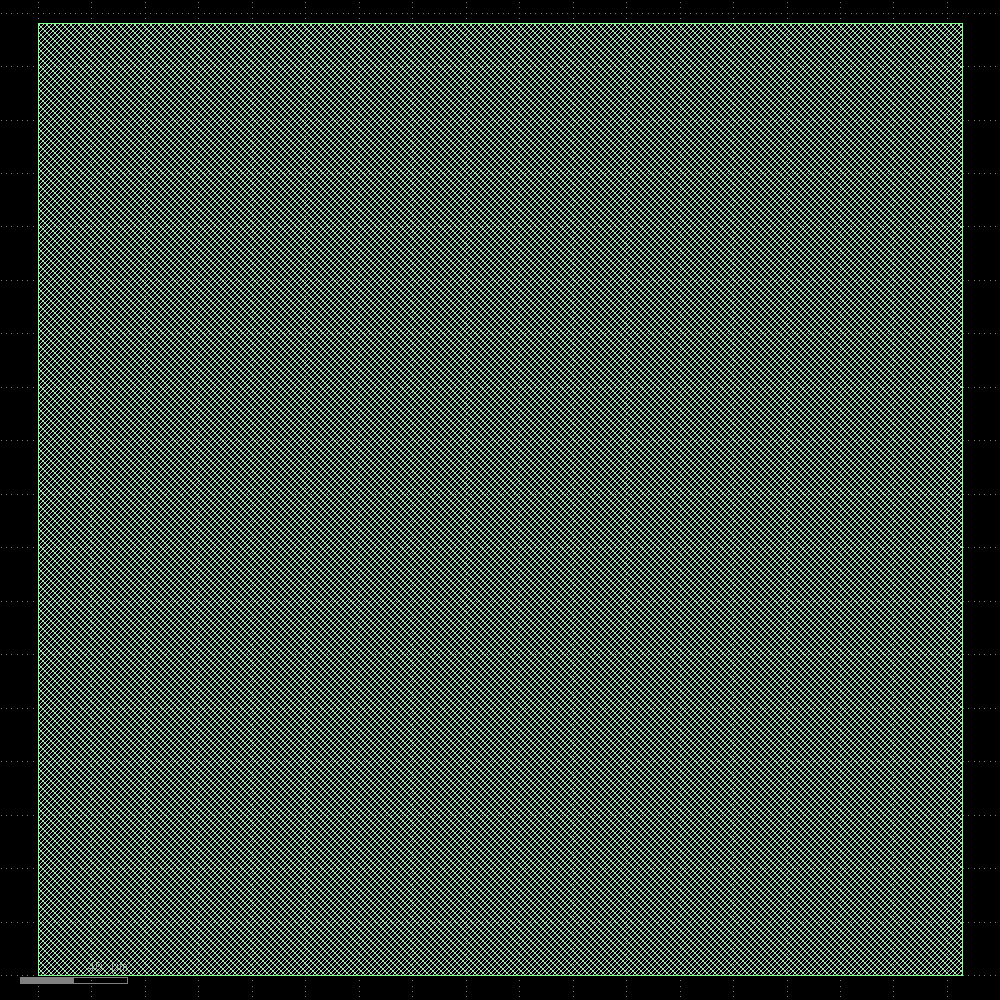

In [ ]:
display(floorplan)

### Tap/Endcap Cell Insertion

For our reference

This places two kinds of cells on the floorplan:

* End cap/boundary cells: Added at the beginning and end of each row. True to
  their name, they "cap off" the core area of a design.
* Tap cells: Placed in a polka dot-ish fashion across the rows. Tap cells
  connect VDD to the nwell and the psubstrate to VSS, which the majority of cells
  do not do themselves to save area- but if you go long enough without one such
  connection you end up with the cell "latching-up"; i.e.; refusing to switch
  back to LO from HI.

  There is a maximum distance between tap cells enforced as part of every
  foundry process.

In [ ]:
TapEndcapInsertion = Step.factory.get("OpenROAD.TapEndcapInsertion")

tdi = TapEndcapInsertion(state_in=floorplan.state_out)
tdi.start()

─────────────────────────────────────────────── Tap/Decap Insertion ───────────────────────────────────────────────

[12:18:56] VERBOSE  Running 'OpenROAD.TapEndcapInsertion'…                                             ]8;id=477515;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=130716;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:18:56] VERBOSE  Logging subprocess to                                                              ]8;id=521075;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=818477;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=20305;file:///content/openlane_run/3-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\openlane_run/]8;;\]8;id=635232;file:///content/openlane_run/3-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\3]8;;\]8;id=20305;file:///content/openlane_run/3-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log]8;;\…                    

Reading OpenROAD database at '/content/openlane_run/2-openroad-floorplan/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO TAP-0004] Inserted 244 endcaps.

[INFO TAP-0005] Inserted 1550 tapcells.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.nl.v
pnl,openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.pnl.v
def,openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.def
odb,openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.odb
sdc,openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:18:58] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=501912;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=55090;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:18:58] VERBOSE  Logging subprocess to ]8;id=765214;file:///tmp/openlane_klayout_tmp_5xyqfef8/klayout-render.log\..]8;;\]8;id=826467;file:///tmp/openlane_klayout_tmp_5xyqfef8/klayout-render.log\/tmp/openlane_klayout_tmp_5xyqfef8/]8;;\]8;id=743134;file:///tmp/openlane_klayout_tmp_5xyqfef8/klayout-render.log\klayout-render.log]8;;\…     ]8;id=969019;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=653853;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.83s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
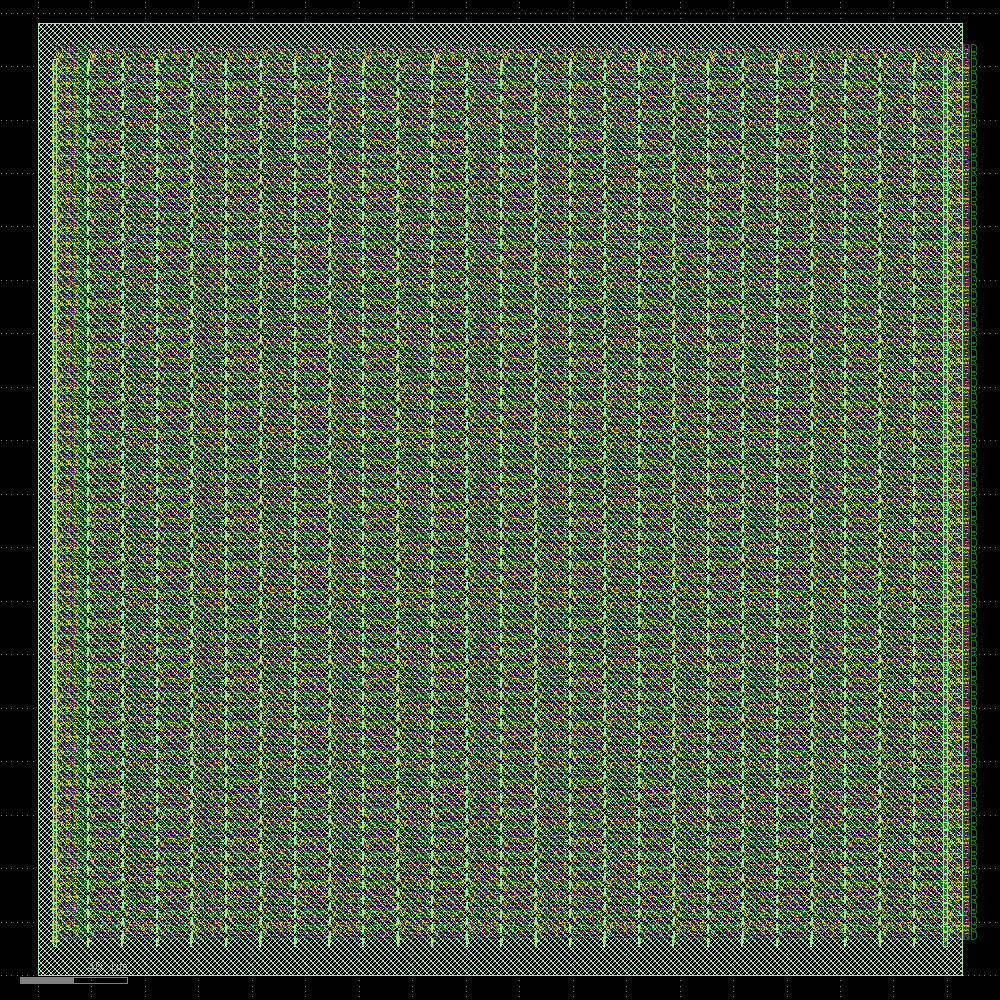

In [ ]:
display(tdi)

### I/O Placement

This places metal pins at the edges of the design corresponding to the top level
inputs and outputs for our design. These pins act as the interface with other
designs when we integrate it with other designs.

In [ ]:
IOPlacement = Step.factory.get("OpenROAD.IOPlacement")
ioplace = IOPlacement(state_in=tdi.state_out)
ioplace.start()

────────────────────────────────────────────────── I/O Placement ──────────────────────────────────────────────────

[12:18:59] VERBOSE  Running 'OpenROAD.IOPlacement'…                                                    ]8;id=480841;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=790900;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:18:59] VERBOSE  Logging subprocess to                                                              ]8;id=808928;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=789105;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=218967;file:///content/openlane_run/4-openroad-ioplacement/openroad-ioplacement.log\openlane_run/]8;;\]8;id=27746;file:///content/openlane_run/4-openroad-ioplacement/openroad-ioplacement.log\4]8;;\]8;id=218967;file:///content/openlane_run/4-openroad-ioplacement/openroad-ioplacement.log\-openroad-ioplacement/openroad-ioplacement.log]8;;\…                                  

Reading OpenROAD database at '/content/openlane_run/3-openroad-tapendcapinsertion/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] place_pins args: -min_distance 3

Found 0 macro blocks.

[INFO PPL-0010] Tentative 0 to set up sections.

[INFO PPL-0001] Number of slots           426

[INFO PPL-0002] Number of I/O             196

[INFO PPL-0003] Number of I/O w/sink      132

[INFO PPL-0004] Number of I/O w/o sink    64

[INFO PPL-0005] Slots per section         200

[INFO PPL-0006] Slots increase factor     0.01

[INFO PPL-0008] Successfully assigned pins to sections.

[INFO PPL-0012] I/O nets HPWL: 32796.82 um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/4-openroad-ioplacement/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/4-openroad-ioplacement/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/4-openroad-ioplacement/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/4-openroad-ioplacement/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/4-openroad-ioplacement/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/4-openroad-ioplacement/cordic_neuron.nl.v
pnl,openlane_run/4-openroad-ioplacement/cordic_neuron.pnl.v
def,openlane_run/4-openroad-ioplacement/cordic_neuron.def
odb,openlane_run/4-openroad-ioplacement/cordic_neuron.odb
sdc,openlane_run/4-openroad-ioplacement/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:19:01] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=756571;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=876525;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:01] VERBOSE  Logging subprocess to ]8;id=392171;file:///tmp/openlane_klayout_tmp_ifha0nei/klayout-render.log\..]8;;\]8;id=821852;file:///tmp/openlane_klayout_tmp_ifha0nei/klayout-render.log\/tmp/openlane_klayout_tmp_ifha0nei/]8;;\]8;id=45670;file:///tmp/openlane_klayout_tmp_ifha0nei/klayout-render.log\klayout-render.log]8;;\…     ]8;id=719553;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=728598;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.63s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
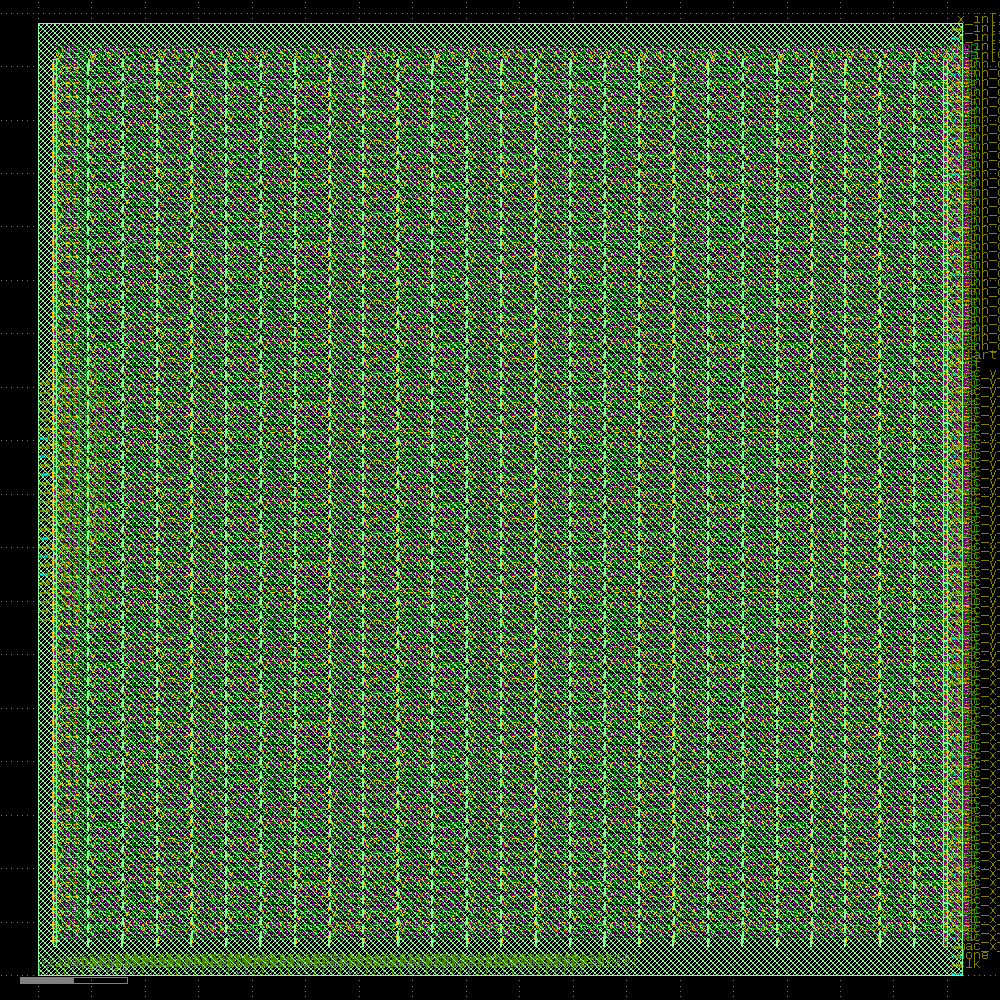

In [ ]:
display(ioplace)

### Generating the Power Distribution Network (PDN)

This creates the power distribution network for your design, which is essentially
a plaid pattern of horizontal and vertical "straps" across the design that is
then connected to the rails' VDD and VSS (via the tap cells.)

For reference, how the power distribution network works: https://openlane2.readthedocs.io/en/latest/usage/hardening_macros.html#pdn-generation

While we typically don't need to mess with the PDN too much, the SPM is a small
design, so we're going to need to make the plaid pattern formed by the PDN a bit
smaller.

In [ ]:
GeneratePDN = Step.factory.get("OpenROAD.GeneratePDN")

pdn = GeneratePDN(
    state_in=ioplace.state_out,
    FP_PDN_VWIDTH=3,
    FP_PDN_HWIDTH=3,
    FP_PDN_VPITCH=40,
    FP_PDN_HPITCH=40,
)
pdn.start()

────────────────────────────────────── Power Distribution Network Generation ──────────────────────────────────────

[12:19:02] VERBOSE  Running 'OpenROAD.GeneratePDN'…                                                    ]8;id=492459;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=207457;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:02] INFO     'FP_PDN_CFG' not explicitly set, setting it to                                 ]8;id=379533;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=262057;file:///content/openlane_ipynb/openlane/steps/openroad.py#1174\1174]8;;\
                    /content/openlane_ipynb/openlane/scripts/openroad/common/pdn_cfg.tcl…                          

[12:19:02] VERBOSE  Logging subprocess to                                                              ]8;id=541704;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=722562;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=522532;file:///content/openlane_run/5-openroad-generatepdn/openroad-generatepdn.log\openlane_run/]8;;\]8;id=121332;file:///content/openlane_run/5-openroad-generatepdn/openroad-generatepdn.log\5]8;;\]8;id=522532;file:///content/openlane_run/5-openroad-generatepdn/openroad-generatepdn.log\-openroad-generatepdn/openroad-generatepdn.log]8;;\…                                  

Reading OpenROAD database at '/content/openlane_run/4-openroad-ioplacement/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting global connections...

[INFO PDN-0001] Inserting grid: stdcell_grid

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/5-openroad-generatepdn/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/5-openroad-generatepdn/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/5-openroad-generatepdn/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/5-openroad-generatepdn/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/5-openroad-generatepdn/cordic_neuron.sdc'…

[INFO PSM-0040] All shapes on net VPWR are connected.

[INFO PSM-0040] All shapes on net VGND are connected.

Format,Path
nl,openlane_run/5-openroad-generatepdn/cordic_neuron.nl.v
pnl,openlane_run/5-openroad-generatepdn/cordic_neuron.pnl.v
def,openlane_run/5-openroad-generatepdn/cordic_neuron.def
odb,openlane_run/5-openroad-generatepdn/cordic_neuron.odb
sdc,openlane_run/5-openroad-generatepdn/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:19:04] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=166049;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=727226;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:04] VERBOSE  Logging subprocess to ]8;id=197062;file:///tmp/openlane_klayout_tmp_p6ckmt39/klayout-render.log\..]8;;\]8;id=549311;file:///tmp/openlane_klayout_tmp_p6ckmt39/klayout-render.log\/tmp/openlane_klayout_tmp_p6ckmt39/]8;;\]8;id=202760;file:///tmp/openlane_klayout_tmp_p6ckmt39/klayout-render.log\klayout-render.log]8;;\…     ]8;id=456920;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=942669;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.93s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
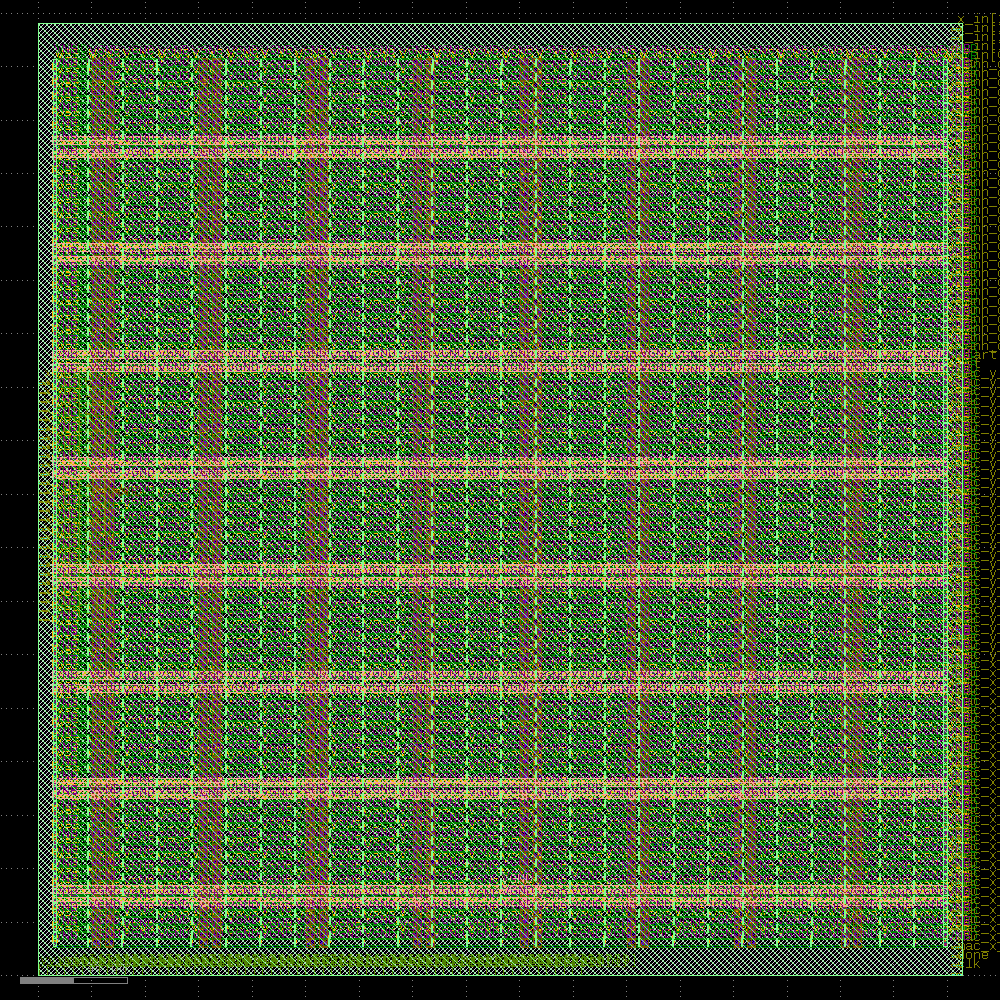

In [ ]:
display(pdn)

### Global Placement

Global Placement is deciding on a fuzzy, non-final location for each of the cells,
with the aim of minimizing the distance between cells that are connected
together (more specifically, the total length of the not-yet-created wires that
will connect them).

As we will see in the `.display()` in the second cell below, the placement is
considered "illegal", i.e., not properly aligned with the cell placement grid.
This is addressed by "Detailed Placement", also referred to as "placement
legalization", which is the next step.

In [ ]:
GlobalPlacement = Step.factory.get("OpenROAD.GlobalPlacement")
gpl = GlobalPlacement(state_in=pdn.state_out)
gpl.start()

──────────────────────────────────────────────── Global Placement ─────────────────────────────────────────────────

[12:19:06] VERBOSE  Running 'OpenROAD.GlobalPlacement'…                                                ]8;id=725791;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=391219;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:06] INFO     'PL_TARGET_DENSITY_PCT' not explicitly set, using dynamically calculated       ]8;id=40386;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=498217;file:///content/openlane_ipynb/openlane/steps/openroad.py#1260\1260]8;;\
                    target density: 62.160200…                                                                     

[12:19:06] VERBOSE  Logging subprocess to                                                              ]8;id=513145;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=874233;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=458482;file:///content/openlane_run/6-openroad-globalplacement/openroad-globalplacement.log\openlane_run/]8;;\]8;id=510590;file:///content/openlane_run/6-openroad-globalplacement/openroad-globalplacement.log\6]8;;\]8;id=458482;file:///content/openlane_run/6-openroad-globalplacement/openroad-globalplacement.log\-openroad-globalplacement/openroad-globalplacement.log]8;;\…                          

Reading OpenROAD database at '/content/openlane_run/5-openroad-generatepdn/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

[INFO GPL-0002] DBU: 1000

[INFO GPL-0003] SiteSize: (  0.460  2.720 ) um

[INFO GPL-0004] CoreBBox: (  5.520 10.880 ) ( 339.940 342.720 ) um

[INFO GPL-0006] NumInstances:              7182

[INFO GPL-0007] NumPlaceInstances:         5388

[INFO GPL-0008] NumFixedInstances:         1794

[INFO GPL-0009] NumDummyInstances:            0

[INFO GPL-0010] NumNets:                   5551

[INFO GPL-0011] NumPins:                  20648

[INFO GPL-0012] DieBBox:  (  0.000  0.000 ) ( 345.540 356.260 ) um

[INFO GPL-0013] CoreBBox: (  5.520 10.880 ) ( 339.940 342.720 ) um

[INFO GPL-0016] CoreArea:            110973.933 um^2

[INFO GPL-0017] NonPlaceInstsArea:     2855.238 um^2

[INFO GPL-0018] PlaceInstsArea:       55944.906 um^2

[INFO GPL-0019] Util:                    51.744 %

[INFO GPL-0020] StdInstsArea:         55944.906 um^2

[INFO GPL-0021] MacroInstsArea:           0.000 um^2

[InitialPlace]  Iter: 1 CG residual: 0.00240961 HPWL: 101636160

[InitialPlace]  Iter: 2 CG residual: 0.00215513 HPWL: 71091472

[InitialPlace]  Iter: 3 CG residual: 0.00081714 HPWL: 68143833

[InitialPlace]  Iter: 4 CG residual: 0.00009733 HPWL: 66848568

[InitialPlace]  Iter: 5 CG residual: 0.00006890 HPWL: 66308796

[InitialPlace]  Iter: 6 CG residual: 0.00040935 HPWL: 66155510

[InitialPlace]  Iter: 7 CG residual: 0.00000141 HPWL: 65949413

[INFO GPL-0031] FillerInit:NumGCells:      6521

[INFO GPL-0032] FillerInit:NumGNets:       5551

[INFO GPL-0033] FillerInit:NumGPins:      20648

[INFO GPL-0023] TargetDensity:            0.622

[INFO GPL-0024] AvrgPlaceInstArea:       10.383 um^2

[INFO GPL-0025] IdealBinArea:            16.704 um^2

[INFO GPL-0026] IdealBinCnt:               6643

[INFO GPL-0027] TotalBinArea:        110973.933 um^2

[INFO GPL-0028] BinCnt:        64     64

[INFO GPL-0029] BinSize: (  5.226  5.185 )

[INFO GPL-0030] NumBins: 4096

[NesterovSolve] Iter:    1 overflow: 0.973 HPWL: 33490303

[NesterovSolve] Iter:   10 overflow: 0.946 HPWL: 36780423

[NesterovSolve] Iter:   20 overflow: 0.935 HPWL: 38273509

[NesterovSolve] Iter:   30 overflow: 0.929 HPWL: 38571277

[NesterovSolve] Iter:   40 overflow: 0.926 HPWL: 38226021

[NesterovSolve] Iter:   50 overflow: 0.924 HPWL: 37947198

[NesterovSolve] Iter:   60 overflow: 0.923 HPWL: 37672626

[NesterovSolve] Iter:   70 overflow: 0.923 HPWL: 37418172

[NesterovSolve] Iter:   80 overflow: 0.922 HPWL: 37332009

[NesterovSolve] Iter:   90 overflow: 0.922 HPWL: 37339980

[NesterovSolve] Iter:  100 overflow: 0.922 HPWL: 37369916

[NesterovSolve] Iter:  110 overflow: 0.922 HPWL: 37413255

[NesterovSolve] Iter:  120 overflow: 0.921 HPWL: 37470859

[NesterovSolve] Iter:  130 overflow: 0.921 HPWL: 37557506

[NesterovSolve] Iter:  140 overflow: 0.919 HPWL: 37731908

[NesterovSolve] Iter:  150 overflow: 0.918 HPWL: 38067720

[NesterovSolve] Iter:  160 overflow: 0.917 HPWL: 38688491

[NesterovSolve] Iter:  170 overflow: 0.915 HPWL: 39919720

[NesterovSolve] Iter:  180 overflow: 0.909 HPWL: 42012417

[NesterovSolve] Iter:  190 overflow: 0.904 HPWL: 44601971

[NesterovSolve] Iter:  200 overflow: 0.892 HPWL: 48004435

[NesterovSolve] Iter:  210 overflow: 0.877 HPWL: 52653736

[NesterovSolve] Iter:  220 overflow: 0.858 HPWL: 58183351

[NesterovSolve] Iter:  230 overflow: 0.833 HPWL: 64401604

[NesterovSolve] Iter:  240 overflow: 0.806 HPWL: 71087433

[INFO GPL-0100] worst slack 3.65e-08

[INFO GPL-0103] Weighted 547 nets.

[NesterovSolve] Iter:  250 overflow: 0.771 HPWL: 78235527

[NesterovSolve] Iter:  260 overflow: 0.737 HPWL: 82977100

[NesterovSolve] Iter:  270 overflow: 0.707 HPWL: 87868329

[NesterovSolve] Iter:  280 overflow: 0.670 HPWL: 91781823

[INFO GPL-0100] worst slack 3.64e-08

[INFO GPL-0103] Weighted 548 nets.

[NesterovSolve] Iter:  290 overflow: 0.626 HPWL: 96253917

[NesterovSolve] Snapshot saved at iter = 295

[NesterovSolve] Iter:  300 overflow: 0.576 HPWL: 101770379

[NesterovSolve] Iter:  310 overflow: 0.531 HPWL: 105991714

[NesterovSolve] Iter:  320 overflow: 0.486 HPWL: 110501564

[INFO GPL-0100] worst slack 3.62e-08

[INFO GPL-0103] Weighted 548 nets.

[NesterovSolve] Iter:  330 overflow: 0.442 HPWL: 113911576

[NesterovSolve] Iter:  340 overflow: 0.399 HPWL: 116374805

[NesterovSolve] Iter:  350 overflow: 0.360 HPWL: 117988260

[NesterovSolve] Iter:  360 overflow: 0.322 HPWL: 119196553

[NesterovSolve] Iter:  370 overflow: 0.291 HPWL: 119785617

[INFO GPL-0100] worst slack 3.61e-08

[INFO GPL-0103] Weighted 548 nets.

[NesterovSolve] Iter:  380 overflow: 0.264 HPWL: 120561743

[NesterovSolve] Iter:  390 overflow: 0.236 HPWL: 121383701

[NesterovSolve] Iter:  400 overflow: 0.211 HPWL: 122044870

[INFO GPL-0100] worst slack 3.6e-08

[INFO GPL-0103] Weighted 548 nets.

[INFO GPL-0075] Routability numCall: 1 inflationIterCnt: 1 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 1.5500000715255737

[INFO GPL-0064] TotalRouteOverflowV2: 7.766667485237122

[INFO GPL-0065] OverflowTileCnt2: 54

[INFO GPL-0066] 0.5%RC: 1.2623

[INFO GPL-0067] 1.0%RC: 1.1688

[INFO GPL-0068] 2.0%RC: 1.0844

[INFO GPL-0069] 5.0%RC: 1.0339

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.2156

[INFO GPL-0078] FinalRC lower than minRC (1e+30), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:     1639.267 um^2

[INFO GPL-0046] TargetDensity:            0.622

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    55944.906 um^2

[INFO GPL-0051] TotalFillerArea:      11261.894 um^2

[INFO GPL-0052] TotalGCellsArea:      67206.799 um^2

[INFO GPL-0053] ExpectedGCellsArea:   68846.066 um^2

[INFO GPL-0054] NewTargetDensity:         0.637

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          68846.068 um^2

[INFO GPL-0057] NewNesterovInstArea:  57584.172 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.895 um^2

[INFO GPL-0059] NewTotalGCellsArea:   68846.068 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  410 overflow: 0.571 HPWL: 103337274

[NesterovSolve] Iter:  420 overflow: 0.536 HPWL: 106302070

[NesterovSolve] Iter:  430 overflow: 0.504 HPWL: 109086841

[NesterovSolve] Iter:  440 overflow: 0.465 HPWL: 112364764

[NesterovSolve] Iter:  450 overflow: 0.428 HPWL: 114222072

[NesterovSolve] Iter:  460 overflow: 0.397 HPWL: 115975815

[NesterovSolve] Iter:  470 overflow: 0.366 HPWL: 117278831

[NesterovSolve] Iter:  480 overflow: 0.329 HPWL: 118462858

[NesterovSolve] Iter:  490 overflow: 0.300 HPWL: 119514497

[NesterovSolve] Iter:  500 overflow: 0.273 HPWL: 120376325

[NesterovSolve] Iter:  510 overflow: 0.248 HPWL: 121214613

[NesterovSolve] Iter:  520 overflow: 0.218 HPWL: 121841159

[INFO GPL-0075] Routability numCall: 2 inflationIterCnt: 2 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.9500000476837158

[INFO GPL-0064] TotalRouteOverflowV2: 4.1000014543533325

[INFO GPL-0065] OverflowTileCnt2: 42

[INFO GPL-0066] 0.5%RC: 1.1435

[INFO GPL-0067] 1.0%RC: 1.0891

[INFO GPL-0068] 2.0%RC: 1.0446

[INFO GPL-0069] 5.0%RC: 1.0179

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1163

[INFO GPL-0078] FinalRC lower than minRC (1.2155797), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:     1078.814 um^2

[INFO GPL-0046] TargetDensity:            0.637

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    57584.172 um^2

[INFO GPL-0051] TotalFillerArea:      11261.895 um^2

[INFO GPL-0052] TotalGCellsArea:      68846.068 um^2

[INFO GPL-0053] ExpectedGCellsArea:   69924.882 um^2

[INFO GPL-0054] NewTargetDensity:         0.647

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          69924.880 um^2

[INFO GPL-0057] NewNesterovInstArea:  58662.986 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.894 um^2

[INFO GPL-0059] NewTotalGCellsArea:   69924.880 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  530 overflow: 0.590 HPWL: 100916276

[NesterovSolve] Iter:  540 overflow: 0.541 HPWL: 106597248

[NesterovSolve] Iter:  550 overflow: 0.513 HPWL: 108984236

[NesterovSolve] Iter:  560 overflow: 0.473 HPWL: 112212767

[NesterovSolve] Iter:  570 overflow: 0.441 HPWL: 114546341

[NesterovSolve] Iter:  580 overflow: 0.406 HPWL: 116160680

[NesterovSolve] Iter:  590 overflow: 0.375 HPWL: 117870244

[NesterovSolve] Iter:  600 overflow: 0.342 HPWL: 119114467

[NesterovSolve] Iter:  610 overflow: 0.311 HPWL: 119902823

[NesterovSolve] Iter:  620 overflow: 0.281 HPWL: 120872533

[NesterovSolve] Iter:  630 overflow: 0.252 HPWL: 121627655

[NesterovSolve] Iter:  640 overflow: 0.225 HPWL: 122241872

[NesterovSolve] Iter:  650 overflow: 0.201 HPWL: 122770732

[INFO GPL-0075] Routability numCall: 3 inflationIterCnt: 3 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.30000007152557373

[INFO GPL-0064] TotalRouteOverflowV2: 4.600000739097595

[INFO GPL-0065] OverflowTileCnt2: 37

[INFO GPL-0066] 0.5%RC: 1.1681

[INFO GPL-0067] 1.0%RC: 1.1000

[INFO GPL-0068] 2.0%RC: 1.0500

[INFO GPL-0069] 5.0%RC: 1.0166

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1341

[INFO GPL-0079] MinRC (1.1163044) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:      949.370 um^2

[INFO GPL-0046] TargetDensity:            0.647

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    58662.986 um^2

[INFO GPL-0051] TotalFillerArea:      11261.894 um^2

[INFO GPL-0052] TotalGCellsArea:      69924.880 um^2

[INFO GPL-0053] ExpectedGCellsArea:   70874.251 um^2

[INFO GPL-0054] NewTargetDensity:         0.656

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          70874.251 um^2

[INFO GPL-0057] NewNesterovInstArea:  59612.357 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.895 um^2

[INFO GPL-0059] NewTotalGCellsArea:   70874.251 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  660 overflow: 0.546 HPWL: 106748803

[NesterovSolve] Iter:  670 overflow: 0.521 HPWL: 108880640

[NesterovSolve] Iter:  680 overflow: 0.482 HPWL: 111550850

[NesterovSolve] Iter:  690 overflow: 0.449 HPWL: 114227607

[NesterovSolve] Iter:  700 overflow: 0.415 HPWL: 116211664

[NesterovSolve] Iter:  710 overflow: 0.383 HPWL: 117633886

[NesterovSolve] Iter:  720 overflow: 0.349 HPWL: 119031795

[NesterovSolve] Iter:  730 overflow: 0.316 HPWL: 120211790

[NesterovSolve] Iter:  740 overflow: 0.286 HPWL: 121078053

[NesterovSolve] Iter:  750 overflow: 0.260 HPWL: 121793387

[NesterovSolve] Iter:  760 overflow: 0.234 HPWL: 122404691

[NesterovSolve] Iter:  770 overflow: 0.207 HPWL: 123030510

[INFO GPL-0075] Routability numCall: 4 inflationIterCnt: 4 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.30000007152557373

[INFO GPL-0064] TotalRouteOverflowV2: 5.666667938232422

[INFO GPL-0065] OverflowTileCnt2: 46

[INFO GPL-0066] 0.5%RC: 1.1855

[INFO GPL-0067] 1.0%RC: 1.1232

[INFO GPL-0068] 2.0%RC: 1.0616

[INFO GPL-0069] 5.0%RC: 1.0247

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1543

[INFO GPL-0079] MinRC (1.1163044) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:     1033.916 um^2

[INFO GPL-0046] TargetDensity:            0.656

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    59612.357 um^2

[INFO GPL-0051] TotalFillerArea:      11261.895 um^2

[INFO GPL-0052] TotalGCellsArea:      70874.251 um^2

[INFO GPL-0053] ExpectedGCellsArea:   71908.167 um^2

[INFO GPL-0054] NewTargetDensity:         0.665

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          71908.164 um^2

[INFO GPL-0057] NewNesterovInstArea:  60646.272 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.891 um^2

[INFO GPL-0059] NewTotalGCellsArea:   71908.164 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  780 overflow: 0.553 HPWL: 106597129

[NesterovSolve] Iter:  790 overflow: 0.525 HPWL: 109201244

[NesterovSolve] Iter:  800 overflow: 0.490 HPWL: 111552364

[NesterovSolve] Iter:  810 overflow: 0.452 HPWL: 114354511

[NesterovSolve] Iter:  820 overflow: 0.418 HPWL: 116519337

[NesterovSolve] Iter:  830 overflow: 0.385 HPWL: 117975141

[NesterovSolve] Iter:  840 overflow: 0.355 HPWL: 119523968

[NesterovSolve] Iter:  850 overflow: 0.324 HPWL: 120396349

[NesterovSolve] Iter:  860 overflow: 0.294 HPWL: 121232660

[NesterovSolve] Iter:  870 overflow: 0.265 HPWL: 121955444

[NesterovSolve] Iter:  880 overflow: 0.236 HPWL: 122608324

[NesterovSolve] Iter:  890 overflow: 0.210 HPWL: 123116576

[INFO GPL-0075] Routability numCall: 5 inflationIterCnt: 0 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.20000004768371582

[INFO GPL-0064] TotalRouteOverflowV2: 3.3333338499069214

[INFO GPL-0065] OverflowTileCnt2: 28

[INFO GPL-0066] 0.5%RC: 1.1362

[INFO GPL-0067] 1.0%RC: 1.0725

[INFO GPL-0068] 2.0%RC: 1.0362

[INFO GPL-0069] 5.0%RC: 1.0073

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1043

[INFO GPL-0078] FinalRC lower than minRC (1.1163044), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      655.864 um^2

[INFO GPL-0046] TargetDensity:            0.665

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    60646.272 um^2

[INFO GPL-0051] TotalFillerArea:      11261.891 um^2

[INFO GPL-0052] TotalGCellsArea:      71908.164 um^2

[INFO GPL-0053] ExpectedGCellsArea:   72564.028 um^2

[INFO GPL-0054] NewTargetDensity:         0.671

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          72564.031 um^2

[INFO GPL-0057] NewNesterovInstArea:  61302.137 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.895 um^2

[INFO GPL-0059] NewTotalGCellsArea:   72564.031 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  900 overflow: 0.564 HPWL: 105581222

[NesterovSolve] Iter:  910 overflow: 0.530 HPWL: 109178685

[NesterovSolve] Iter:  920 overflow: 0.499 HPWL: 111256178

[NesterovSolve] Iter:  930 overflow: 0.457 HPWL: 114118151

[NesterovSolve] Iter:  940 overflow: 0.428 HPWL: 116348170

[NesterovSolve] Iter:  950 overflow: 0.394 HPWL: 118005902

[NesterovSolve] Iter:  960 overflow: 0.359 HPWL: 119514581

[NesterovSolve] Iter:  970 overflow: 0.330 HPWL: 120415140

[NesterovSolve] Iter:  980 overflow: 0.297 HPWL: 121339815

[NesterovSolve] Iter:  990 overflow: 0.269 HPWL: 122064637

[NesterovSolve] Iter: 1000 overflow: 0.243 HPWL: 122620720

[NesterovSolve] Iter: 1010 overflow: 0.215 HPWL: 123222038

[INFO GPL-0075] Routability numCall: 6 inflationIterCnt: 1 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 1.0500000715255737

[INFO GPL-0064] TotalRouteOverflowV2: 3.2333338260650635

[INFO GPL-0065] OverflowTileCnt2: 28

[INFO GPL-0066] 0.5%RC: 1.1406

[INFO GPL-0067] 1.0%RC: 1.0703

[INFO GPL-0068] 2.0%RC: 1.0351

[INFO GPL-0069] 5.0%RC: 1.0098

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1054

[INFO GPL-0079] MinRC (1.1043478) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:     1021.106 um^2

[INFO GPL-0046] TargetDensity:            0.671

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    61302.137 um^2

[INFO GPL-0051] TotalFillerArea:      11261.895 um^2

[INFO GPL-0052] TotalGCellsArea:      72564.031 um^2

[INFO GPL-0053] ExpectedGCellsArea:   73585.138 um^2

[INFO GPL-0054] NewTargetDensity:         0.681

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          73585.140 um^2

[INFO GPL-0057] NewNesterovInstArea:  62323.243 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.896 um^2

[INFO GPL-0059] NewTotalGCellsArea:   73585.140 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1020 overflow: 0.583 HPWL: 103687791

[NesterovSolve] Iter: 1030 overflow: 0.531 HPWL: 109775008

[NesterovSolve] Iter: 1040 overflow: 0.504 HPWL: 111583362

[NesterovSolve] Iter: 1050 overflow: 0.464 HPWL: 114123294

[NesterovSolve] Iter: 1060 overflow: 0.436 HPWL: 116259250

[NesterovSolve] Iter: 1070 overflow: 0.397 HPWL: 118056536

[NesterovSolve] Iter: 1080 overflow: 0.365 HPWL: 119479529

[NesterovSolve] Iter: 1090 overflow: 0.332 HPWL: 120553788

[NesterovSolve] Iter: 1100 overflow: 0.299 HPWL: 121660880

[NesterovSolve] Iter: 1110 overflow: 0.273 HPWL: 122343458

[NesterovSolve] Iter: 1120 overflow: 0.244 HPWL: 122910713

[NesterovSolve] Iter: 1130 overflow: 0.219 HPWL: 123577076

[INFO GPL-0075] Routability numCall: 7 inflationIterCnt: 2 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.6000000238418579

[INFO GPL-0064] TotalRouteOverflowV2: 5.633334636688232

[INFO GPL-0065] OverflowTileCnt2: 41

[INFO GPL-0066] 0.5%RC: 1.1986

[INFO GPL-0067] 1.0%RC: 1.1225

[INFO GPL-0068] 2.0%RC: 1.0612

[INFO GPL-0069] 5.0%RC: 1.0246

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1605

[INFO GPL-0079] MinRC (1.1043478) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:     1361.621 um^2

[INFO GPL-0046] TargetDensity:            0.681

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    62323.243 um^2

[INFO GPL-0051] TotalFillerArea:      11261.896 um^2

[INFO GPL-0052] TotalGCellsArea:      73585.140 um^2

[INFO GPL-0053] ExpectedGCellsArea:   74946.760 um^2

[INFO GPL-0054] NewTargetDensity:         0.693

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          74946.757 um^2

[INFO GPL-0057] NewNesterovInstArea:  63684.864 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.893 um^2

[INFO GPL-0059] NewTotalGCellsArea:   74946.757 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1140 overflow: 0.582 HPWL: 104259145

[NesterovSolve] Iter: 1150 overflow: 0.528 HPWL: 110935364

[NesterovSolve] Iter: 1160 overflow: 0.502 HPWL: 112572253

[NesterovSolve] Iter: 1170 overflow: 0.463 HPWL: 114731584

[NesterovSolve] Iter: 1180 overflow: 0.431 HPWL: 117005070

[NesterovSolve] Iter: 1190 overflow: 0.395 HPWL: 118784168

[NesterovSolve] Iter: 1200 overflow: 0.365 HPWL: 119977377

[NesterovSolve] Iter: 1210 overflow: 0.331 HPWL: 121135839

[NesterovSolve] Iter: 1220 overflow: 0.298 HPWL: 122051228

[NesterovSolve] Iter: 1230 overflow: 0.269 HPWL: 122876219

[NesterovSolve] Iter: 1240 overflow: 0.241 HPWL: 123466686

[NesterovSolve] Iter: 1250 overflow: 0.217 HPWL: 124090827

[INFO GPL-0075] Routability numCall: 8 inflationIterCnt: 3 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.10000002384185791

[INFO GPL-0064] TotalRouteOverflowV2: 2.4666671752929688

[INFO GPL-0065] OverflowTileCnt2: 21

[INFO GPL-0066] 0.5%RC: 1.1072

[INFO GPL-0067] 1.0%RC: 1.0536

[INFO GPL-0068] 2.0%RC: 1.0268

[INFO GPL-0069] 5.0%RC: 1.0052

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0804

[INFO GPL-0078] FinalRC lower than minRC (1.1043478), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      591.232 um^2

[INFO GPL-0046] TargetDensity:            0.693

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    63684.864 um^2

[INFO GPL-0051] TotalFillerArea:      11261.893 um^2

[INFO GPL-0052] TotalGCellsArea:      74946.757 um^2

[INFO GPL-0053] ExpectedGCellsArea:   75537.989 um^2

[INFO GPL-0054] NewTargetDensity:         0.699

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          75537.990 um^2

[INFO GPL-0057] NewNesterovInstArea:  64276.096 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.894 um^2

[INFO GPL-0059] NewTotalGCellsArea:   75537.990 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1260 overflow: 0.583 HPWL: 104501084

[NesterovSolve] Iter: 1270 overflow: 0.526 HPWL: 111490618

[NesterovSolve] Iter: 1280 overflow: 0.502 HPWL: 112888078

[NesterovSolve] Iter: 1290 overflow: 0.462 HPWL: 115050728

[NesterovSolve] Iter: 1300 overflow: 0.430 HPWL: 117373247

[NesterovSolve] Iter: 1310 overflow: 0.396 HPWL: 119079363

[NesterovSolve] Iter: 1320 overflow: 0.366 HPWL: 120187965

[NesterovSolve] Iter: 1330 overflow: 0.329 HPWL: 121427949

[NesterovSolve] Iter: 1340 overflow: 0.297 HPWL: 122310849

[NesterovSolve] Iter: 1350 overflow: 0.267 HPWL: 123086664

[NesterovSolve] Iter: 1360 overflow: 0.244 HPWL: 123612870

[NesterovSolve] Iter: 1370 overflow: 0.218 HPWL: 124237534

[INFO GPL-0075] Routability numCall: 9 inflationIterCnt: 4 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.20000004768371582

[INFO GPL-0064] TotalRouteOverflowV2: 4.066667437553406

[INFO GPL-0065] OverflowTileCnt2: 33

[INFO GPL-0066] 0.5%RC: 1.1536

[INFO GPL-0067] 1.0%RC: 1.0884

[INFO GPL-0068] 2.0%RC: 1.0442

[INFO GPL-0069] 5.0%RC: 1.0122

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1210

[INFO GPL-0079] MinRC (1.0804348) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:      987.302 um^2

[INFO GPL-0046] TargetDensity:            0.699

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    64276.096 um^2

[INFO GPL-0051] TotalFillerArea:      11261.894 um^2

[INFO GPL-0052] TotalGCellsArea:      75537.990 um^2

[INFO GPL-0053] ExpectedGCellsArea:   76525.292 um^2

[INFO GPL-0054] NewTargetDensity:         0.708

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          76525.289 um^2

[INFO GPL-0057] NewNesterovInstArea:  65263.398 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.891 um^2

[INFO GPL-0059] NewTotalGCellsArea:   76525.289 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1380 overflow: 0.582 HPWL: 104871925

[NesterovSolve] Iter: 1390 overflow: 0.525 HPWL: 112177562

[NesterovSolve] Iter: 1400 overflow: 0.500 HPWL: 113707372

[NesterovSolve] Iter: 1410 overflow: 0.464 HPWL: 115560230

[NesterovSolve] Iter: 1420 overflow: 0.426 HPWL: 118227159

[NesterovSolve] Iter: 1430 overflow: 0.396 HPWL: 119431040

[NesterovSolve] Iter: 1440 overflow: 0.362 HPWL: 120815517

[NesterovSolve] Iter: 1450 overflow: 0.327 HPWL: 121880063

[NesterovSolve] Iter: 1460 overflow: 0.299 HPWL: 122809978

[NesterovSolve] Iter: 1470 overflow: 0.268 HPWL: 123766117

[NesterovSolve] Iter: 1480 overflow: 0.240 HPWL: 124448583

[NesterovSolve] Iter: 1490 overflow: 0.214 HPWL: 125004112

[INFO GPL-0075] Routability numCall: 10 inflationIterCnt: 0 bloatIterCnt: 2

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.20000004768371582

[INFO GPL-0064] TotalRouteOverflowV2: 2.1000006198883057

[INFO GPL-0065] OverflowTileCnt2: 21

[INFO GPL-0066] 0.5%RC: 1.0913

[INFO GPL-0067] 1.0%RC: 1.0457

[INFO GPL-0068] 2.0%RC: 1.0228

[INFO GPL-0069] 5.0%RC: 1.0092

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0685

[INFO GPL-0078] FinalRC lower than minRC (1.0804348), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      530.138 um^2

[INFO GPL-0046] TargetDensity:            0.708

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    65263.398 um^2

[INFO GPL-0051] TotalFillerArea:      11261.891 um^2

[INFO GPL-0052] TotalGCellsArea:      76525.289 um^2

[INFO GPL-0053] ExpectedGCellsArea:   77055.427 um^2

[INFO GPL-0054] NewTargetDensity:         0.713

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          77055.427 um^2

[INFO GPL-0057] NewNesterovInstArea:  65793.536 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.890 um^2

[INFO GPL-0059] NewTotalGCellsArea:   77055.427 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1500 overflow: 0.565 HPWL: 107793435

[NesterovSolve] Iter: 1510 overflow: 0.523 HPWL: 112658047

[NesterovSolve] Iter: 1520 overflow: 0.496 HPWL: 114109419

[NesterovSolve] Iter: 1530 overflow: 0.458 HPWL: 116202206

[NesterovSolve] Iter: 1540 overflow: 0.427 HPWL: 118532458

[NesterovSolve] Iter: 1550 overflow: 0.391 HPWL: 120040160

[NesterovSolve] Iter: 1560 overflow: 0.359 HPWL: 121143430

[NesterovSolve] Iter: 1570 overflow: 0.323 HPWL: 122221408

[NesterovSolve] Iter: 1580 overflow: 0.295 HPWL: 123050358

[NesterovSolve] Iter: 1590 overflow: 0.265 HPWL: 123764014

[NesterovSolve] Iter: 1600 overflow: 0.236 HPWL: 124226120

[NesterovSolve] Iter: 1610 overflow: 0.211 HPWL: 124859633

[INFO GPL-0075] Routability numCall: 11 inflationIterCnt: 1 bloatIterCnt: 2

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0.20000004768371582

[INFO GPL-0064] TotalRouteOverflowV2: 2.800000786781311

[INFO GPL-0065] OverflowTileCnt2: 27

[INFO GPL-0066] 0.5%RC: 1.1159

[INFO GPL-0067] 1.0%RC: 1.0609

[INFO GPL-0068] 2.0%RC: 1.0304

[INFO GPL-0069] 5.0%RC: 1.0122

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0884

[INFO GPL-0079] MinRC (1.0684782) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:      676.550 um^2

[INFO GPL-0046] TargetDensity:            0.713

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    65793.536 um^2

[INFO GPL-0051] TotalFillerArea:      11261.890 um^2

[INFO GPL-0052] TotalGCellsArea:      77055.427 um^2

[INFO GPL-0053] ExpectedGCellsArea:   77731.977 um^2

[INFO GPL-0054] NewTargetDensity:         0.719

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          77731.979 um^2

[INFO GPL-0057] NewNesterovInstArea:  66470.087 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.893 um^2

[INFO GPL-0059] NewTotalGCellsArea:   77731.979 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1620 overflow: 0.564 HPWL: 108415685

[NesterovSolve] Iter: 1630 overflow: 0.523 HPWL: 113412675

[NesterovSolve] Iter: 1640 overflow: 0.495 HPWL: 114488469

[NesterovSolve] Iter: 1650 overflow: 0.456 HPWL: 116614734

[NesterovSolve] Iter: 1660 overflow: 0.424 HPWL: 119065475

[NesterovSolve] Iter: 1670 overflow: 0.390 HPWL: 120341995

[NesterovSolve] Iter: 1680 overflow: 0.356 HPWL: 121516624

[NesterovSolve] Iter: 1690 overflow: 0.320 HPWL: 122558158

[NesterovSolve] Iter: 1700 overflow: 0.295 HPWL: 123203130

[NesterovSolve] Iter: 1710 overflow: 0.264 HPWL: 123882380

[NesterovSolve] Iter: 1720 overflow: 0.238 HPWL: 124569866

[NesterovSolve] Iter: 1730 overflow: 0.212 HPWL: 125168159

[INFO GPL-0075] Routability numCall: 12 inflationIterCnt: 2 bloatIterCnt: 2

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 2.2000006437301636

[INFO GPL-0065] OverflowTileCnt2: 21

[INFO GPL-0066] 0.5%RC: 1.0957

[INFO GPL-0067] 1.0%RC: 1.0478

[INFO GPL-0068] 2.0%RC: 1.0239

[INFO GPL-0069] 5.0%RC: 1.0012

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0717

[INFO GPL-0079] MinRC (1.0684782) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:      475.237 um^2

[INFO GPL-0046] TargetDensity:            0.719

[INFO GPL-0049] WhiteSpaceArea:      108118.694 um^2

[INFO GPL-0050] NesterovInstsArea:    66470.087 um^2

[INFO GPL-0051] TotalFillerArea:      11261.893 um^2

[INFO GPL-0052] TotalGCellsArea:      77731.979 um^2

[INFO GPL-0053] ExpectedGCellsArea:   78207.217 um^2

[INFO GPL-0054] NewTargetDensity:         0.723

[INFO GPL-0055] NewWhiteSpaceArea:   108118.694 um^2

[INFO GPL-0056] MovableArea:          78207.214 um^2

[INFO GPL-0057] NewNesterovInstArea:  66945.324 um^2

[INFO GPL-0058] NewTotalFillerArea:   11261.890 um^2

[INFO GPL-0059] NewTotalGCellsArea:   78207.214 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1740 overflow: 0.547 HPWL: 110364017

[NesterovSolve] Iter: 1750 overflow: 0.520 HPWL: 113975173

[NesterovSolve] Iter: 1760 overflow: 0.489 HPWL: 114706891

[NesterovSolve] Iter: 1770 overflow: 0.453 HPWL: 117021889

[NesterovSolve] Iter: 1780 overflow: 0.420 HPWL: 119376469

[NesterovSolve] Iter: 1790 overflow: 0.388 HPWL: 120507602

[NesterovSolve] Iter: 1800 overflow: 0.352 HPWL: 121699423

[NesterovSolve] Iter: 1810 overflow: 0.318 HPWL: 122931633

[NesterovSolve] Iter: 1820 overflow: 0.292 HPWL: 123528477

[NesterovSolve] Iter: 1830 overflow: 0.262 HPWL: 124252532

[NesterovSolve] Iter: 1840 overflow: 0.235 HPWL: 124836225

[NesterovSolve] Iter: 1850 overflow: 0.208 HPWL: 125420812

[INFO GPL-0075] Routability numCall: 13 inflationIterCnt: 3 bloatIterCnt: 2

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      50   51

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 2550

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 3.100000500679016

[INFO GPL-0065] OverflowTileCnt2: 23

[INFO GPL-0066] 0.5%RC: 1.1348

[INFO GPL-0067] 1.0%RC: 1.0674

[INFO GPL-0068] 2.0%RC: 1.0337

[INFO GPL-0069] 5.0%RC: 1.0135

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1011

[INFO GPL-0079] MinRC (1.0684782) violation occurred, total count: 3.

[INFO GPL-0045] InflatedAreaDelta:      726.509 um^2

[INFO GPL-0046] TargetDensity:            0.723

Revert Routability Procedure. Target density higher than max, or minRC max violations.

[INFO GPL-0080] minRcViolatedCnt: 3

[INFO GPL-0047] SavedMinRC: 1.0685

[INFO GPL-0048] SavedTargetDensity: 0.7078

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1860 overflow: 0.538 HPWL: 108720130

[NesterovSolve] Iter: 1870 overflow: 0.515 HPWL: 111913553

[NesterovSolve] Iter: 1880 overflow: 0.478 HPWL: 113552368

[NesterovSolve] Iter: 1890 overflow: 0.444 HPWL: 116020567

[NesterovSolve] Iter: 1900 overflow: 0.411 HPWL: 118101875

[NesterovSolve] Iter: 1910 overflow: 0.377 HPWL: 119531338

[NesterovSolve] Iter: 1920 overflow: 0.346 HPWL: 120836808

[NesterovSolve] Iter: 1930 overflow: 0.313 HPWL: 121982066

[NesterovSolve] Iter: 1940 overflow: 0.286 HPWL: 122831253

[NesterovSolve] Iter: 1950 overflow: 0.256 HPWL: 123668896

[NesterovSolve] Iter: 1960 overflow: 0.229 HPWL: 124597549

[NesterovSolve] Iter: 1970 overflow: 0.202 HPWL: 125207414

[NesterovSolve] Iter: 1980 overflow: 0.179 HPWL: 125831939

[NesterovSolve] Iter: 1990 overflow: 0.155 HPWL: 126354082

[INFO GPL-0100] worst slack 3.61e-08

[INFO GPL-0103] Weighted 548 nets.

[NesterovSolve] Iter: 2000 overflow: 0.136 HPWL: 126830696

[NesterovSolve] Iter: 2010 overflow: 0.116 HPWL: 127356001

[NesterovSolve] Finished with Overflow: 0.099569

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/6-openroad-globalplacement/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/6-openroad-globalplacement/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/6-openroad-globalplacement/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/6-openroad-globalplacement/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/6-openroad-globalplacement/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/6-openroad-globalplacement/cordic_neuron.nl.v
pnl,openlane_run/6-openroad-globalplacement/cordic_neuron.pnl.v
def,openlane_run/6-openroad-globalplacement/cordic_neuron.def
odb,openlane_run/6-openroad-globalplacement/cordic_neuron.odb
sdc,openlane_run/6-openroad-globalplacement/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:19:47] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=830187;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=822390;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:47] VERBOSE  Logging subprocess to ]8;id=808369;file:///tmp/openlane_klayout_tmp_lalghwwz/klayout-render.log\..]8;;\]8;id=30447;file:///tmp/openlane_klayout_tmp_lalghwwz/klayout-render.log\/tmp/openlane_klayout_tmp_lalghwwz/]8;;\]8;id=473999;file:///tmp/openlane_klayout_tmp_lalghwwz/klayout-render.log\klayout-render.log]8;;\…     ]8;id=7705;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=538584;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 41.68s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
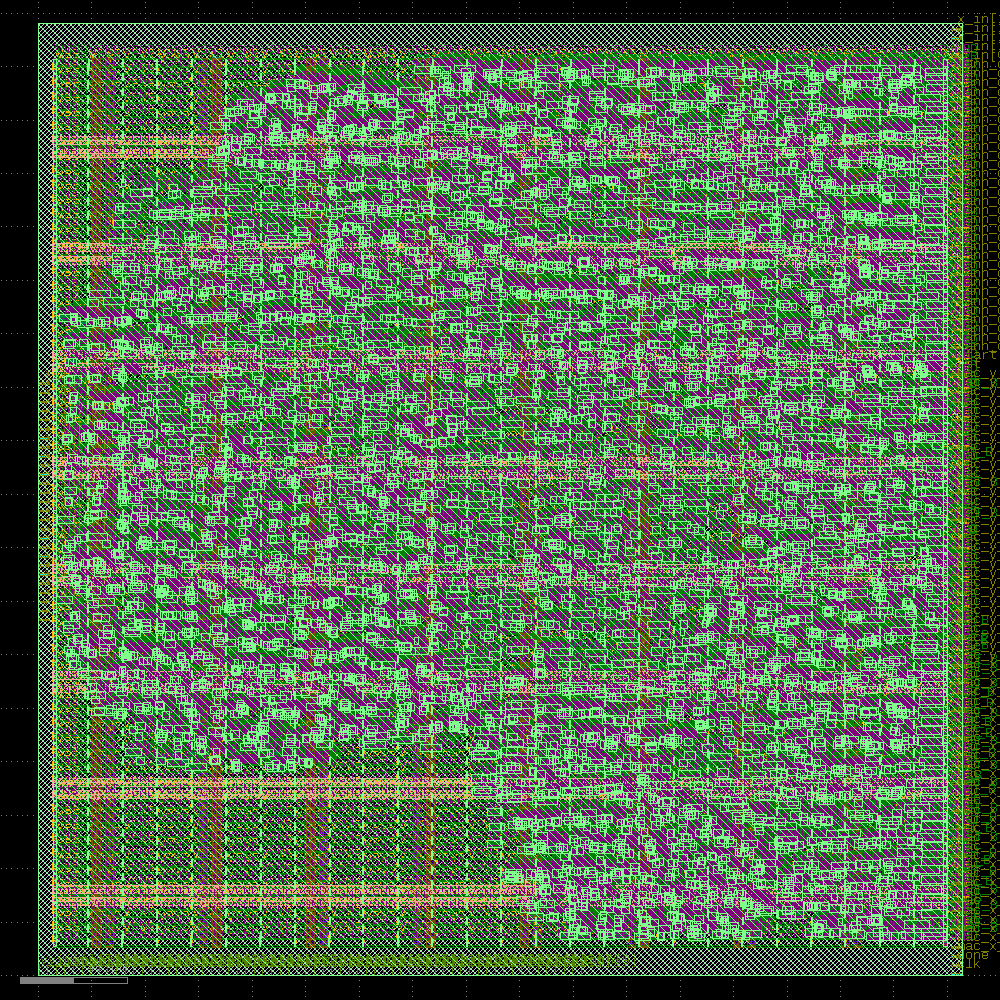

In [ ]:
display(gpl)

### Detailed Placement

This aligns the fuzzy placement from before with the grid, "legalizing" it.

In [ ]:
DetailedPlacement = Step.factory.get("OpenROAD.DetailedPlacement")

dpl = DetailedPlacement(state_in=gpl.state_out)
dpl.start()

─────────────────────────────────────────────── Detailed Placement ────────────────────────────────────────────────

[12:19:49] VERBOSE  Running 'OpenROAD.DetailedPlacement'…                                              ]8;id=77025;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=891313;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:49] VERBOSE  Logging subprocess to                                                              ]8;id=483685;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=934649;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=26274;file:///content/openlane_run/7-openroad-detailedplacement/openroad-detailedplacement.log\openlane_run/]8;;\]8;id=354775;file:///content/openlane_run/7-openroad-detailedplacement/openroad-detailedplacement.log\7]8;;\]8;id=26274;file:///content/openlane_run/7-openroad-detailedplacement/openroad-detailedplacement.log\-openroad-detailedplacement/openroad-detailedplacement.log]8;;\…                      

Reading OpenROAD database at '/content/openlane_run/6-openroad-globalplacement/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Placement Analysis

---------------------------------

total displacement      13505.4 u

average displacement        1.9 u

max displacement            9.9 u

original HPWL          127906.8 u

legalized HPWL         141617.5 u

delta HPWL                   11 %

[INFO DPL-0020] Mirrored 1981 instances

[INFO DPL-0021] HPWL before          141617.5 u

[INFO DPL-0022] HPWL after           138193.1 u

[INFO DPL-0023] HPWL delta               -2.4 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/7-openroad-detailedplacement/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/7-openroad-detailedplacement/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/7-openroad-detailedplacement/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/7-openroad-detailedplacement/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/7-openroad-detailedplacement/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/7-openroad-detailedplacement/cordic_neuron.nl.v
pnl,openlane_run/7-openroad-detailedplacement/cordic_neuron.pnl.v
def,openlane_run/7-openroad-detailedplacement/cordic_neuron.def
odb,openlane_run/7-openroad-detailedplacement/cordic_neuron.odb
sdc,openlane_run/7-openroad-detailedplacement/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:19:50] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=381628;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=320264;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:50] VERBOSE  Logging subprocess to ]8;id=504439;file:///tmp/openlane_klayout_tmp_0a5duytw/klayout-render.log\..]8;;\]8;id=210433;file:///tmp/openlane_klayout_tmp_0a5duytw/klayout-render.log\/tmp/openlane_klayout_tmp_0a5duytw/]8;;\]8;id=190495;file:///tmp/openlane_klayout_tmp_0a5duytw/klayout-render.log\klayout-render.log]8;;\…     ]8;id=739931;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=370859;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.32s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
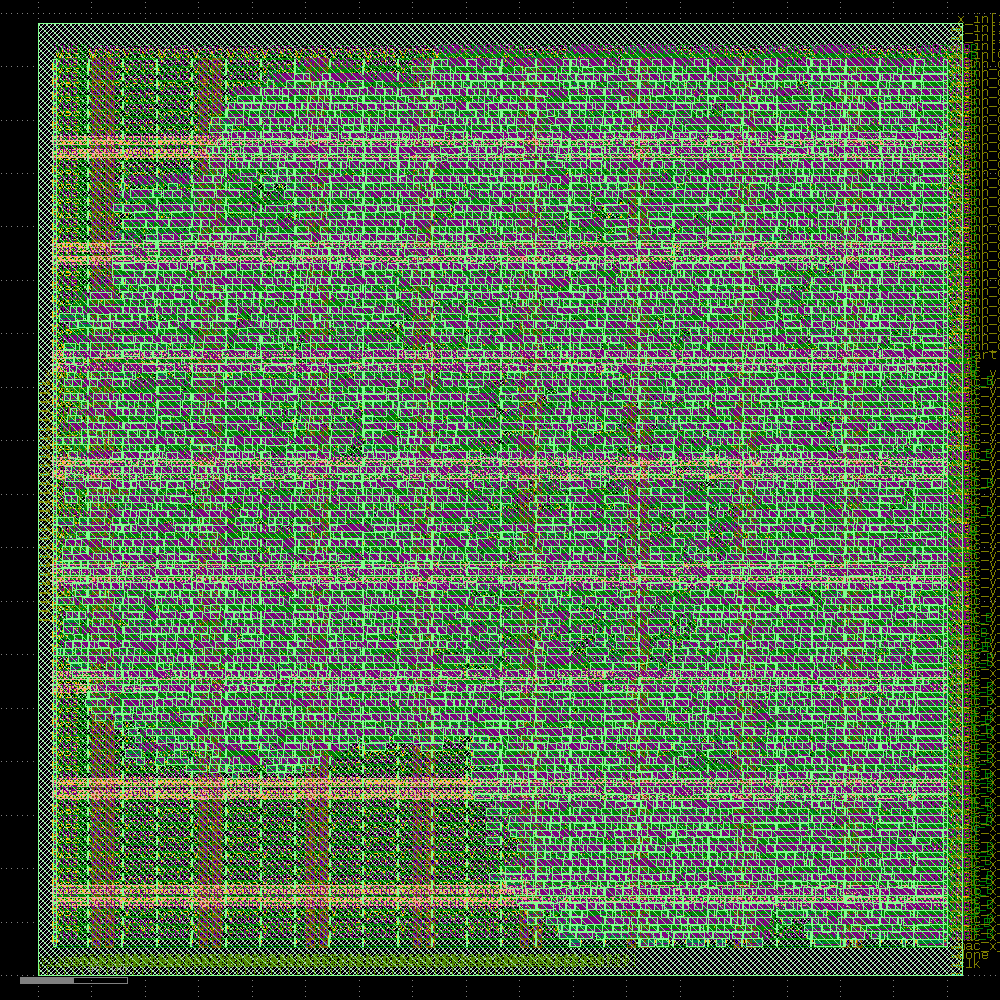

In [ ]:
display(dpl)

### Clock Tree Synthesis (CTS)

With the cells now having a final placement, we can go ahead and create what
is known as the clock tree, i.e., the hierarchical set of buffers used
for clock signal to minimize what is known as "clock skew"- variable delay
of the clock cycle from register to register because of factors such as metal
wire length, clock load (number of gates connected to the same clock buffer,)
etc.

The CTS step creates the cells and places them between the gaps in the detailed
placement above.

In [ ]:
CTS = Step.factory.get("OpenROAD.CTS")
cts = CTS(state_in=dpl.state_out)
cts.start()

────────────────────────────────────────────── Clock Tree Synthesis ───────────────────────────────────────────────

[12:19:51] VERBOSE  Running 'OpenROAD.CTS'…                                                            ]8;id=921220;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=169859;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:19:51] VERBOSE  Logging subprocess to ]8;id=851286;file:///content/openlane_run/8-openroad-cts/openroad-cts.log\openlane_run/]8;;\]8;id=117823;file:///content/openlane_run/8-openroad-cts/openroad-cts.log\8]8;;\]8;id=851286;file:///content/openlane_run/8-openroad-cts/openroad-cts.log\-openroad-cts/openroad-cts.log]8;;\…                ]8;id=97016;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=977623;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading timing models for corner nom_tt_025C_1v80…

Reading timing library for the 'nom_tt_025C_1v80' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading timing models for corner nom_ff_n40C_1v95…

Reading timing library for the 'nom_ff_n40C_1v95' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib'…

Reading timing models for corner nom_ss_100C_1v60…

Reading timing library for the 'nom_ss_100C_1v60' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib'…

Reading OpenROAD database at '/content/openlane_run/7-openroad-detailedplacement/cordic_neuron.odb'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Configuring cts characterization…

[INFO] Performing clock tree synthesis…

[INFO] Looking for the following net(s): clk

[INFO] Running Clock Tree Synthesis…

[INFO CTS-0050] Root buffer is sky130_fd_sc_hd__clkbuf_16.

[INFO CTS-0051] Sink buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0052] The following clock buffers will be used for CTS:

sky130_fd_sc_hd__clkbuf_2

sky130_fd_sc_hd__clkbuf_4

sky130_fd_sc_hd__clkbuf_8

[INFO CTS-0049] Characterization buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0007] Net "clk" found for clock "clk".

[INFO CTS-0010]  Clock net "clk" has 322 sinks.

[INFO CTS-0008] TritonCTS found 1 clock nets.

[INFO CTS-0097] Characterization used 3 buffer(s) types.

[INFO CTS-0200] 0 placement blockages have been identified.

[INFO CTS-0201] 0 placed hard macros will be treated like blockages.

[INFO CTS-0027] Generating H-Tree topology for net clk.

[INFO CTS-0028]  Total number of sinks: 322.

[INFO CTS-0029]  Sinks will be clustered in groups of up to 25 and with maximum cluster diameter of 50.0 um.

[INFO CTS-0030]  Number of static layers: 0.

[INFO CTS-0020]  Wire segment unit: 13600  dbu (13 um).

[INFO CTS-0204] A clustering solution was found from clustering size of 25 and clustering diameter of 50.

[INFO CTS-0205] Better solution may be possible if either -sink_clustering_size, -sink_clustering_max_diameter, or 
both options are omitted to enable automatic clustering.

[INFO CTS-0019]  Total number of sinks after clustering: 47.

[INFO CTS-0024]  Normalized sink region: [(1.41471, 1.80147), (24.3176, 24.7478)].

[INFO CTS-0025]     Width:  22.9029.

[INFO CTS-0026]     Height: 22.9463.

Level 1

Direction: Vertical

Sinks per sub-region: 24

Sub-region size: 22.9029 X 11.4732

[INFO CTS-0034]     Segment length (rounded): 6.

Level 2

Direction: Horizontal

Sinks per sub-region: 12

Sub-region size: 11.4514 X 11.4732

[INFO CTS-0034]     Segment length (rounded): 6.

[INFO CTS-0032]  Stop criterion found. Max number of sinks is 15.

[INFO CTS-0035]  Number of sinks covered: 47.

[INFO CTS-0018]     Created 50 clock buffers.

[INFO CTS-0012]     Minimum number of buffers in the clock path: 2.

[INFO CTS-0013]     Maximum number of buffers in the clock path: 3.

[INFO CTS-0015]     Created 50 clock nets.

[INFO CTS-0016]     Fanout distribution for the current clock = 2:4, 3:3, 4:8, 5:6, 6:6, 7:2, 9:2, 10:8, 11:4,     
12:1, 13:1, 15:1, 17:1, 18:1, 21:1..

[INFO CTS-0017]     Max level of the clock tree: 2.

[INFO CTS-0098] Clock net "clk"

[INFO CTS-0099]  Sinks 365

[INFO CTS-0100]  Leaf buffers 45

[INFO CTS-0101]  Average sink wire length 588.59 um

[INFO CTS-0102]  Path depth 2 - 3

[INFO CTS-0207]  Leaf load cells 43

[INFO] Repairing long wires on clock nets…

[INFO RSZ-0058] Using max wire length 6335um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/8-openroad-cts/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/8-openroad-cts/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/8-openroad-cts/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/8-openroad-cts/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/8-openroad-cts/cordic_neuron.sdc'…

[INFO] Legalizing…

Placement Analysis

---------------------------------

total displacement        988.9 u

average displacement        0.1 u

max displacement           11.0 u

original HPWL          141214.2 u

legalized HPWL         145376.8 u

delta HPWL                    3 %

[INFO DPL-0020] Mirrored 2028 instances

[INFO DPL-0021] HPWL before          145376.8 u

[INFO DPL-0022] HPWL after           141845.5 u

[INFO DPL-0023] HPWL delta               -2.4 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/8-openroad-cts/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/8-openroad-cts/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/8-openroad-cts/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/8-openroad-cts/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/8-openroad-cts/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/8-openroad-cts/cordic_neuron.nl.v
pnl,openlane_run/8-openroad-cts/cordic_neuron.pnl.v
def,openlane_run/8-openroad-cts/cordic_neuron.def
odb,openlane_run/8-openroad-cts/cordic_neuron.odb
sdc,openlane_run/8-openroad-cts/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:20:10] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=985345;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=467486;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:20:10] VERBOSE  Logging subprocess to ]8;id=697389;file:///tmp/openlane_klayout_tmp_b9165zzt/klayout-render.log\..]8;;\]8;id=531654;file:///tmp/openlane_klayout_tmp_b9165zzt/klayout-render.log\/tmp/openlane_klayout_tmp_b9165zzt/]8;;\]8;id=125643;file:///tmp/openlane_klayout_tmp_b9165zzt/klayout-render.log\klayout-render.log]8;;\…     ]8;id=494357;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=893096;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 18.13s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
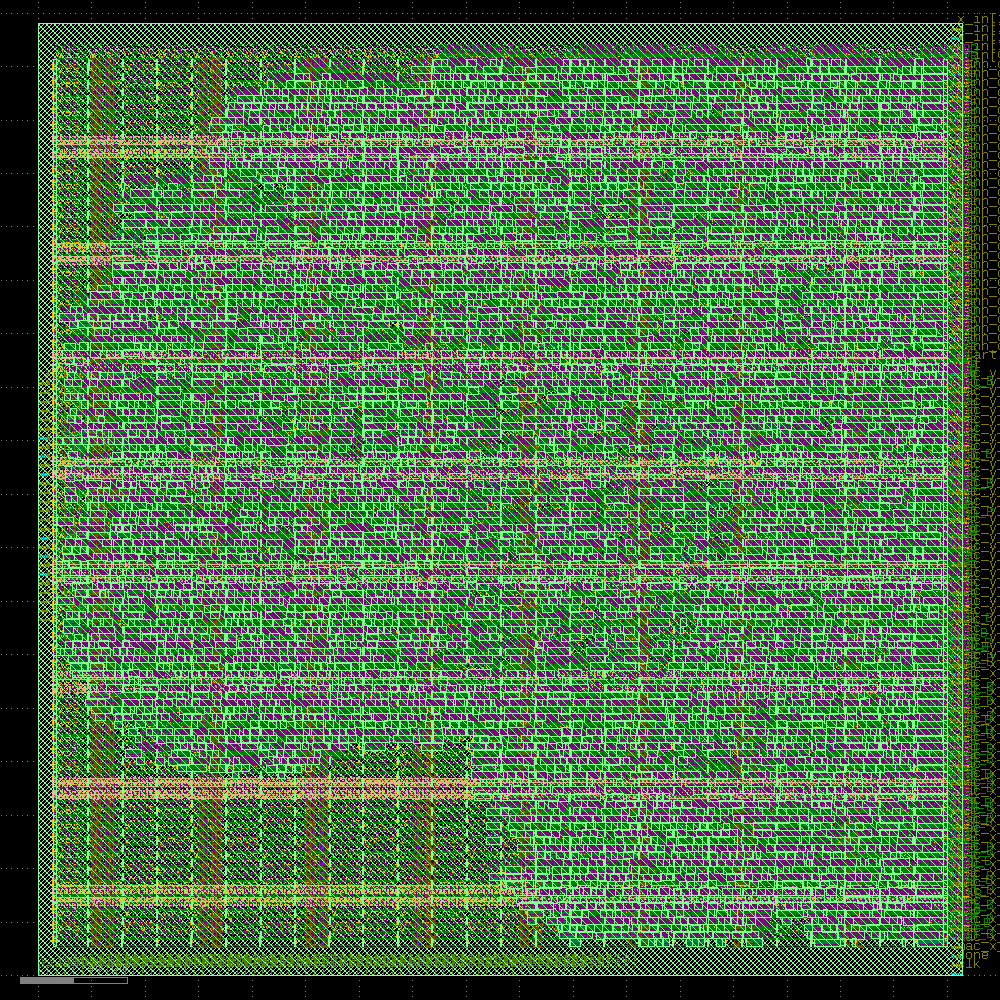

In [ ]:
display(cts)

### Global Routing

Global routing "plans" the routes the wires between two gates (or gates and
I/O pins/the PDN) will take. The results of global routing (which are called
"routing guides") are stored in internal data structures and have no effect on
the actual design, so there is no `display()` statement.

In [ ]:
GlobalRouting = Step.factory.get("OpenROAD.GlobalRouting")

grt = GlobalRouting(state_in=cts.state_out)
grt.start()

───────────────────────────────────────────────── Global Routing ──────────────────────────────────────────────────

[12:20:12] VERBOSE  Running 'OpenROAD.GlobalRouting'…                                                  ]8;id=978034;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=416545;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:20:12] VERBOSE  Logging subprocess to                                                              ]8;id=872920;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=250823;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=256329;file:///content/openlane_run/9-openroad-globalrouting/openroad-globalrouting.log\openlane_run/]8;;\]8;id=462575;file:///content/openlane_run/9-openroad-globalrouting/openroad-globalrouting.log\9]8;;\]8;id=256329;file:///content/openlane_run/9-openroad-globalrouting/openroad-globalrouting.log\-openroad-globalrouting/openroad-globalrouting.log]8;;\…                              

Reading OpenROAD database at '/content/openlane_run/8-openroad-cts/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

-congestion_iterations 50 -verbose

[INFO GRT-0020] Min routing layer: met1

[INFO GRT-0021] Max routing layer: met5

[INFO GRT-0022] Global adjustment: 30%

[INFO GRT-0023] Grid origin: (0, 0)

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0088] Layer li1     Track-Pitch = 0.4600  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met1    Track-Pitch = 0.3400  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met2    Track-Pitch = 0.4600  line-2-Via Pitch: 0.3500

[INFO GRT-0088] Layer met3    Track-Pitch = 0.6800  line-2-Via Pitch: 0.6150

[INFO GRT-0088] Layer met4    Track-Pitch = 0.9200  line-2-Via Pitch: 1.0400

[INFO GRT-0088] Layer met5    Track-Pitch = 3.4000  line-2-Via Pitch: 3.1100

[INFO GRT-0019] Found 51 clock nets.

[INFO GRT-0001] Minimum degree: 2

[INFO GRT-0002] Maximum degree: 145

[INFO GRT-0003] Macros: 0

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0004] Blockages: 10018

[INFO GRT-0053] Routing resources analysis:

Routing      Original      Derated      Resource

Layer     Direction    Resources     Resources    Reduction (%)

---------------------------------------------------------------

li1        Vertical            0             0          0.00%

met1       Horizontal      51630         24910          51.75%

met2       Vertical        38316         24810          35.25%

met3       Horizontal      25790         17080          33.77%

met4       Vertical        15408          7746          49.73%

met5       Horizontal       5148          2303          55.26%

---------------------------------------------------------------

[INFO GRT-0101] Running extra iterations to remove overflow.

[INFO GRT-0197] Via related to pin nodes: 33002

[INFO GRT-0198] Via related Steiner nodes: 561

[INFO GRT-0199] Via filling finished.

[INFO GRT-0111] Final number of vias: 40966

[INFO GRT-0112] Final usage 3D: 147930

[INFO GRT-0096] Final congestion report:

Layer         Resource        Demand        Usage (%)    Max H / Max V / Total Overflow

---------------------------------------------------------------------------------------

li1                  0             0            0.00%             0 /  0 /  0

met1             24910         10934           43.89%             0 /  0 /  0

met2             24810         10859           43.77%             0 /  0 /  0

met3             17080          1939           11.35%             0 /  0 /  0

met4              7746          1300           16.78%             0 /  0 /  0

met5              2303             0            0.00%             0 /  0 /  0

---------------------------------------------------------------------------------------

Total            76849         25032           32.57%             0 /  0 /  0

[INFO GRT-0018] Total wirelength: 269796 um

[INFO GRT-0014] Routed nets: 5473

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/9-openroad-globalrouting/cordic_neuron.odb'…

Writing layout to '/content/openlane_run/9-openroad-globalrouting/cordic_neuron.def'…

Format,Path
nl,openlane_run/8-openroad-cts/cordic_neuron.nl.v
pnl,openlane_run/8-openroad-cts/cordic_neuron.pnl.v
def,openlane_run/9-openroad-globalrouting/cordic_neuron.def
odb,openlane_run/9-openroad-globalrouting/cordic_neuron.odb
sdc,openlane_run/8-openroad-cts/cordic_neuron.sdc


### Detailed Routing

Detailed routing uses the guides from Global Routing to actually create wires
on the metal layers and connect the gates, making the connections finally physical.

This is typically the longest step in the flow.

In [ ]:
DetailedRouting = Step.factory.get("OpenROAD.DetailedRouting")

drt = DetailedRouting(state_in=grt.state_out)
drt.start()

──────────────────────────────────────────────── Detailed Routing ─────────────────────────────────────────────────

[12:20:15] VERBOSE  Running 'OpenROAD.DetailedRouting'…                                                ]8;id=795328;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=445948;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:20:15] INFO     Running TritonRoute with 2 threads…                                            ]8;id=562099;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=546023;file:///content/openlane_ipynb/openlane/steps/openroad.py#1619\1619]8;;\

[12:20:15] VERBOSE  Logging subprocess to                                                              ]8;id=900191;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=820261;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=297019;file:///content/openlane_run/10-openroad-detailedrouting/openroad-detailedrouting.log\openlane_run/]8;;\]8;id=891210;file:///content/openlane_run/10-openroad-detailedrouting/openroad-detailedrouting.log\10]8;;\]8;id=297019;file:///content/openlane_run/10-openroad-detailedrouting/openroad-detailedrouting.log\-openroad-detailedrouting/openroad-detailedrouting.log]8;;\…                         

Reading OpenROAD database at '/content/openlane_run/9-openroad-globalrouting/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO ORD-0030] Using 2 thread(s).

[INFO DRT-0149] Reading tech and libs.

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=235217;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=21396;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=91281;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=21093;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=381735;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=677070;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=979367;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=278859;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=666773;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=789223;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=85706;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=511036;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=862809;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=343848;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=573691;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=958001;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=138987;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=860258;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

[12:20:16] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=329666;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=708480;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

Units:                1000

Number of layers:     13

Number of macros:     441

Number of vias:       29

Number of viarulegen: 25

[INFO DRT-0150] Reading design.

Design:                   cordic_neuron

Die area:                 ( 0 0 ) ( 345540 356260 )

Number of track patterns: 12

Number of DEF vias:       0

Number of components:     7275

Number of terminals:      198

Number of snets:          2

Number of nets:           5601

[INFO DRT-0167] List of default vias:

Layer via

default via: M1M2_PR

Layer via2

default via: M2M3_PR

Layer via3

default via: M3M4_PR

Layer via4

default via: M4M5_PR

[INFO DRT-0162] Library cell analysis.

[INFO DRT-0163] Instance analysis.

[INFO DRT-0164] Number of unique instances = 289.

[INFO DRT-0168] Init region query.

[INFO DRT-0024]   Complete FR_MASTERSLICE.

[INFO DRT-0024]   Complete Fr_VIA.

[INFO DRT-0024]   Complete li1.

[INFO DRT-0024]   Complete mcon.

[INFO DRT-0024]   Complete met1.

[INFO DRT-0024]   Complete via.

[INFO DRT-0024]   Complete met2.

[INFO DRT-0024]   Complete via2.

[INFO DRT-0024]   Complete met3.

[INFO DRT-0024]   Complete via3.

[INFO DRT-0024]   Complete met4.

[INFO DRT-0024]   Complete via4.

[INFO DRT-0024]   Complete met5.

[INFO DRT-0033] FR_MASTERSLICE shape region query size = 0.

[INFO DRT-0033] FR_VIA shape region query size = 0.

[INFO DRT-0033] li1 shape region query size = 174225.

[INFO DRT-0033] mcon shape region query size = 0.

[INFO DRT-0033] met1 shape region query size = 24305.

[INFO DRT-0033] via shape region query size = 8856.

[INFO DRT-0033] met2 shape region query size = 3016.

[INFO DRT-0033] via2 shape region query size = 6888.

[INFO DRT-0033] met3 shape region query size = 3084.

[INFO DRT-0033] via3 shape region query size = 6888.

[INFO DRT-0033] met4 shape region query size = 1144.

[INFO DRT-0033] via4 shape region query size = 128.

[INFO DRT-0033] met5 shape region query size = 160.

[INFO DRT-0165] Start pin access.

[INFO DRT-0076]   Complete 1000 pins.

[INFO DRT-0078]   Complete 1221 pins.

[INFO DRT-0079]   Complete 100 unique inst patterns.

[INFO DRT-0079]   Complete 200 unique inst patterns.

[INFO DRT-0081]   Complete 283 unique inst patterns.

[INFO DRT-0084]   Complete 3326 groups.

#scanned instances     = 7275

#unique  instances     = 289

#stdCellGenAp          = 8524

#stdCellValidPlanarAp  = 100

#stdCellValidViaAp     = 6712

#stdCellPinNoAp        = 0

#stdCellPinCnt         = 20595

#instTermValidViaApCnt = 0

#macroGenAp            = 0

#macroValidPlanarAp    = 0

#macroValidViaAp       = 0

#macroNoAp             = 0

[INFO DRT-0166] Complete pin access.

[INFO DRT-0267] cpu time = 00:02:16, elapsed time = 00:01:22, memory = 154.13 (MB), peak = 247.60 (MB)

Number of guides:     43223

[INFO DRT-0169] Post process guides.

[INFO DRT-0176] GCELLGRID X 0 DO 50 STEP 6900 ;

[INFO DRT-0177] GCELLGRID Y 0 DO 51 STEP 6900 ;

[INFO DRT-0028]   Complete FR_MASTERSLICE.

[INFO DRT-0028]   Complete Fr_VIA.

[INFO DRT-0028]   Complete li1.

[INFO DRT-0028]   Complete mcon.

[INFO DRT-0028]   Complete met1.

[INFO DRT-0028]   Complete via.

[INFO DRT-0028]   Complete met2.

[INFO DRT-0028]   Complete via2.

[INFO DRT-0028]   Complete met3.

[INFO DRT-0028]   Complete via3.

[INFO DRT-0028]   Complete met4.

[INFO DRT-0028]   Complete via4.

[INFO DRT-0028]   Complete met5.

[INFO DRT-1000] Pin _06122_/S not in any guide. Attempting to patch guides to cover (at least part of) the pin.

[INFO DRT-0178] Init guide query.

[INFO DRT-0035]   Complete FR_MASTERSLICE (guide).

[INFO DRT-0035]   Complete Fr_VIA (guide).

[INFO DRT-0035]   Complete li1 (guide).

[INFO DRT-0035]   Complete mcon (guide).

[INFO DRT-0035]   Complete met1 (guide).

[INFO DRT-0035]   Complete via (guide).

[INFO DRT-0035]   Complete met2 (guide).

[INFO DRT-0035]   Complete via2 (guide).

[INFO DRT-0035]   Complete met3 (guide).

[INFO DRT-0035]   Complete via3 (guide).

[INFO DRT-0035]   Complete met4 (guide).

[INFO DRT-0035]   Complete via4 (guide).

[INFO DRT-0035]   Complete met5 (guide).

[INFO DRT-0036] FR_MASTERSLICE guide region query size = 0.

[INFO DRT-0036] FR_VIA guide region query size = 0.

[INFO DRT-0036] li1 guide region query size = 15250.

[INFO DRT-0036] mcon guide region query size = 0.

[INFO DRT-0036] met1 guide region query size = 12063.

[INFO DRT-0036] via guide region query size = 0.

[INFO DRT-0036] met2 guide region query size = 6328.

[INFO DRT-0036] via2 guide region query size = 0.

[INFO DRT-0036] met3 guide region query size = 447.

[INFO DRT-0036] via3 guide region query size = 0.

[INFO DRT-0036] met4 guide region query size = 118.

[INFO DRT-0036] via4 guide region query size = 0.

[INFO DRT-0036] met5 guide region query size = 0.

[INFO DRT-0179] Init gr pin query.

[INFO DRT-0245] skipped writing guide updates to database.

[INFO DRT-0185] Post process initialize RPin region query.

[INFO DRT-0181] Start track assignment.

[INFO DRT-0184] Done with 21696 vertical wires in 1 frboxes and 12510 horizontal wires in 2 frboxes.

[INFO DRT-0186] Done with 2770 vertical wires in 1 frboxes and 4043 horizontal wires in 2 frboxes.

[INFO DRT-0182] Complete track assignment.

[INFO DRT-0267] cpu time = 00:00:04, elapsed time = 00:00:03, memory = 218.80 (MB), peak = 247.60 (MB)

[INFO DRT-0187] Start routing data preparation.

[INFO DRT-0267] cpu time = 00:00:00, elapsed time = 00:00:00, memory = 218.80 (MB), peak = 247.60 (MB)

[INFO DRT-0194] Start detail routing.

[INFO DRT-0195] Start 0th optimization iteration.

Completing 10% with 0 violations.

elapsed time = 00:00:15, memory = 276.72 (MB).

Completing 20% with 0 violations.

elapsed time = 00:00:48, memory = 343.52 (MB).

Completing 30% with 710 violations.

elapsed time = 00:01:13, memory = 373.28 (MB).

Completing 40% with 710 violations.

elapsed time = 00:01:43, memory = 397.43 (MB).

Completing 50% with 710 violations.

elapsed time = 00:02:23, memory = 378.26 (MB).

Completing 60% with 1573 violations.

elapsed time = 00:03:03, memory = 427.16 (MB).

Completing 70% with 1573 violations.

elapsed time = 00:03:11, memory = 427.16 (MB).

Completing 80% with 2283 violations.

elapsed time = 00:03:53, memory = 450.16 (MB).

Completing 90% with 2283 violations.

elapsed time = 00:04:09, memory = 398.49 (MB).

Completing 100% with 2962 violations.

elapsed time = 00:04:24, memory = 378.31 (MB).

[INFO DRT-0199]   Number of violations = 4502.

Viol/Layer         li1   mcon   met1   met2   met3   met4

Cut Spacing          0      2      0      0      0      0

Metal Spacing       46      0    572    201     41      0

Min Hole             0      0     11      0      0      0

Recheck              0      0    960    516     57      7

Short                0      0   1722    367      0      0

[INFO DRT-0267] cpu time = 00:06:38, elapsed time = 00:04:25, memory = 681.55 (MB), peak = 681.55 (MB)

Total wire length = 184643 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 82366 um.

Total wire length on LAYER met2 = 78194 um.

Total wire length on LAYER met3 = 15112 um.

Total wire length on LAYER met4 = 8969 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 43584.

Up-via summary (total 43584):

------------------------

FR_MASTERSLICE        0

li1    20088

met1    22432

met2      812

met3      252

met4        0

------------------------

43584

[INFO DRT-0195] Start 1st optimization iteration.

Completing 10% with 4502 violations.

elapsed time = 00:00:08, memory = 681.55 (MB).

Completing 20% with 4502 violations.

elapsed time = 00:00:26, memory = 681.84 (MB).

Completing 30% with 3667 violations.

elapsed time = 00:00:43, memory = 681.84 (MB).

Completing 40% with 3667 violations.

elapsed time = 00:01:12, memory = 681.84 (MB).

Completing 50% with 3667 violations.

elapsed time = 00:01:35, memory = 681.84 (MB).

Completing 60% with 2795 violations.

elapsed time = 00:02:00, memory = 681.84 (MB).

Completing 70% with 2795 violations.

elapsed time = 00:02:09, memory = 681.84 (MB).

Completing 80% with 2092 violations.

elapsed time = 00:02:35, memory = 681.84 (MB).

Completing 90% with 2092 violations.

elapsed time = 00:02:48, memory = 681.84 (MB).

Completing 100% with 1265 violations.

elapsed time = 00:02:56, memory = 681.84 (MB).

[INFO DRT-0199]   Number of violations = 1330.

Viol/Layer        mcon   met1   met2

Cut Spacing          2      0      0

Metal Spacing        0    217     79

Recheck              0     55     10

Short                0    870     97

[INFO DRT-0267] cpu time = 00:04:43, elapsed time = 00:02:57, memory = 684.98 (MB), peak = 704.01 (MB)

Total wire length = 182417 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 81049 um.

Total wire length on LAYER met2 = 77370 um.

Total wire length on LAYER met3 = 15028 um.

Total wire length on LAYER met4 = 8969 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 43345.

Up-via summary (total 43345):

------------------------

FR_MASTERSLICE        0

li1    20075

met1    22223

met2      803

met3      244

met4        0

------------------------

43345

[INFO DRT-0195] Start 2nd optimization iteration.

Completing 10% with 1330 violations.

elapsed time = 00:00:03, memory = 684.98 (MB).

Completing 20% with 1330 violations.

elapsed time = 00:00:19, memory = 684.98 (MB).

Completing 30% with 1158 violations.

elapsed time = 00:00:35, memory = 684.98 (MB).

Completing 40% with 1158 violations.

elapsed time = 00:01:02, memory = 684.98 (MB).

Completing 50% with 1158 violations.

elapsed time = 00:01:18, memory = 684.98 (MB).

Completing 60% with 1072 violations.

elapsed time = 00:01:36, memory = 684.98 (MB).

Completing 70% with 1072 violations.

elapsed time = 00:01:52, memory = 684.98 (MB).

Completing 80% with 1110 violations.

elapsed time = 00:02:14, memory = 684.98 (MB).

Completing 90% with 1110 violations.

elapsed time = 00:02:40, memory = 684.98 (MB).

Completing 100% with 1112 violations.

elapsed time = 00:02:49, memory = 684.98 (MB).

[INFO DRT-0199]   Number of violations = 1122.

Viol/Layer        mcon   met1   met2   met3

Cut Spacing          1      0      0      0

Metal Spacing        0    192     70      3

Recheck              0      5      5      0

Short                0    742    104      0

[INFO DRT-0267] cpu time = 00:04:40, elapsed time = 00:02:50, memory = 686.01 (MB), peak = 704.01 (MB)

Total wire length = 182104 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 81050 um.

Total wire length on LAYER met2 = 77263 um.

Total wire length on LAYER met3 = 14910 um.

Total wire length on LAYER met4 = 8880 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 43273.

Up-via summary (total 43273):

------------------------

FR_MASTERSLICE        0

li1    20075

met1    22163

met2      792

met3      243

met4        0

------------------------

43273

[INFO DRT-0195] Start 3rd optimization iteration.

Completing 10% with 1122 violations.

elapsed time = 00:00:06, memory = 686.01 (MB).

Completing 20% with 1122 violations.

elapsed time = 00:00:20, memory = 686.01 (MB).

Completing 30% with 834 violations.

elapsed time = 00:00:30, memory = 722.36 (MB).

Completing 40% with 834 violations.

elapsed time = 00:00:48, memory = 722.36 (MB).

Completing 50% with 834 violations.

elapsed time = 00:00:57, memory = 722.36 (MB).

Completing 60% with 581 violations.

elapsed time = 00:01:04, memory = 722.36 (MB).

Completing 70% with 581 violations.

elapsed time = 00:01:07, memory = 722.36 (MB).

Completing 80% with 351 violations.

elapsed time = 00:01:34, memory = 722.36 (MB).

Completing 90% with 351 violations.

elapsed time = 00:01:41, memory = 722.36 (MB).

Completing 100% with 71 violations.

elapsed time = 00:01:42, memory = 722.36 (MB).

[INFO DRT-0199]   Number of violations = 75.

Viol/Layer        met1   met2

Metal Spacing       16     15

Recheck              4      0

Short               32      8

[INFO DRT-0267] cpu time = 00:02:50, elapsed time = 00:01:43, memory = 722.36 (MB), peak = 722.36 (MB)

Total wire length = 181720 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 77124 um.

Total wire length on LAYER met2 = 76821 um.

Total wire length on LAYER met3 = 18342 um.

Total wire length on LAYER met4 = 9431 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 43939.

Up-via summary (total 43939):

------------------------

FR_MASTERSLICE        0

li1    20075

met1    22180

met2     1385

met3      299

met4        0

------------------------

43939

[INFO DRT-0195] Start 4th optimization iteration.

Completing 10% with 75 violations.

elapsed time = 00:00:00, memory = 722.36 (MB).

Completing 20% with 75 violations.

elapsed time = 00:00:01, memory = 722.36 (MB).

Completing 30% with 68 violations.

elapsed time = 00:00:01, memory = 722.36 (MB).

Completing 40% with 68 violations.

elapsed time = 00:00:02, memory = 722.36 (MB).

Completing 50% with 68 violations.

elapsed time = 00:00:04, memory = 722.36 (MB).

Completing 60% with 22 violations.

elapsed time = 00:00:04, memory = 722.36 (MB).

Completing 70% with 22 violations.

elapsed time = 00:00:05, memory = 722.36 (MB).

Completing 80% with 9 violations.

elapsed time = 00:00:05, memory = 722.36 (MB).

Completing 90% with 9 violations.

elapsed time = 00:00:06, memory = 722.36 (MB).

Completing 100% with 0 violations.

elapsed time = 00:00:06, memory = 722.36 (MB).

[INFO DRT-0199]   Number of violations = 0.

[INFO DRT-0267] cpu time = 00:00:12, elapsed time = 00:00:06, memory = 722.36 (MB), peak = 722.36 (MB)

Total wire length = 181693 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 77062 um.

Total wire length on LAYER met2 = 76789 um.

Total wire length on LAYER met3 = 18403 um.

Total wire length on LAYER met4 = 9438 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 43931.

Up-via summary (total 43931):

------------------------

FR_MASTERSLICE        0

li1    20075

met1    22163

met2     1390

met3      303

met4        0

------------------------

43931

[INFO DRT-0198] Complete detail routing.

Total wire length = 181693 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 77062 um.

Total wire length on LAYER met2 = 76789 um.

Total wire length on LAYER met3 = 18403 um.

Total wire length on LAYER met4 = 9438 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 43931.

Up-via summary (total 43931):

------------------------

FR_MASTERSLICE        0

li1    20075

met1    22163

met2     1390

met3      303

met4        0

------------------------

43931

[INFO DRT-0267] cpu time = 00:19:05, elapsed time = 00:12:04, memory = 722.36 (MB), peak = 722.36 (MB)

[INFO DRT-0180] Post processing.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/10-openroad-detailedrouting/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/10-openroad-detailedrouting/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/10-openroad-detailedrouting/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/10-openroad-detailedrouting/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/10-openroad-detailedrouting/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/10-openroad-detailedrouting/cordic_neuron.nl.v
pnl,openlane_run/10-openroad-detailedrouting/cordic_neuron.pnl.v
def,openlane_run/10-openroad-detailedrouting/cordic_neuron.def
odb,openlane_run/10-openroad-detailedrouting/cordic_neuron.odb
sdc,openlane_run/10-openroad-detailedrouting/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:33:49] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=505818;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=195810;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:33:49] VERBOSE  Logging subprocess to ]8;id=872660;file:///tmp/openlane_klayout_tmp_miccrna8/klayout-render.log\..]8;;\]8;id=652636;file:///tmp/openlane_klayout_tmp_miccrna8/klayout-render.log\/tmp/openlane_klayout_tmp_miccrna8/]8;;\]8;id=132744;file:///tmp/openlane_klayout_tmp_miccrna8/klayout-render.log\klayout-render.log]8;;\…     ]8;id=214828;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=34062;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 813.33s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
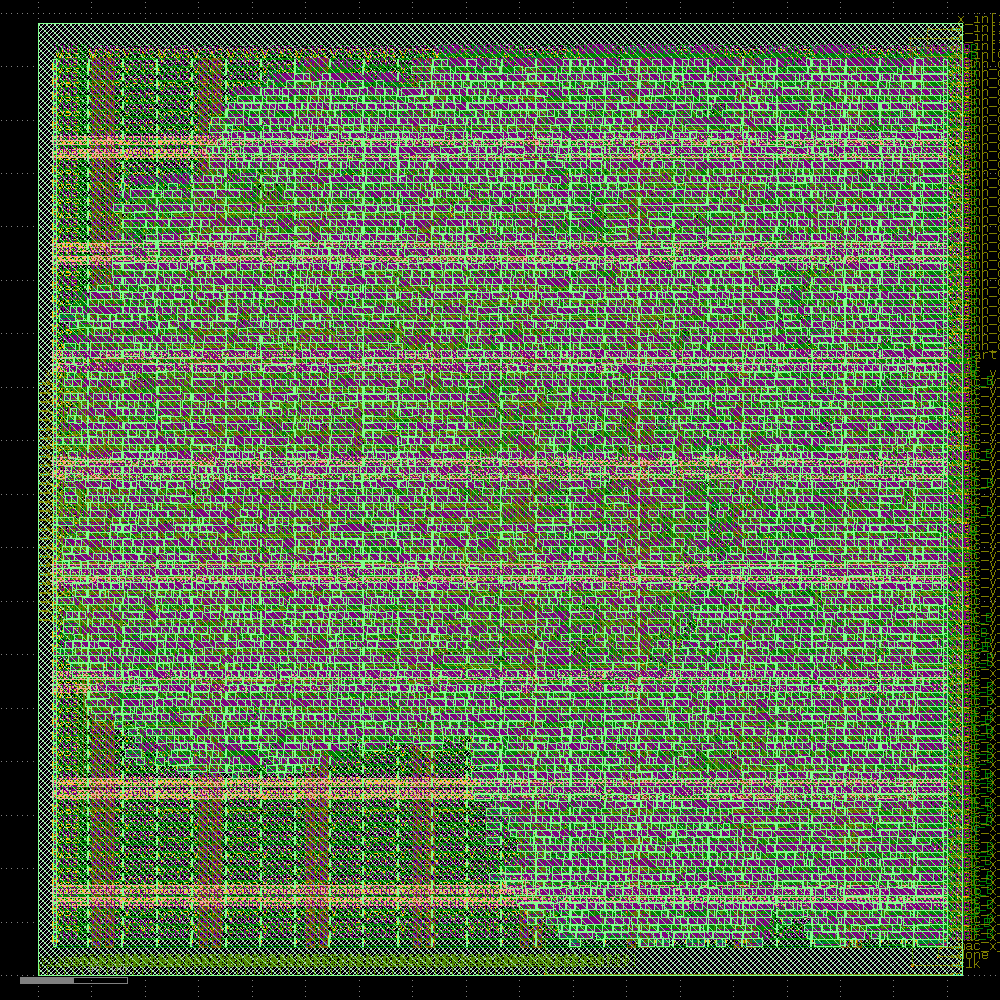

In [ ]:
display(drt)

### Fill Insertion

Finally, as we're done placing all the essential cells, the only thing left to
do is fill in the gaps.

We prioritize the use of decap (decoupling capacitor) cells, which
further supports the power distribution network, but when there aren't any
small enough cells, we just use regular fill cells.

In [ ]:
FillInsertion = Step.factory.get("OpenROAD.FillInsertion")

fill = FillInsertion(state_in=drt.state_out)
fill.start()

───────────────────────────────────────────────── Fill Insertion ──────────────────────────────────────────────────

[12:33:51] VERBOSE  Running 'OpenROAD.FillInsertion'…                                                  ]8;id=750832;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=209061;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:33:51] VERBOSE  Logging subprocess to                                                              ]8;id=583341;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=196896;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=891938;file:///content/openlane_run/11-openroad-fillinsertion/openroad-fillinsertion.log\openlane_run/]8;;\]8;id=487688;file:///content/openlane_run/11-openroad-fillinsertion/openroad-fillinsertion.log\11]8;;\]8;id=891938;file:///content/openlane_run/11-openroad-fillinsertion/openroad-fillinsertion.log\-openroad-fillinsertion/openroad-fillinsertion.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/10-openroad-detailedrouting/cordic_neuron.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 10

[INFO] Setting input delay to: 10

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

sky130_ef_sc_hd__decap_12 sky130_fd_sc_hd__decap_8 sky130_fd_sc_hd__decap_6 sky130_fd_sc_hd__decap_4               
sky130_fd_sc_hd__decap_3 sky130_fd_sc_hd__fill*

[INFO DPL-0001] Placed 6990 filler instances.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'…

Writing netlist to '/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'…

Writing powered netlist to '/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'…

Writing layout to '/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'…

Writing timing constraints to '/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'…

Format,Path
nl,openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v
pnl,openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v
def,openlane_run/11-openroad-fillinsertion/cordic_neuron.def
odb,openlane_run/11-openroad-fillinsertion/cordic_neuron.odb
sdc,openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:33:53] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=154274;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=544266;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:33:53] VERBOSE  Logging subprocess to ]8;id=68559;file:///tmp/openlane_klayout_tmp_rlx3v6zv/klayout-render.log\..]8;;\]8;id=968126;file:///tmp/openlane_klayout_tmp_rlx3v6zv/klayout-render.log\/tmp/openlane_klayout_tmp_rlx3v6zv/]8;;\]8;id=945401;file:///tmp/openlane_klayout_tmp_rlx3v6zv/klayout-render.log\klayout-render.log]8;;\…     ]8;id=511745;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=630991;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.83s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
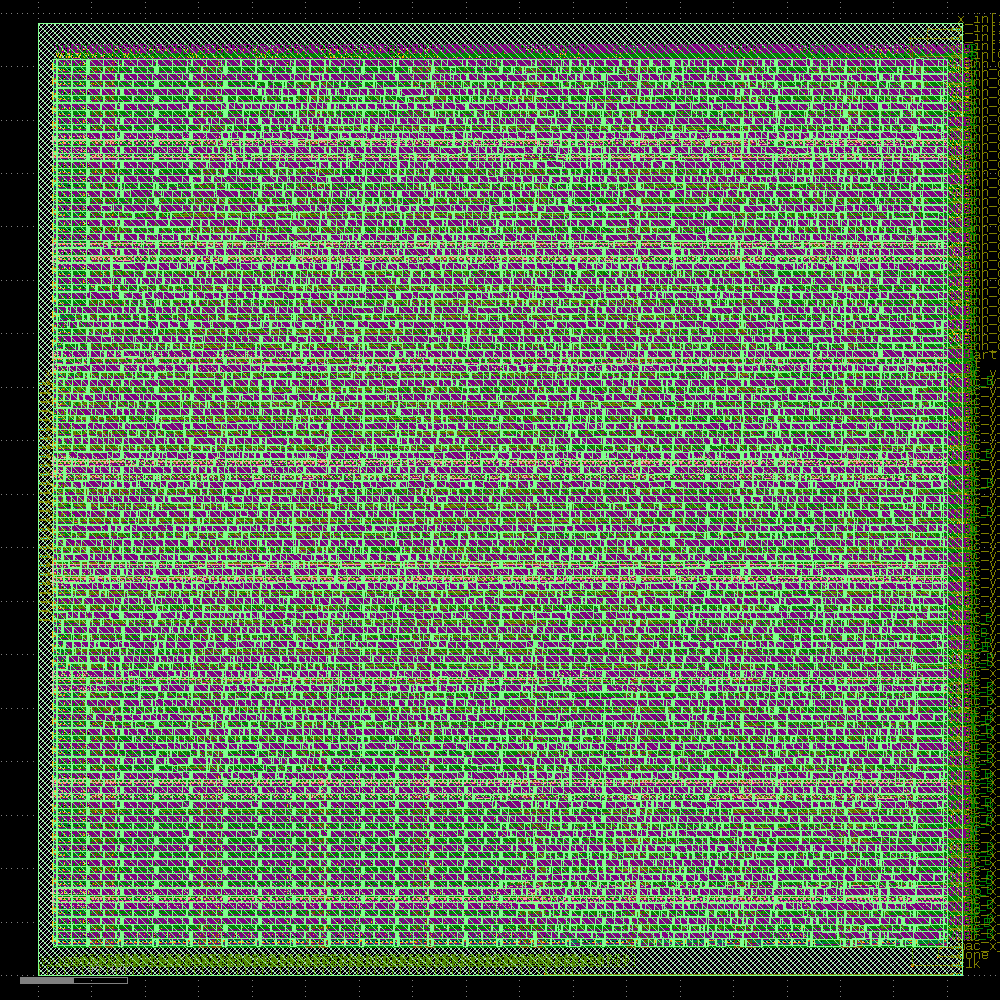

In [ ]:
display(fill)

### Parasitics Extraction a.k.a. Resistance/Capacitance Extraction (RCX)

This step does not alter the design- rather, it computes the
[Parasitic elements](https://en.wikipedia.org/wiki/Parasitic_element_(electrical_networks))
of the circuit, which have an effect of timing, as we prepare to do the final
timing analysis.

The parasitic elements are saved in the **Standard Parasitics Exchange Format**,
or SPEF. OpenLane creates a SPEF file for each interconnect corner as described in
the [Corners and STA](https://openlane2.readthedocs.io/en/latest/usage/corners_and_sta.html)
section of the documentation.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
RCX = Step.factory.get("OpenROAD.RCX")

rcx = RCX(state_in=fill.state_out)
rcx.start()

─────────────────────────────────── Parasitic Resistance/Capacitance Extraction ───────────────────────────────────

[12:36:01] VERBOSE  Running 'OpenROAD.RCX'…                                                            ]8;id=520967;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=682680;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:36:01] INFO     Running RCX for corners matching nom_*                                         ]8;id=449988;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=190675;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/12-openroad-rcx/nom/rcx.log)…                                           

[12:36:01] INFO     Running RCX for corners matching min_*                                         ]8;id=115198;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=541839;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/12-openroad-rcx/min/rcx.log)…                                           

[12:36:01] VERBOSE  Logging subprocess to ]8;id=758225;file:///content/openlane_run/12-openroad-rcx/nom/rcx.log\openlane_run/]8;;\]8;id=63319;file:///content/openlane_run/12-openroad-rcx/nom/rcx.log\12]8;;\]8;id=758225;file:///content/openlane_run/12-openroad-rcx/nom/rcx.log\-openroad-rcx/nom/rcx.log]8;;\…                    ]8;id=411316;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=689113;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[12:36:01] VERBOSE  Logging subprocess to ]8;id=930094;file:///content/openlane_run/12-openroad-rcx/min/rcx.log\openlane_run/]8;;\]8;id=328979;file:///content/openlane_run/12-openroad-rcx/min/rcx.log\12]8;;\]8;id=930094;file:///content/openlane_run/12-openroad-rcx/min/rcx.log\-openroad-rcx/min/rcx.log]8;;\…                    ]8;id=392995;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=889771;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[12:36:07] INFO     Finished RCX for corners matching min_*.                                       ]8;id=152751;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=475937;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[12:36:07] INFO     Running RCX for corners matching max_*                                         ]8;id=636062;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=143154;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/12-openroad-rcx/max/rcx.log)…                                           

[12:36:07] VERBOSE  Logging subprocess to ]8;id=447758;file:///content/openlane_run/12-openroad-rcx/max/rcx.log\openlane_run/]8;;\]8;id=452299;file:///content/openlane_run/12-openroad-rcx/max/rcx.log\12]8;;\]8;id=447758;file:///content/openlane_run/12-openroad-rcx/max/rcx.log\-openroad-rcx/max/rcx.log]8;;\…                    ]8;id=21321;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=940547;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[12:36:07] INFO     Finished RCX for corners matching nom_*.                                       ]8;id=564157;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=39990;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[12:36:10] INFO     Finished RCX for corners matching max_*.                                       ]8;id=787398;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=541423;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

{'nl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'), 'pnl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'), 'sdc': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'), 'sdf': None, 'spef': {'nom_*': Path('/content/openlane_run/12-openroad-rcx/nom/cordic_neuron.nom.spef'), 'min_*': Path('/content/openlane_run/12-openroad-rcx/min/cordic_neuron.min.spef'), 'max_*': Path('/content/openlane_run/12-openroad-rcx/max/cordic_neuron.max.spef')}, 'lib': None, 'spice': None, 'mag': None, 'gds': None, 'mag_gds': None, 'klayout_gds': None, 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 7031, 'design__instance__area': 59143, 'design__instance_unmapped__count': 64, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 345.54 356.26', 'design__core__bbox': '5.52 10.88 339.94 342.72', 'flow__warnings__count': 0, 'flow__errors__count': 0, 'design__io': 198, 'design__die__area': 123102, 'design__core__area': 110974, 'design__instance__count__stdcell': 7031, 'design__instance__area__stdcell': 59143, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.532945'), 'design__instance__utilization__stdcell': Decimal('0.532945'), 'floorplan__design__io': 196, 'design__io__hpwl': 32796820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('988.914'), 'design__instance__displacement__mean': Decimal('0.135'), 'design__instance__displacement__max': Decimal('11.04'), 'route__wirelength__estimated': 145377, 'design__violations': 0, 'antenna__violating__nets': 40, 'antenna__violating__pins': 43, 'route__net': 5601, 'route__net__special': 2, 'route__drc_errors__iter:1': 4502, 'route__wirelength__iter:1': 184643, 'route__drc_errors__iter:2': 1330, 'route__wirelength__iter:2': 182417, 'route__drc_errors__iter:3': 1122, 'route__wirelength__iter:3': 182104, 'route__drc_errors__iter:4': 75, 'route__wirelength__iter:4': 181720, 'route__drc_errors__iter:5': 0, 'route__wirelength__iter:5': 181693, 'route__drc_errors': 0, 'route__wirelength': 181693, 'route__vias': 43931, 'route__vias__singlecut': 43931, 'route__vias__multicut': 0}}

### Static Timing Analysis (Post-PnR)

STA is a process that verifies that a chip meets certain constraints on clock
and data timings to run at its rated clock speed. See [Corners and STA](https://openlane2.readthedocs.io/en/latest/usage/corners_and_sta.html)
in the documentation for more info.

---

This step generates two kinds of files:
* `.lib`: Liberty™-compatible Library files. Can be used to do static timing
  analysis when creating a design with this design as a sub-macro.
* `.sdf`: Standard Delay Format. Can be used with certain simulation software
  to do *dynamic* timing analysis.


In [ ]:
STAPostPNR = Step.factory.get("OpenROAD.STAPostPNR")

sta_post_pnr = STAPostPNR(state_in=rcx.state_out,STA_WRITE_LIB=True)
sta_post_pnr.start()

──────────────────────────────────────── Static Timing Analysis (Post-PnR) ────────────────────────────────────────

[12:36:10] VERBOSE  Running 'OpenROAD.STAPostPNR'…                                                     ]8;id=985076;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=399931;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:36:10] INFO     Starting STA for the nom_tt_025C_1v80 timing corner…                            ]8;id=988044;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=947223;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:10] INFO     Starting STA for the nom_ss_100C_1v60 timing corner…                            ]8;id=53830;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=688642;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:10] VERBOSE  Logging subprocess to                                                              ]8;id=931248;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=594101;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=669729;file:///content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=967723;file:///content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\13]8;;\]8;id=669729;file:///content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\-openroad-stapostpnr/nom_ss_100C_1v60/sta.log]8;;\…                                  

[12:36:10] VERBOSE  Logging subprocess to                                                              ]8;id=203556;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=513013;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=548229;file:///content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=981846;file:///content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\13]8;;\]8;id=548229;file:///content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\-openroad-stapostpnr/nom_tt_025C_1v80/sta.log]8;;\…                                  

[12:36:23] INFO     Finished STA for the nom_ss_100C_1v60 timing corner.                            ]8;id=810232;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=362223;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:36:24] VERBOSE  Logging subprocess to                                                              ]8;id=3126;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=693087;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=976126;file:///content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=351212;file:///content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\13]8;;\]8;id=976126;file:///content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[12:36:24] INFO     Finished STA for the nom_tt_025C_1v80 timing corner.                            ]8;id=687091;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=318722;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:36:24] VERBOSE  Logging subprocess to                                                              ]8;id=760786;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=267886;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=978796;file:///content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=625624;file:///content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\13]8;;\]8;id=978796;file:///content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[12:36:25] INFO     Starting STA for the nom_ff_n40C_1v95 timing corner…                            ]8;id=972400;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=449084;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:25] VERBOSE  Logging subprocess to                                                              ]8;id=639380;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=476600;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=274106;file:///content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=655548;file:///content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\13]8;;\]8;id=274106;file:///content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log]8;;\…                                  

[12:36:25] INFO     Starting STA for the min_tt_025C_1v80 timing corner…                            ]8;id=475521;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=177822;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:25] VERBOSE  Logging subprocess to                                                              ]8;id=503888;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=930682;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=561287;file:///content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=651745;file:///content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/sta.log\13]8;;\]8;id=561287;file:///content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/sta.log\-openroad-stapostpnr/min_tt_025C_1v80/sta.log]8;;\…                                  

[12:36:38] INFO     Finished STA for the min_tt_025C_1v80 timing corner.                            ]8;id=247960;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=560356;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:36:38] VERBOSE  Logging subprocess to                                                              ]8;id=977620;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=606023;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=114024;file:///content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=905728;file:///content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\13]8;;\]8;id=114024;file:///content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[12:36:39] INFO     Starting STA for the min_ss_100C_1v60 timing corner…                            ]8;id=845279;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=258945;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:39] VERBOSE  Logging subprocess to                                                              ]8;id=360324;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=985303;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=336850;file:///content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=769700;file:///content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/sta.log\13]8;;\]8;id=336850;file:///content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/sta.log\-openroad-stapostpnr/min_ss_100C_1v60/sta.log]8;;\…                                  

[12:36:39] INFO     Finished STA for the nom_ff_n40C_1v95 timing corner.                            ]8;id=184539;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=463806;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:36:39] VERBOSE  Logging subprocess to                                                              ]8;id=789983;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=570423;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=617455;file:///content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=271120;file:///content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\13]8;;\]8;id=617455;file:///content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[12:36:40] INFO     Starting STA for the min_ff_n40C_1v95 timing corner…                            ]8;id=235012;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=202747;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:40] VERBOSE  Logging subprocess to                                                              ]8;id=501198;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=972551;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=696137;file:///content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=459608;file:///content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\13]8;;\]8;id=696137;file:///content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\-openroad-stapostpnr/min_ff_n40C_1v95/sta.log]8;;\…                                  

[12:36:51] INFO     Finished STA for the min_ss_100C_1v60 timing corner.                            ]8;id=132836;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=828910;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:36:51] VERBOSE  Logging subprocess to                                                              ]8;id=972096;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=230486;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=155433;file:///content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=910922;file:///content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\13]8;;\]8;id=155433;file:///content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[12:36:52] INFO     Starting STA for the max_tt_025C_1v80 timing corner…                            ]8;id=783128;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=323515;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:52] VERBOSE  Logging subprocess to                                                              ]8;id=635745;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=988544;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=597454;file:///content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=860602;file:///content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/sta.log\13]8;;\]8;id=597454;file:///content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/sta.log\-openroad-stapostpnr/max_tt_025C_1v80/sta.log]8;;\…                                  

[12:36:54] INFO     Finished STA for the min_ff_n40C_1v95 timing corner.                            ]8;id=385526;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=937483;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:36:54] VERBOSE  Logging subprocess to                                                              ]8;id=458369;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=947272;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=731526;file:///content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=631729;file:///content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\13]8;;\]8;id=731526;file:///content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[12:36:55] INFO     Starting STA for the max_ss_100C_1v60 timing corner…                            ]8;id=759779;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=680966;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:36:55] VERBOSE  Logging subprocess to                                                              ]8;id=777091;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=48830;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=447333;file:///content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=63836;file:///content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/sta.log\13]8;;\]8;id=447333;file:///content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/sta.log\-openroad-stapostpnr/max_ss_100C_1v60/sta.log]8;;\…                                  

[12:37:05] INFO     Finished STA for the max_tt_025C_1v80 timing corner.                            ]8;id=626407;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=61579;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:37:05] VERBOSE  Logging subprocess to                                                              ]8;id=813379;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=80401;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=186171;file:///content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=888368;file:///content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\13]8;;\]8;id=186171;file:///content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[12:37:07] INFO     Starting STA for the max_ff_n40C_1v95 timing corner…                            ]8;id=508743;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=98385;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[12:37:07] VERBOSE  Logging subprocess to                                                              ]8;id=542602;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=617240;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=258933;file:///content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=200082;file:///content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\13]8;;\]8;id=258933;file:///content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\-openroad-stapostpnr/max_ff_n40C_1v95/sta.log]8;;\…                                  

[12:37:09] INFO     Finished STA for the max_ss_100C_1v60 timing corner.                            ]8;id=416173;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=425318;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:37:09] VERBOSE  Logging subprocess to                                                              ]8;id=213765;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=348786;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=625075;file:///content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=714109;file:///content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\13]8;;\]8;id=625075;file:///content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[12:37:17] INFO     Finished STA for the max_ff_n40C_1v95 timing corner.                            ]8;id=389784;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=148895;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[12:37:17] VERBOSE  Logging subprocess to                                                              ]8;id=640949;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=380077;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=520262;file:///content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=237239;file:///content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\13]8;;\]8;id=520262;file:///content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┓
┃                      ┃       ┃       ┃      ┃       ┃ of   ┃       ┃      ┃       ┃      ┃ of    ┃      ┃       ┃
┃                      ┃       ┃ Reg   ┃      ┃       ┃ whi… ┃       ┃ Reg  ┃       ┃      ┃ which ┃      ┃       ┃
┃                      ┃ Hold  ┃ to    ┃      ┃ Hold  ┃ reg  ┃ Setup ┃ to   ┃       ┃ Set… ┃ reg   ┃ Max  ┃ Max   ┃
┃                      ┃ Worst ┃ Reg   ┃ Hold ┃ Vio   ┃ to   ┃ Worst ┃ Reg  ┃ Setup ┃ Vio  ┃ to    ┃ Cap  ┃ Slew  ┃
┃ Corner/Group         ┃ Slack ┃ Paths ┃ TNS  ┃ Count ┃ reg  ┃ Slack ┃ Pat… ┃ TNS   ┃ Cou… ┃ reg   ┃ Vio… ┃ Viol… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━┩
│ Overall              │ 0.04… │ 0.04… │ 0.0… │ 0     │ 0    │ 25.7… │ 25.… │ 0.00… │ 0    │ 0     │ 41   │ 4062  │
│ nom_tt_025C_1v80     │ 0.21… │ 0.21… │ 0.0… │ 0     │ 0    │ 37.4… │ 37.… │ 0.00… │ 0    │ 0     │ 33   │ 2766  │
│ nom_ss_100C_1v60     │ 0.73… │ 0.73… │ 0.0… │ 0     │ 0    │ 26.3… │ 26.… │ 0.00… │ 0    │ 0     │ 36   │ 3976  │
│ nom_ff_n40C_1v95     │ 0.04… │ 0.04… │ 0.0… │ 0     │ 0    │ 38.7… │ 42.… │ 0.00… │ 0    │ 0     │ 32   │ 2029  │
│ min_tt_025C_1v80     │ 0.21… │ 0.21… │ 0.0… │ 0     │ 0    │ 37.7… │ 37.… │ 0.00… │ 0    │ 0     │ 30   │ 2556  │
│ min_ss_100C_1v60     │ 0.73… │ 0.73… │ 0.0… │ 0     │ 0    │ 26.9… │ 26.… │ 0.00… │ 0    │ 0     │ 34   │ 3866  │
│ min_ff_n40C_1v95     │ 0.04… │ 0.04… │ 0.0… │ 0     │ 0    │ 38.8… │ 42.… │ 0.00… │ 0    │ 0     │ 30   │ 1996  │
│ max_tt_025C_1v80     │ 0.22… │ 0.22… │ 0.0… │ 0     │ 0    │ 37.0… │ 37.… │ 0.00… │ 0    │ 0     │ 34   │ 2907  │
│ max_ss_100C_1v60     │ 0.73… │ 0.73… │ 0.0… │ 0     │ 0    │ 25.7… │ 25.… │ 0.00… │ 0    │ 0     │ 41   │ 4062  │
│ max_ff_n40C_1v95     │ 0.04… │ 0.04… │ 0.0… │ 0     │ 0    │ 38.7… │ 41.… │ 0.00… │ 0    │ 0     │ 32   │ 2043  │
└──────────────────────┴───────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┘

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┓
┃                      ┃ Hold     ┃ Reg to   ┃          ┃          ┃ of which  ┃ Setup    ┃           ┃          ┃           ┃ of which ┃           ┃          ┃
┃                      ┃ Worst    ┃ Reg      ┃          ┃ Hold Vio ┃ reg to    ┃ Worst    ┃ Reg to    ┃ Setup    ┃ Setup Vio ┃ reg to   ┃ Max Cap   ┃ Max Slew ┃
┃ Corner/Group         ┃ Slack    ┃ Paths    ┃ Hold TNS ┃ Count    ┃ reg       ┃ Slack    ┃ Reg Paths ┃ TNS      ┃ Count     ┃ reg      ┃ Violatio… ┃ Violati… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━┩
│ Overall              │ 0.0421   │ 0.0421   │ 0.0000   │ 0        │ 0         │ 25.7699  │ 25.7699   │ 0.0000   │ 0         │ 0        │ 41        │ 4062     │
│ nom_tt_025C_1v80     │ 0.2188   │ 0.2188   │ 0.0000   │ 0        │ 0         │ 37.4746  │ 37.4746   │ 0.0000   │ 0         │ 0        │ 33        │ 2766     │
│ nom_ss_100C_1v60     │ 0.7346   │ 0.7346   │ 0.0000   │ 0        │ 0         │ 26.3641  │ 26.3641   │ 0.0000   │ 0         │ 0        │ 36        │ 3976     │
│ nom_ff_n40C_1v95     │ 0.0432   │ 0.0432   │ 0.0000   │ 0        │ 0         │ 38.7860  │ 42.0415   │ 0.0000   │ 0         │ 0        │ 32        │ 2029     │
│ min_tt_025C_1v80     │ 0.2171   │ 0.2171   │ 0.0000   │ 0        │ 0         │ 37.7901  │ 37.7901   │ 0.0000   │ 0         │ 0        │ 30        │ 2556     │
│ min_ss_100C_1v60     │ 0.7314   │ 0.7314   │ 0.0000   │ 0        │ 0         │ 26.9031  │ 26.9031   │ 0.0000   │ 0         │ 0        │ 34        │ 3866     │
│ min_ff_n40C_1v95     │ 0.0421   │ 0.0421   │ 0.0000   │ 0        │ 0         │ 38.8177  │ 42.2457   │ 0.0000   │ 0         │ 0        │ 30        │ 1996     │
│ max_tt_025C_1v80     │ 0.2206   │ 0.2206   │ 0.0000   │ 0        │ 0         │ 37.0787  │ 37.0787   │ 0.0000   │ 0         │ 0        │ 34        │ 2907     │
│ max_ss_100C_1v60     │ 0.7380   │ 0.7380   │ 0.0000   │ 0        │ 0         │ 25.7699  │ 25.7699   │ 0.0000   │ 0         │ 0        │ 41        │ 4062     │
│ max_ff_n40C_1v95     │ 0.0447   │ 0.0447   │ 0.0000   │ 0        │ 0         │ 38.7493  │ 41.8047   │ 0.0000   │ 0         │ 0        │ 32        │ 2043     │
└──────────────────────┴──────────┴──────────┴──────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┘

{'nl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'), 'pnl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'), 'sdc': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/12-openroad-rcx/nom/cordic_neuron.nom.spef'), 'min_*': Path('/content/openlane_run/12-openroad-rcx/min/cordic_neuron.min.spef'), 'max_*': Path('/content/openlane_run/12-openroad-rcx/max/cordic_neuron.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': None, 'mag_gds': None, 'klayout_gds': None, 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 7031, 'design__instance__area': 59143, 'design__instance_unmapped__count': 64, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 345.54 356.26', 'design__core__bbox': '5.52 10.88 339.94 342.72', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 198, 'design__die__area': 123102, 'design__core__area': 110974, 'design__instance__count__stdcell': 7031, 'design__instance__area__stdcell': 59143, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.532945'), 'design__instance__utilization__stdcell': Decimal('0.532945'), 'floorplan__design__io': 196, 'design__io__hpwl': 32796820, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_gr

### Stream-out

Stream-out is the process of converting the designs from the abstract formats
using during floorplanning, placement and routing into a concrete format called
GDSII (lit. Graphic Design System 2), which is the final file that is then sent
for fabrication.

In [ ]:
StreamOut = Step.factory.get("KLayout.StreamOut")

gds = StreamOut(state_in=sta_post_pnr.state_out)
gds.start()

─────────────────────────────────────────── GDSII Stream Out (KLayout) ────────────────────────────────────────────

[12:37:18] VERBOSE  Running 'KLayout.StreamOut'…                                                       ]8;id=990145;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=327461;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:37:18] VERBOSE  Logging subprocess to ]8;id=691651;file:///content/openlane_run/14-klayout-streamout/klayout-streamout.log\openlane_run/]8;;\]8;id=396724;file:///content/openlane_run/14-klayout-streamout/klayout-streamout.log\14]8;;\]8;id=691651;file:///content/openlane_run/14-klayout-streamout/klayout-streamout.log\-klayout-streamout/klayout-streamout.log]8;;\…     ]8;id=820589;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=70376;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Error processing line 1 of /usr/local/lib/python3.11/dist-packages/_numba_cuda_redirector.pth:

Traceback (most recent call last):

File "<frozen site>", line 201, in addpackage

File "<string>", line 1, in <module>

File "/usr/local/lib/python3.11/dist-packages/_numba_cuda_redirector.py", line 2, in <module>

import importlib.abc

File "/usr/lib/python3.11/importlib/abc.py", line 19, in <module>

from .resources.abc import ResourceReader, Traversable, TraversableResources

File "/usr/lib/python3.11/importlib/resources/__init__.py", line 3, in <module>

from ._common import (

File "/usr/lib/python3.11/importlib/resources/_common.py", line 2, in <module>

import pathlib

File "/usr/local/lib/python3.11/dist-packages/pathlib.py", line 10, in <module>

from collections import Sequence

ImportError: cannot import name 'Sequence' from 'collections' (/usr/lib/python3.11/collections/__init__.py)

Remainder of file ignored

Error processing line 1 of /usr/local/lib/python3.11/dist-packages/_rapids_dask_dependency.pth:

Traceback (most recent call last):

File "<frozen site>", line 201, in addpackage

File "<string>", line 1, in <module>

File "/usr/local/lib/python3.11/dist-packages/rapids_dask_dependency/__init__.py", line 3, in <module>

from .dask_loader import DaskFinder

File "/usr/local/lib/python3.11/dist-packages/rapids_dask_dependency/dask_loader.py", line 4, in <module>

import importlib.abc

File "/usr/lib/python3.11/importlib/abc.py", line 19, in <module>

from .resources.abc import ResourceReader, Traversable, TraversableResources

File "/usr/lib/python3.11/importlib/resources/__init__.py", line 3, in <module>

from ._common import (

File "/usr/lib/python3.11/importlib/resources/_common.py", line 2, in <module>

import pathlib

File "/usr/local/lib/python3.11/dist-packages/pathlib.py", line 10, in <module>

from collections import Sequence

ImportError: cannot import name 'Sequence' from 'collections' (/usr/lib/python3.11/collections/__init__.py)

Remainder of file ignored

[INFO] Clearing cells…

[INFO] Merging GDS files…

[INFO] Copying top level cell 'cordic_neuron'…

[INFO] Checking for missing GDS…

[INFO] All LEF cells have matching GDS cells.

[INFO] Writing out GDS '/content/openlane_run/14-klayout-streamout/cordic_neuron.klayout.gds'…

[INFO] Done.

{'nl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'), 'pnl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'), 'sdc': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/12-openroad-rcx/nom/cordic_neuron.nom.spef'), 'min_*': Path('/content/openlane_run/12-openroad-rcx/min/cordic_neuron.min.spef'), 'max_*': Path('/content/openlane_run/12-openroad-rcx/max/cordic_neuron.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 7031, 'design__instance__area': 59143, 'design__instance_unmapped__count': 64, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 345.54 356.26', 'design__core__bbox': '5.52 10.88 339.94 342.72', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 198, 'design__die__area': 123102, 'design__core__area': 110974, 'design__instance__count__stdcell': 7031, 'design__instance__area__stdcell': 59143, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.532945'), 'design__instance__utilization__stdcell': Decimal('0.532945'), 'floorplan__design__io': 196, 'design__io__hp

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:37:20] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=118117;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=822943;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:37:20] VERBOSE  Logging subprocess to ]8;id=912942;file:///tmp/openlane_klayout_tmp_vx8jm64y/klayout-render.log\..]8;;\]8;id=447952;file:///tmp/openlane_klayout_tmp_vx8jm64y/klayout-render.log\/tmp/openlane_klayout_tmp_vx8jm64y/]8;;\]8;id=413371;file:///tmp/openlane_klayout_tmp_vx8jm64y/klayout-render.log\klayout-render.log]8;;\…     ]8;id=382354;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=909010;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 1.53s
#### Views updated:
* GDSII Stream
* GDSII Stream (KLayout)
#### Preview:
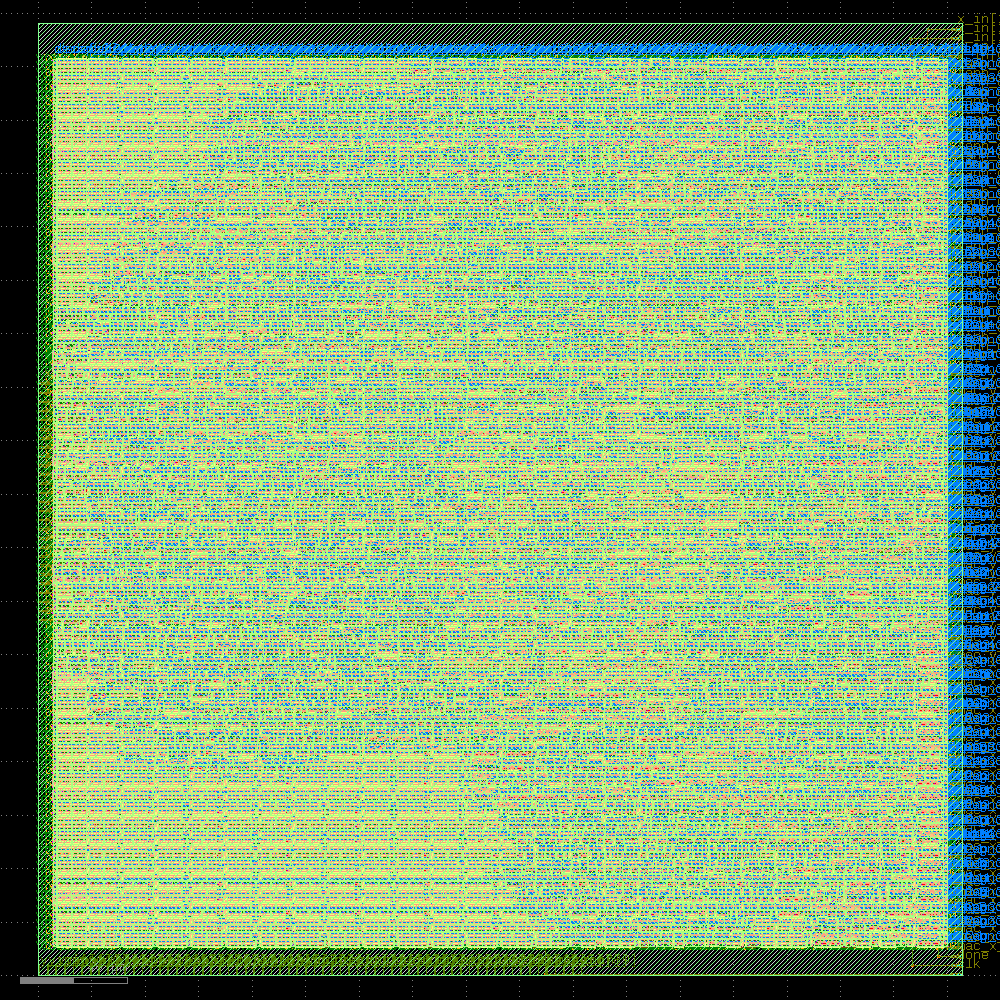

In [ ]:
display(gds)

### Design Rule Checks (DRC)

DRC determines that the final layout does not violate any of the rules set by
the foundry to ensure the design is actually manufacturable- for example,
not enough space between two wires, *too much* space between tap cells, and so
on.

A design not passing DRC will typically be rejected by the foundry, who
also run DRC on their side.

In [ ]:
DRC = Step.factory.get("Magic.DRC")

drc = DRC(state_in=gds.state_out)
drc.start()

─────────────────────────────────────────────── Design Rule Checks ────────────────────────────────────────────────

[12:37:22] VERBOSE  Running 'Magic.DRC'…                                                               ]8;id=403285;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=256544;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:37:22] VERBOSE  Logging subprocess to ]8;id=670692;file:///content/openlane_run/15-magic-drc/magic-drc.log\openlane_run/]8;;\]8;id=361444;file:///content/openlane_run/15-magic-drc/magic-drc.log\15]8;;\]8;id=670692;file:///content/openlane_run/15-magic-drc/magic-drc.log\-magic-drc/magic-drc.log]8;;\…                     ]8;id=534267;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=189040;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

Warning: Calma reading is not undoable!  I hope that's OK.

Library written using GDS-II Release 6.0

Library name: LIB

Reading "VIA_M3M4_PR".

Reading "VIA_M1M2_PR_MR".

Reading "VIA_M2M3_PR".

Reading "VIA_L1M1_PR_MR".

Reading "VIA_M1M2_PR".

Reading "VIA_via2_3_3000_480_1_9_320_320".

Reading "VIA_via3_4_3000_480_1_7_400_400".

Reading "VIA_via4_5_3000_480_1_7_400_400".

Reading "VIA_via5_6_3000_3000_1_1_1600_1600".

Reading "sky130_fd_sc_hd__clkbuf_4".

Reading "sky130_fd_sc_hd__inv_4".

Reading "sky130_fd_sc_hd__clkinvlp_4".

Reading "sky130_fd_sc_hd__clkinv_4".

Reading "sky130_fd_sc_hd__inv_16".

Reading "sky130_fd_sc_hd__inv_6".

Reading "sky130_fd_sc_hd__clkinv_8".

Reading "sky130_fd_sc_hd__inv_8".

Reading "sky130_fd_sc_hd__inv_12".

Reading "sky130_fd_sc_hd__clkbuf_8".

Reading "sky130_fd_sc_hd__clkbuf_16".

Reading "sky130_fd_sc_hd__dlxtn_1".

Reading "sky130_fd_sc_hd__dfxtp_2".

Reading "sky130_fd_sc_hd__dfrtp_2".

Reading "sky130_fd_sc_hd__nand4b_2".

Reading "sky130_fd_sc_hd__a41oi_2".

Reading "sky130_fd_sc_hd__o41ai_2".

Reading "sky130_fd_sc_hd__nand3b_2".

Reading "sky130_fd_sc_hd__nor4b_2".

Reading "sky130_fd_sc_hd__o311ai_2".

Reading "sky130_fd_sc_hd__and4bb_2".

Reading "sky130_fd_sc_hd__o22ai_2".

Reading "sky130_fd_sc_hd__or4b_2".

Reading "sky130_fd_sc_hd__o31ai_2".

Reading "sky130_fd_sc_hd__nor4_2".

Reading "sky130_fd_sc_hd__o22a_2".

Reading "sky130_fd_sc_hd__a32oi_2".

Reading "sky130_fd_sc_hd__or3b_2".

Reading "sky130_fd_sc_hd__nor3b_2".

Reading "sky130_fd_sc_hd__a41o_2".

Reading "sky130_fd_sc_hd__a21boi_2".

Reading "sky130_fd_sc_hd__or4bb_2".

Reading "sky130_fd_sc_hd__o2bb2a_2".

Reading "sky130_fd_sc_hd__a22o_2".

Reading "sky130_fd_sc_hd__a2111o_2".

Reading "sky130_fd_sc_hd__o2bb2ai_2".

Reading "sky130_fd_sc_hd__o21bai_2".

Reading "sky130_fd_sc_hd__a2bb2o_2".

Reading "sky130_fd_sc_hd__o221a_2".

Reading "sky130_fd_sc_hd__a21bo_2".

Reading "sky130_fd_sc_hd__o211ai_2".

Reading "sky130_fd_sc_hd__a32o_2".

Reading "sky130_fd_sc_hd__xnor2_2".

Reading "sky130_fd_sc_hd__a221oi_2".

Reading "sky130_fd_sc_hd__a211oi_2".

Reading "sky130_fd_sc_hd__o2111ai_2".

Reading "sky130_fd_sc_hd__o32a_2".

Reading "sky130_fd_sc_hd__and4_2".

Reading "sky130_fd_sc_hd__nand4_2".

Reading "sky130_fd_sc_hd__xor2_2".

Reading "sky130_fd_sc_hd__nand3_2".

Reading "sky130_fd_sc_hd__o221ai_2".

Reading "sky130_fd_sc_hd__o2111a_2".

Reading "sky130_fd_sc_hd__a2111oi_2".

Reading "sky130_fd_sc_hd__a221o_2".

Reading "sky130_fd_sc_hd__o311a_2".

Reading "sky130_fd_sc_hd__a22oi_2".

Reading "sky130_fd_sc_hd__nand2_2".

Reading "sky130_fd_sc_hd__a311o_2".

Reading "sky130_fd_sc_hd__a311oi_2".

Reading "sky130_fd_sc_hd__a31oi_2".

Reading "sky130_fd_sc_hd__o41a_2".

Reading "sky130_fd_sc_hd__mux4_2".

Reading "sky130_fd_sc_hd__o31a_2".

Reading "sky130_fd_sc_hd__or3_2".

Reading "sky130_fd_sc_hd__or4_2".

Reading "sky130_fd_sc_hd__or2_2".

Reading "sky130_fd_sc_hd__nand2b_2".

Reading "sky130_fd_sc_hd__o211a_2".

Reading "sky130_fd_sc_hd__and2b_2".

Reading "sky130_fd_sc_hd__nor3_2".

Reading "sky130_fd_sc_hd__and4b_2".

Reading "sky130_fd_sc_hd__o21a_2".

Reading "sky130_fd_sc_hd__a211o_2".

Reading "sky130_fd_sc_hd__mux2_1".

Reading "sky130_fd_sc_hd__a21oi_2".

Reading "sky130_fd_sc_hd__and3b_2".

Reading "sky130_fd_sc_hd__a21o_2".

Reading "sky130_fd_sc_hd__o21ai_2".

Reading "sky130_fd_sc_hd__o21ba_2".

Reading "sky130_fd_sc_hd__a31o_2".

Reading "sky130_fd_sc_hd__nor2_2".

Reading "sky130_fd_sc_hd__and2_2".

Reading "sky130_fd_sc_hd__and3_2".

Reading "sky130_fd_sc_hd__inv_2".

Reading "sky130_fd_sc_hd__tapvpwrvgnd_1".

Reading "sky130_fd_sc_hd__decap_4".

Reading "sky130_fd_sc_hd__decap_8".

Reading "sky130_fd_sc_hd__fill_2".

Reading "sky130_fd_sc_hd__decap_6".

Reading "sky130_fd_sc_hd__fill_1".

Reading "sky130_ef_sc_hd__decap_12".

Reading "sky130_fd_sc_hd__decap_3".

Reading "cordic_neuron".

5000 uses

10000 uses

15000 uses

20000 uses

25000 uses

30000 uses

35000 uses

40000 uses

45000 uses

50000 uses

55000 uses

60000 uses

[INFO] Loading cordic_neuron

DRC style is now "drc(full)"

Loading DRC CIF style.

No errors found.

[INFO] COUNT: 0

[INFO] Should be divided by 3 or 4

[INFO] DRC Checking DONE (/content/openlane_run/15-magic-drc/reports/drc_violations.magic.rpt)

[INFO] Saving mag view with DRC errors (/content/openlane_run/15-magic-drc/views/cordic_neuron.drc.mag)

[INFO] Saved

{'nl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'), 'pnl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'), 'sdc': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/12-openroad-rcx/nom/cordic_neuron.nom.spef'), 'min_*': Path('/content/openlane_run/12-openroad-rcx/min/cordic_neuron.min.spef'), 'max_*': Path('/content/openlane_run/12-openroad-rcx/max/cordic_neuron.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 7031, 'design__instance__area': 59143, 'design__instance_unmapped__count': 64, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 345.54 356.26', 'design__core__bbox': '5.52 10.88 339.94 342.72', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 198, 'design__die__area': 123102, 'design__core__area': 110974, 'design__instance__count__stdcell': 7031, 'design__instance__area__stdcell': 59143, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.532945'), 'design__instance__utilization__stdcell': Decimal('0.532945'), 'floorplan__design__io': 196, 'design__io__hp

### SPICE Extraction for Layout vs. Schematic Check

This step tries to reconstruct a SPICE netlist from the GDSII file, so it can
later be used for the **Layout vs. Schematic** (LVS) check.

In [ ]:
SpiceExtraction = Step.factory.get("Magic.SpiceExtraction")

spx = SpiceExtraction(state_in=drc.state_out)
spx.start()

───────────────────────────────────────────── SPICE Model Extraction ──────────────────────────────────────────────

[12:38:16] VERBOSE  Running 'Magic.SpiceExtraction'…                                                   ]8;id=668983;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=435034;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:38:16] VERBOSE  Logging subprocess to                                                              ]8;id=492583;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=987945;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=202279;file:///content/openlane_run/16-magic-spiceextraction/magic-spiceextraction.log\openlane_run/]8;;\]8;id=904686;file:///content/openlane_run/16-magic-spiceextraction/magic-spiceextraction.log\16]8;;\]8;id=202279;file:///content/openlane_run/16-magic-spiceextraction/magic-spiceextraction.log\-magic-spiceextraction/magic-spiceextraction.log]8;;\…                               

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef.

This action cannot be undone.

LEF read, Line 78 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 79 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 112 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 114 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 115 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 121 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 122 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 123 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 156 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 164 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 165 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 167 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 168 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 169 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 206 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 207 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 209 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 210 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 211 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 248 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 249 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 251 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 252 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 253 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 290 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 291 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read: Processed 797 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 56535 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 278 lines.

> def read /content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def -noblockage -labels

Reading DEF data from file /content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def.

This action cannot be undone.

Processed 4 vias total.

Processed 14265 subcell instances total.

Processed 198 pins total.

Processed 2 special nets total.

Processed 5601 nets total.

DEF read: Processed 114589 lines.

Moving label "_00090_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00109_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00112_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00113_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00137_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00138_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00143_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00148_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00152_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00153_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00156_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00157_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00159_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00186_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00189_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00191_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00195_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00197_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00206_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00224_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00225_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00226_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00232_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00235_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00245_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00254_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00256_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00299_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00300_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00303_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00304_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00318_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00328_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00329_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00374_" from metal1 to viali in cell cordic_neuron.

Moving label "_00414_" from metal2 to via1 in cell cordic_neuron.

Moving label "_00486_" from metal1 to viali in cell cordic_neuron.

Moving label "_00620_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00640_" from metal2 to via2 in cell cordic_neuron.

Moving label "_00847_" from metal2 to via1 in cell cordic_neuron.

Moving label "_00924_" from metal1 to viali in cell cordic_neuron.

Moving label "_00953_" from metal2 to via2 in cell cordic_neuron.

Moving label "_00956_" from metal1 to via1 in cell cordic_neuron.

Moving label "_00985_" from metal2 to via1 in cell cordic_neuron.

Moving label "_01050_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01053_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01055_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01068_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01075_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01147_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01201_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01209_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01331_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01400_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01432_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01479_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01530_" from metal2 to via1 in cell cordic_neuron.

Moving label "_01551_" from metal2 to via1 in cell cordic_neuron.

Moving label "_01563_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01564_" from metal2 to via2 in cell cordic_neuron.

Moving label "_01624_" from metal2 to via1 in cell cordic_neuron.

Moving label "_01678_" from metal1 to viali in cell cordic_neuron.

Moving label "_01736_" from metal2 to via1 in cell cordic_neuron.

Moving label "_01738_" from metal1 to via1 in cell cordic_neuron.

Moving label "_01834_" from metal2 to via1 in cell cordic_neuron.

Moving label "_02051_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02062_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02081_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02103_" from metal1 to viali in cell cordic_neuron.

Moving label "_02133_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02139_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02145_" from metal2 to via1 in cell cordic_neuron.

Moving label "_02181_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02208_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02320_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02331_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02402_" from metal1 to viali in cell cordic_neuron.

Moving label "_02410_" from metal1 to viali in cell cordic_neuron.

Moving label "_02415_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02424_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02485_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02501_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02541_" from metal2 to via1 in cell cordic_neuron.

Moving label "_02604_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02694_" from metal2 to via1 in cell cordic_neuron.

Moving label "_02772_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02838_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02887_" from metal2 to via2 in cell cordic_neuron.

Moving label "_02983_" from metal1 to via1 in cell cordic_neuron.

Moving label "_02993_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03007_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03011_" from metal2 to via1 in cell cordic_neuron.

Moving label "_03017_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03076_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03080_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03145_" from metal1 to viali in cell cordic_neuron.

Moving label "_03146_" from metal1 to viali in cell cordic_neuron.

Moving label "_03262_" from metal1 to viali in cell cordic_neuron.

Moving label "_03307_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03312_" from metal2 to via1 in cell cordic_neuron.

Moving label "_03324_" from metal1 to viali in cell cordic_neuron.

Moving label "_03346_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03355_" from metal1 to viali in cell cordic_neuron.

Moving label "_03390_" from metal1 to viali in cell cordic_neuron.

Moving label "_03462_" from metal1 to viali in cell cordic_neuron.

Moving label "_03535_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03577_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03595_" from metal2 to via2 in cell cordic_neuron.

Moving label "_03621_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03678_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03684_" from metal2 to via2 in cell cordic_neuron.

Moving label "_03708_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03709_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03829_" from metal1 to via1 in cell cordic_neuron.

Moving label "_03876_" from metal2 to via2 in cell cordic_neuron.

Moving label "_03978_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04112_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04168_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04173_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04220_" from metal1 to viali in cell cordic_neuron.

Moving label "_04252_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04254_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04302_" from metal2 to via1 in cell cordic_neuron.

Moving label "_04312_" from metal1 to viali in cell cordic_neuron.

Moving label "_04352_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04453_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04460_" from metal1 to viali in cell cordic_neuron.

Moving label "_04550_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04565_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04573_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04628_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04649_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04651_" from metal1 to viali in cell cordic_neuron.

Moving label "_04685_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04696_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04704_" from metal1 to viali in cell cordic_neuron.

Moving label "_04717_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04868_" from metal2 to via2 in cell cordic_neuron.

Moving label "_04870_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04941_" from metal1 to via1 in cell cordic_neuron.

Moving label "_04962_" from metal1 to via1 in cell cordic_neuron.

Moving label "clknet_0_clk" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_inst.x\[1\]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_inst.x\[22\]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_inst.x\[6\]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_inst.y\[5\]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_inst.z\[22\]" from metal1 to viali in cell cordic_neuron.

Moving label "mac_x_out[15]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[16]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[17]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[23]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[24]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[30]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[31]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[3]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_x_out[7]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_y_out[18]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_y_out[22]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_y_out[2]" from metal2 to via2 in cell cordic_neuron.

Moving label "mac_y_out[5]" from metal2 to via1 in cell cordic_neuron.

Moving label "next_state\[0\]" from metal1 to via1 in cell cordic_neuron.

Moving label "tanh_inst.LOOKUP.index\[0\]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_inst.divider.y\[-6\]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_inst.divider.y\[-8\]" from metal2 to via1 in cell cordic_neuron.

Moving label "tanh_out[0]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[15]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[22]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[23]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[24]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[28]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[31]" from metal2 to via2 in cell cordic_neuron.

Moving label "tanh_out[6]" from metal2 to via2 in cell cordic_neuron.

Moving label "x_in[8]" from metal2 to via2 in cell cordic_neuron.

Processing cordic_neuron

Extracting sky130_ef_sc_hd__decap_12 into sky130_ef_sc_hd__decap_12.ext:

Extracting sky130_fd_sc_hd__decap_3 into sky130_fd_sc_hd__decap_3.ext:

Extracting sky130_fd_sc_hd__fill_1 into sky130_fd_sc_hd__fill_1.ext:

Extracting sky130_fd_sc_hd__tapvpwrvgnd_1 into sky130_fd_sc_hd__tapvpwrvgnd_1.ext:

Extracting sky130_fd_sc_hd__decap_4 into sky130_fd_sc_hd__decap_4.ext:

Extracting sky130_fd_sc_hd__decap_6 into sky130_fd_sc_hd__decap_6.ext:

Extracting sky130_fd_sc_hd__xor2_2 into sky130_fd_sc_hd__xor2_2.ext:

Extracting sky130_fd_sc_hd__a21bo_2 into sky130_fd_sc_hd__a21bo_2.ext:

Extracting sky130_fd_sc_hd__and2_2 into sky130_fd_sc_hd__and2_2.ext:

Extracting sky130_fd_sc_hd__a21oi_2 into sky130_fd_sc_hd__a21oi_2.ext:

Extracting sky130_fd_sc_hd__xnor2_2 into sky130_fd_sc_hd__xnor2_2.ext:

Extracting sky130_fd_sc_hd__fill_2 into sky130_fd_sc_hd__fill_2.ext:

Extracting sky130_fd_sc_hd__nor2_2 into sky130_fd_sc_hd__nor2_2.ext:

Extracting sky130_fd_sc_hd__nand2_2 into sky130_fd_sc_hd__nand2_2.ext:

Extracting sky130_fd_sc_hd__decap_8 into sky130_fd_sc_hd__decap_8.ext:

Extracting sky130_fd_sc_hd__o21ai_2 into sky130_fd_sc_hd__o21ai_2.ext:

Extracting sky130_fd_sc_hd__inv_2 into sky130_fd_sc_hd__inv_2.ext:

Extracting sky130_fd_sc_hd__or2_2 into sky130_fd_sc_hd__or2_2.ext:

Extracting sky130_fd_sc_hd__dfrtp_2 into sky130_fd_sc_hd__dfrtp_2.ext:

Extracting sky130_fd_sc_hd__and2b_2 into sky130_fd_sc_hd__and2b_2.ext:

Extracting sky130_fd_sc_hd__a21o_2 into sky130_fd_sc_hd__a21o_2.ext:

Extracting sky130_fd_sc_hd__o211ai_2 into sky130_fd_sc_hd__o211ai_2.ext:

Extracting sky130_fd_sc_hd__o31a_2 into sky130_fd_sc_hd__o31a_2.ext:

Extracting sky130_fd_sc_hd__nand3_2 into sky130_fd_sc_hd__nand3_2.ext:

Extracting sky130_fd_sc_hd__a41o_2 into sky130_fd_sc_hd__a41o_2.ext:

Extracting sky130_fd_sc_hd__o21ba_2 into sky130_fd_sc_hd__o21ba_2.ext:

Extracting sky130_fd_sc_hd__o21a_2 into sky130_fd_sc_hd__o21a_2.ext:

Extracting sky130_fd_sc_hd__nand2b_2 into sky130_fd_sc_hd__nand2b_2.ext:

Extracting sky130_fd_sc_hd__o311a_2 into sky130_fd_sc_hd__o311a_2.ext:

Extracting sky130_fd_sc_hd__a221o_2 into sky130_fd_sc_hd__a221o_2.ext:

Extracting sky130_fd_sc_hd__o211a_2 into sky130_fd_sc_hd__o211a_2.ext:

Extracting sky130_fd_sc_hd__o221a_2 into sky130_fd_sc_hd__o221a_2.ext:

Extracting sky130_fd_sc_hd__or4b_2 into sky130_fd_sc_hd__or4b_2.ext:

Extracting sky130_fd_sc_hd__a31o_2 into sky130_fd_sc_hd__a31o_2.ext:

Extracting sky130_fd_sc_hd__a211o_2 into sky130_fd_sc_hd__a211o_2.ext:

Extracting sky130_fd_sc_hd__or4_2 into sky130_fd_sc_hd__or4_2.ext:

Extracting sky130_fd_sc_hd__and3_2 into sky130_fd_sc_hd__and3_2.ext:

Extracting sky130_fd_sc_hd__o2bb2a_2 into sky130_fd_sc_hd__o2bb2a_2.ext:

Extracting sky130_fd_sc_hd__o31ai_2 into sky130_fd_sc_hd__o31ai_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_8 into sky130_fd_sc_hd__clkbuf_8.ext:

Extracting sky130_fd_sc_hd__nor3_2 into sky130_fd_sc_hd__nor3_2.ext:

Extracting sky130_fd_sc_hd__a22oi_2 into sky130_fd_sc_hd__a22oi_2.ext:

Extracting sky130_fd_sc_hd__and3b_2 into sky130_fd_sc_hd__and3b_2.ext:

Extracting sky130_fd_sc_hd__a211oi_2 into sky130_fd_sc_hd__a211oi_2.ext:

Extracting sky130_fd_sc_hd__a22o_2 into sky130_fd_sc_hd__a22o_2.ext:

Extracting sky130_fd_sc_hd__and4_2 into sky130_fd_sc_hd__and4_2.ext:

Extracting sky130_fd_sc_hd__or3_2 into sky130_fd_sc_hd__or3_2.ext:

Extracting sky130_fd_sc_hd__inv_8 into sky130_fd_sc_hd__inv_8.ext:

Extracting sky130_fd_sc_hd__inv_16 into sky130_fd_sc_hd__inv_16.ext:

Extracting sky130_fd_sc_hd__o22ai_2 into sky130_fd_sc_hd__o22ai_2.ext:

Extracting sky130_fd_sc_hd__nor4b_2 into sky130_fd_sc_hd__nor4b_2.ext:

Extracting sky130_fd_sc_hd__and4b_2 into sky130_fd_sc_hd__and4b_2.ext:

Extracting sky130_fd_sc_hd__mux2_1 into sky130_fd_sc_hd__mux2_1.ext:

Extracting sky130_fd_sc_hd__o2111a_2 into sky130_fd_sc_hd__o2111a_2.ext:

Extracting sky130_fd_sc_hd__o32a_2 into sky130_fd_sc_hd__o32a_2.ext:

Extracting sky130_fd_sc_hd__dlxtn_1 into sky130_fd_sc_hd__dlxtn_1.ext:

Extracting sky130_fd_sc_hd__nor4_2 into sky130_fd_sc_hd__nor4_2.ext:

Extracting sky130_fd_sc_hd__a2111oi_2 into sky130_fd_sc_hd__a2111oi_2.ext:

Extracting sky130_fd_sc_hd__mux4_2 into sky130_fd_sc_hd__mux4_2.ext:

Extracting sky130_fd_sc_hd__o2111ai_2 into sky130_fd_sc_hd__o2111ai_2.ext:

Extracting sky130_fd_sc_hd__o311ai_2 into sky130_fd_sc_hd__o311ai_2.ext:

Extracting sky130_fd_sc_hd__o22a_2 into sky130_fd_sc_hd__o22a_2.ext:

Extracting sky130_fd_sc_hd__a2bb2o_2 into sky130_fd_sc_hd__a2bb2o_2.ext:

Extracting sky130_fd_sc_hd__a32o_2 into sky130_fd_sc_hd__a32o_2.ext:

Extracting sky130_fd_sc_hd__and4bb_2 into sky130_fd_sc_hd__and4bb_2.ext:

Extracting sky130_fd_sc_hd__or3b_2 into sky130_fd_sc_hd__or3b_2.ext:

Extracting sky130_fd_sc_hd__a21boi_2 into sky130_fd_sc_hd__a21boi_2.ext:

Extracting sky130_fd_sc_hd__inv_12 into sky130_fd_sc_hd__inv_12.ext:

Extracting sky130_fd_sc_hd__dfxtp_2 into sky130_fd_sc_hd__dfxtp_2.ext:

Extracting sky130_fd_sc_hd__inv_6 into sky130_fd_sc_hd__inv_6.ext:

Extracting sky130_fd_sc_hd__a311o_2 into sky130_fd_sc_hd__a311o_2.ext:

Extracting sky130_fd_sc_hd__o221ai_2 into sky130_fd_sc_hd__o221ai_2.ext:

Extracting sky130_fd_sc_hd__o41a_2 into sky130_fd_sc_hd__o41a_2.ext:

Extracting sky130_fd_sc_hd__a31oi_2 into sky130_fd_sc_hd__a31oi_2.ext:

Extracting sky130_fd_sc_hd__nand4_2 into sky130_fd_sc_hd__nand4_2.ext:

Extracting sky130_fd_sc_hd__a311oi_2 into sky130_fd_sc_hd__a311oi_2.ext:

Extracting sky130_fd_sc_hd__a221oi_2 into sky130_fd_sc_hd__a221oi_2.ext:

Extracting sky130_fd_sc_hd__nand3b_2 into sky130_fd_sc_hd__nand3b_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_16 into sky130_fd_sc_hd__clkbuf_16.ext:

Extracting sky130_fd_sc_hd__o41ai_2 into sky130_fd_sc_hd__o41ai_2.ext:

Extracting sky130_fd_sc_hd__inv_4 into sky130_fd_sc_hd__inv_4.ext:

Extracting sky130_fd_sc_hd__clkinv_8 into sky130_fd_sc_hd__clkinv_8.ext:

Extracting sky130_fd_sc_hd__o21bai_2 into sky130_fd_sc_hd__o21bai_2.ext:

Extracting sky130_fd_sc_hd__a2111o_2 into sky130_fd_sc_hd__a2111o_2.ext:

Extracting sky130_fd_sc_hd__o2bb2ai_2 into sky130_fd_sc_hd__o2bb2ai_2.ext:

Extracting sky130_fd_sc_hd__clkinv_4 into sky130_fd_sc_hd__clkinv_4.ext:

Extracting sky130_fd_sc_hd__a32oi_2 into sky130_fd_sc_hd__a32oi_2.ext:

Extracting sky130_fd_sc_hd__nor3b_2 into sky130_fd_sc_hd__nor3b_2.ext:

Extracting sky130_fd_sc_hd__or4bb_2 into sky130_fd_sc_hd__or4bb_2.ext:

Extracting sky130_fd_sc_hd__nand4b_2 into sky130_fd_sc_hd__nand4b_2.ext:

Extracting sky130_fd_sc_hd__a41oi_2 into sky130_fd_sc_hd__a41oi_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_4 into sky130_fd_sc_hd__clkbuf_4.ext:

Extracting sky130_fd_sc_hd__clkinvlp_4 into sky130_fd_sc_hd__clkinvlp_4.ext:

Extracting cordic_neuron into cordic_neuron.ext:

exttospice finished.

Using technology "sky130A", version 1.0.466-0-gbdc9412

{'nl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'), 'pnl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'), 'sdc': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/12-openroad-rcx/nom/cordic_neuron.nom.spef'), 'min_*': Path('/content/openlane_run/12-openroad-rcx/min/cordic_neuron.min.spef'), 'max_*': Path('/content/openlane_run/12-openroad-rcx/max/cordic_neuron.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.lib')}, 'spice': Path('/content/openlane_run/16-magic-spiceextraction/cordic_neuron.spice'), 'mag': None, 'gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 7031, 'design__instance__area': 59143, 'design__instance_unmapped__count': 64, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 345.54 356.26', 'design__core__bbox': '5.52 10.88 339.94 342.72', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 198, 'design__die__area': 123102, 'design__core__area': 110974, 'design__instance__count__stdcell': 7031, 'design__instance__area__stdcell': 59143, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.532945'), 'design__instance__utilization__stdcel

### Layout vs. Schematic (LVS)

A comparison between the final Verilog netlist (from PnR) and the final
SPICE netlist (extracted.)

This check effectively compares the physically implemented circuit to the final
Verilog netlist output by OpenROAD.

The idea is, if there are any disconnects, shorts or other mismatches in the
physical implementation that do not exist in the logical view of the design,
they would be caught at this step.

Common issues that result in LVS violations include:
* Lack of fill cells or tap cells in the design
* Two unrelated signals to be shorted, or a wire to be disconnected (most
  commonly seen with misconfigured PDN)

Chips with LVS errors are typically dead on arrival.

In [ ]:
LVS = Step.factory.get("Netgen.LVS")

lvs = LVS(state_in=spx.state_out)
lvs.start()

─────────────────────────────────────────────────── Netgen LVS ────────────────────────────────────────────────────

[12:38:29] VERBOSE  Running 'Netgen.LVS'…                                                              ]8;id=483072;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=586111;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[12:38:29] VERBOSE  Logging subprocess to ]8;id=801134;file:///content/openlane_run/17-netgen-lvs/netgen-lvs.log\openlane_run/]8;;\]8;id=238383;file:///content/openlane_run/17-netgen-lvs/netgen-lvs.log\17]8;;\]8;id=801134;file:///content/openlane_run/17-netgen-lvs/netgen-lvs.log\-netgen-lvs/netgen-lvs.log]8;;\…                   ]8;id=821698;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=177822;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Netgen 1.5.270 compiled on Sun Jun  2 19:00:27 UTC 2024

Warning: netgen command 'format' use fully-qualified name '::netgen::format'

Warning: netgen command 'global' use fully-qualified name '::netgen::global'

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Reading SPICE netlist file                                                                                         
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice'...

Call to undefined subcircuit sky130_fd_pr__pfet_01v8_hvt

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_pr__nfet_01v8

Creating placeholder cell definition.

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice'...

Call to undefined subcircuit sky130_fd_sc_hd__nand2_2

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_sc_hd__nor2_2

Creating placeholder cell definition.

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Note:  Implicit pin Y in instance clkload0 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload1 of sky130_fd_sc_hd__inv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload2 of sky130_fd_sc_hd__inv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload3 of sky130_fd_sc_hd__inv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload4 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload5 of sky130_fd_sc_hd__inv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload6 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload7 of sky130_fd_sc_hd__clkinv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload8 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload9 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload10 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload11 of sky130_fd_sc_hd__inv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload12 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload13 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload14 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload15 of sky130_fd_sc_hd__inv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload16 of sky130_fd_sc_hd__inv_16 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload17 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload18 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload19 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload20 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload21 of sky130_fd_sc_hd__clkinv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload22 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload23 of sky130_fd_sc_hd__clkinvlp_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload24 of sky130_fd_sc_hd__clkinvlp_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload25 of sky130_fd_sc_hd__clkinv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload26 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload27 of sky130_fd_sc_hd__clkinv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload28 of sky130_fd_sc_hd__clkinv_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload29 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload30 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload31 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload32 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin X in instance clkload33 of sky130_fd_sc_hd__clkbuf_4 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload34 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload35 of sky130_fd_sc_hd__inv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload36 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload37 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload38 of sky130_fd_sc_hd__inv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload39 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload40 of sky130_fd_sc_hd__clkinv_8 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload41 of sky130_fd_sc_hd__inv_6 in cell cordic_neuron

Note:  Implicit pin Y in instance clkload42 of sky130_fd_sc_hd__inv_12 in cell cordic_neuron

Treating empty subcircuits as black-box cells

Generating JSON file result

Reading setup file /content/openlane_ipynb/openlane/scripts/netgen/setup.tcl

Model sky130_fd_pr__res_generic_po pin end_a == end_b

No property mult found for device sky130_fd_pr__res_generic_po

Model sky130_fd_pr__nfet_01v8 pin 1 == 3

No property mult found for device sky130_fd_pr__nfet_01v8

No property sa found for device sky130_fd_pr__nfet_01v8

No property sb found for device sky130_fd_pr__nfet_01v8

No property sd found for device sky130_fd_pr__nfet_01v8

No property nf found for device sky130_fd_pr__nfet_01v8

No property nrd found for device sky130_fd_pr__nfet_01v8

No property nrs found for device sky130_fd_pr__nfet_01v8

No property area found for device sky130_fd_pr__nfet_01v8

No property perim found for device sky130_fd_pr__nfet_01v8

No property topography found for device sky130_fd_pr__nfet_01v8

Model sky130_fd_pr__pfet_01v8_hvt pin 1 == 3

No property mult found for device sky130_fd_pr__pfet_01v8_hvt

No property sa found for device sky130_fd_pr__pfet_01v8_hvt

No property sb found for device sky130_fd_pr__pfet_01v8_hvt

No property sd found for device sky130_fd_pr__pfet_01v8_hvt

No property nf found for device sky130_fd_pr__pfet_01v8_hvt

No property nrd found for device sky130_fd_pr__pfet_01v8_hvt

No property nrs found for device sky130_fd_pr__pfet_01v8_hvt

No property area found for device sky130_fd_pr__pfet_01v8_hvt

No property perim found for device sky130_fd_pr__pfet_01v8_hvt

No property topography found for device sky130_fd_pr__pfet_01v8_hvt

No property value found for device sky130_fd_pr__diode_pw2nd_05v5

No property mult found for device sky130_fd_pr__diode_pw2nd_05v5

No property perim found for device sky130_fd_pr__diode_pw2nd_05v5

Comparison output logged to file /content/openlane_run/17-netgen-lvs/reports/lvs.netgen.rpt

Logging to file "/content/openlane_run/17-netgen-lvs/reports/lvs.netgen.rpt" enabled

Contents of circuit 1:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_ef_sc_hd__decap_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__or2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nand2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o211a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21bo_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__and2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux4_2'

Circuit sky130_fd_sc_hd__mux4_2 contains 0 device instances.

Circuit contains 0 nets, and 11 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux4_2'

Circuit sky130_fd_sc_hd__mux4_2 contains 28 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  14

Class: sky130_fd_pr__pfet_01v8_hvt instances:  14

Circuit contains 24 nets.

Circuit sky130_fd_sc_hd__mux4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__or3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_3 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o211ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xnor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__mux2_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__o21ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__or4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a211oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__and2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a221o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 4 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   2

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__or3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfxtp_2'

Circuit sky130_fd_sc_hd__dfxtp_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfxtp_2'

Circuit sky130_fd_sc_hd__dfxtp_2 contains 26 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  13

Class: sky130_fd_pr__pfet_01v8_hvt instances:  13

Circuit contains 18 nets.

Circuit sky130_fd_sc_hd__dfxtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a311o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__and3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o221a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 30 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  15

Class: sky130_fd_pr__pfet_01v8_hvt instances:  15

Circuit contains 21 nets.

Circuit sky130_fd_sc_hd__dfrtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a31oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a31o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nand4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dlxtn_1'

Circuit sky130_fd_sc_hd__dlxtn_1 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dlxtn_1'

Circuit sky130_fd_sc_hd__dlxtn_1 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 16 nets.

Circuit sky130_fd_sc_hd__dlxtn_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a211o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o311a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21boi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a22o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__or4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__nand2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o31a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a32o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__and4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a32oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nor3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__and3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o32a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o21ba_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21bai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o31ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2bb2a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o311ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o41a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o221ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o22a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_12'

Circuit sky130_fd_sc_hd__inv_12 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_12'

Circuit sky130_fd_sc_hd__inv_12 contains 24 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  12

Class: sky130_fd_pr__pfet_01v8_hvt instances:  12

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a22oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o2111a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nand3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221oi_2'

Circuit sky130_fd_sc_hd__a221oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221oi_2'

Circuit sky130_fd_sc_hd__a221oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a221oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a41o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_8'

Circuit sky130_fd_sc_hd__clkinv_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_8'

Circuit sky130_fd_sc_hd__clkinv_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:  12

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_8'

Circuit sky130_fd_sc_hd__inv_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_8'

Circuit sky130_fd_sc_hd__inv_8 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__and4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a2bb2o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_6'

Circuit sky130_fd_sc_hd__inv_6 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_6'

Circuit sky130_fd_sc_hd__inv_6 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_4'

Circuit sky130_fd_sc_hd__inv_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_4'

Circuit sky130_fd_sc_hd__inv_4 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111oi_2'

Circuit sky130_fd_sc_hd__a2111oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111oi_2'

Circuit sky130_fd_sc_hd__a2111oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 16 nets.

Circuit sky130_fd_sc_hd__a2111oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  20

Class: sky130_fd_pr__pfet_01v8_hvt instances:  20

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nor4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_4'

Circuit sky130_fd_sc_hd__clkinv_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_4'

Circuit sky130_fd_sc_hd__clkinv_4 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_4'

Circuit sky130_fd_sc_hd__clkbuf_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_4'

Circuit sky130_fd_sc_hd__clkbuf_4 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2111ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinvlp_4'

Circuit sky130_fd_sc_hd__clkinvlp_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinvlp_4'

Circuit sky130_fd_sc_hd__clkinvlp_4 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__clkinvlp_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a311oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2bb2ai_2'

Circuit sky130_fd_sc_hd__o2bb2ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2bb2ai_2'

Circuit sky130_fd_sc_hd__o2bb2ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o2bb2ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nor3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o41ai_2'

Circuit sky130_fd_sc_hd__o41ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o41ai_2'

Circuit sky130_fd_sc_hd__o41ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o41ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_16'

Circuit sky130_fd_sc_hd__inv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_16'

Circuit sky130_fd_sc_hd__inv_16 contains 32 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  16

Class: sky130_fd_pr__pfet_01v8_hvt instances:  16

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__and4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a2111o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4b_2'

Circuit sky130_fd_sc_hd__nor4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4b_2'

Circuit sky130_fd_sc_hd__nor4b_2 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__nor4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nand3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o22ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__or4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41oi_2'

Circuit sky130_fd_sc_hd__a41oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41oi_2'

Circuit sky130_fd_sc_hd__a41oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a41oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4b_2'

Circuit sky130_fd_sc_hd__nand4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4b_2'

Circuit sky130_fd_sc_hd__nand4b_2 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__nand4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'cordic_neuron'

Circuit cordic_neuron contains 14265 device instances.

Class: sky130_fd_sc_hd__o2111ai_2 instances:   3

Class: sky130_fd_sc_hd__a41o_2 instances:   5

Class: sky130_fd_sc_hd__a31o_2 instances: 142

Class: sky130_fd_sc_hd__a21o_2 instances: 230

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__a32oi_2 instances:   2

Class: sky130_fd_sc_hd__dfxtp_2 instances: 206

Class: sky130_fd_sc_hd__o31ai_2 instances:  14

Class: sky130_fd_sc_hd__or4_2 instances:  58

Class: sky130_fd_sc_hd__a31oi_2 instances:  13

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  16

Class: sky130_fd_sc_hd__and3b_2 instances:   9

Class: sky130_fd_sc_hd__xor2_2 instances: 155

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 185

Class: sky130_ef_sc_hd__decap_12 instances: 1945

Class: sky130_fd_sc_hd__dfrtp_2 instances: 116

Class: sky130_fd_sc_hd__and4_2 instances:  31

Class: sky130_fd_sc_hd__inv_2 instances: 169

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:  10

Class: sky130_fd_sc_hd__inv_8 instances:   6

Class: sky130_fd_sc_hd__clkbuf_4 instances:   1

Class: sky130_fd_sc_hd__clkbuf_8 instances:  45

Class: sky130_fd_sc_hd__or3_2 instances:  79

Class: sky130_fd_sc_hd__nand3_2 instances:  22

Class: sky130_fd_sc_hd__o21ba_2 instances:  22

Class: sky130_fd_sc_hd__and2b_2 instances: 103

Class: sky130_fd_sc_hd__a21boi_2 instances:  19

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  53

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_4 instances:   5

Class: sky130_fd_sc_hd__clkinv_8 instances:   8

Class: sky130_fd_sc_hd__and3_2 instances: 103

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 888

Class: sky130_fd_sc_hd__decap_4 instances: 825

Class: sky130_fd_sc_hd__decap_6 instances: 669

Class: sky130_fd_sc_hd__decap_8 instances: 641

Class: sky130_fd_sc_hd__or2_2 instances: 340

Class: sky130_fd_sc_hd__a2111oi_2 instances:   5

Class: sky130_fd_sc_hd__nand2_2 instances: 456

Class: sky130_fd_sc_hd__nor4b_2 instances:   2

Class: sky130_fd_sc_hd__o311ai_2 instances:   2

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 210

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances: 286

Class: sky130_fd_sc_hd__a211oi_2 instances:  12

Class: sky130_fd_sc_hd__or4b_2 instances:   9

Class: sky130_fd_sc_hd__clkinvlp_4 instances:   2

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   8

Class: sky130_fd_sc_hd__inv_16 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   7

Class: sky130_fd_sc_hd__o22a_2 instances:  55

Class: sky130_fd_sc_hd__xnor2_2 instances: 328

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  44

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:  11

Class: sky130_fd_sc_hd__o211a_2 instances: 103

Class: sky130_fd_sc_hd__nand2b_2 instances:  60

Class: sky130_fd_sc_hd__a311oi_2 instances:   5

Class: sky130_fd_sc_hd__a221o_2 instances:  32

Class: sky130_fd_sc_hd__a211o_2 instances:  82

Class: sky130_fd_sc_hd__o2111a_2 instances:   6

Class: sky130_fd_sc_hd__or3b_2 instances:  16

Class: sky130_fd_sc_hd__or4bb_2 instances:   2

Class: sky130_fd_sc_hd__nor3_2 instances:  36

Class: sky130_fd_sc_hd__a32o_2 instances:  32

Class: sky130_fd_sc_hd__o41a_2 instances:   9

Class: sky130_fd_sc_hd__a22o_2 instances:  63

Class: sky130_fd_sc_hd__o31a_2 instances:  46

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  19

Class: sky130_fd_sc_hd__o21a_2 instances: 284

Class: sky130_fd_sc_hd__o41ai_2 instances:   2

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  22

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:   5

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__o21ai_2 instances: 241

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 1550

Class: sky130_fd_sc_hd__a21oi_2 instances: 217

Class: sky130_fd_sc_hd__a311o_2 instances:  14

Class: sky130_fd_sc_hd__fill_1 instances: 1553

Class: sky130_fd_sc_hd__fill_2 instances: 713

Class: sky130_fd_sc_hd__o211ai_2 instances:  24

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 472

Circuit contains 5582 nets, and 64 disconnected pins.

Contents of circuit 2:  Circuit: 'cordic_neuron'

Circuit cordic_neuron contains 14265 device instances.

Class: sky130_fd_sc_hd__o2111ai_2 instances:   3

Class: sky130_fd_sc_hd__a41o_2 instances:   5

Class: sky130_fd_sc_hd__a31o_2 instances: 142

Class: sky130_fd_sc_hd__a21o_2 instances: 230

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__dfxtp_2 instances: 206

Class: sky130_fd_sc_hd__a32oi_2 instances:   2

Class: sky130_fd_sc_hd__o31ai_2 instances:  14

Class: sky130_fd_sc_hd__or4_2 instances:  58

Class: sky130_fd_sc_hd__a31oi_2 instances:  13

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  16

Class: sky130_fd_sc_hd__and3b_2 instances:   9

Class: sky130_fd_sc_hd__xor2_2 instances: 155

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 185

Class: sky130_ef_sc_hd__decap_12 instances: 1945

Class: sky130_fd_sc_hd__dfrtp_2 instances: 116

Class: sky130_fd_sc_hd__and4_2 instances:  31

Class: sky130_fd_sc_hd__inv_2 instances: 169

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:  10

Class: sky130_fd_sc_hd__inv_8 instances:   6

Class: sky130_fd_sc_hd__clkbuf_4 instances:   1

Class: sky130_fd_sc_hd__clkbuf_8 instances:  45

Class: sky130_fd_sc_hd__or3_2 instances:  79

Class: sky130_fd_sc_hd__nand3_2 instances:  22

Class: sky130_fd_sc_hd__o21ba_2 instances:  22

Class: sky130_fd_sc_hd__and2b_2 instances: 103

Class: sky130_fd_sc_hd__a21boi_2 instances:  19

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  53

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_4 instances:   5

Class: sky130_fd_sc_hd__clkinv_8 instances:   8

Class: sky130_fd_sc_hd__and3_2 instances: 103

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 888

Class: sky130_fd_sc_hd__decap_4 instances: 825

Class: sky130_fd_sc_hd__decap_6 instances: 669

Class: sky130_fd_sc_hd__decap_8 instances: 641

Class: sky130_fd_sc_hd__or2_2 instances: 340

Class: sky130_fd_sc_hd__a2111oi_2 instances:   5

Class: sky130_fd_sc_hd__nand2_2 instances: 456

Class: sky130_fd_sc_hd__nor4b_2 instances:   2

Class: sky130_fd_sc_hd__o311ai_2 instances:   2

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 210

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances: 286

Class: sky130_fd_sc_hd__a211oi_2 instances:  12

Class: sky130_fd_sc_hd__or4b_2 instances:   9

Class: sky130_fd_sc_hd__clkinvlp_4 instances:   2

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   8

Class: sky130_fd_sc_hd__inv_16 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   7

Class: sky130_fd_sc_hd__o22a_2 instances:  55

Class: sky130_fd_sc_hd__xnor2_2 instances: 328

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  44

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:  11

Class: sky130_fd_sc_hd__o211a_2 instances: 103

Class: sky130_fd_sc_hd__nand2b_2 instances:  60

Class: sky130_fd_sc_hd__a311oi_2 instances:   5

Class: sky130_fd_sc_hd__a221o_2 instances:  32

Class: sky130_fd_sc_hd__a211o_2 instances:  82

Class: sky130_fd_sc_hd__o2111a_2 instances:   6

Class: sky130_fd_sc_hd__or3b_2 instances:  16

Class: sky130_fd_sc_hd__or4bb_2 instances:   2

Class: sky130_fd_sc_hd__nor3_2 instances:  36

Class: sky130_fd_sc_hd__a32o_2 instances:  32

Class: sky130_fd_sc_hd__o41a_2 instances:   9

Class: sky130_fd_sc_hd__a22o_2 instances:  63

Class: sky130_fd_sc_hd__o31a_2 instances:  46

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  19

Class: sky130_fd_sc_hd__o21a_2 instances: 284

Class: sky130_fd_sc_hd__o41ai_2 instances:   2

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  22

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:   5

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 1550

Class: sky130_fd_sc_hd__o21ai_2 instances: 241

Class: sky130_fd_sc_hd__a21oi_2 instances: 217

Class: sky130_fd_sc_hd__a311o_2 instances:  14

Class: sky130_fd_sc_hd__fill_1 instances: 1553

Class: sky130_fd_sc_hd__fill_2 instances: 713

Class: sky130_fd_sc_hd__o211ai_2 instances:  24

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 472

Circuit contains 5582 nets, and 64 disconnected pins.

Circuit was modified by parallel/series device merging.

New circuit summary:

Contents of circuit 1:  Circuit: 'cordic_neuron'

Circuit cordic_neuron contains 5489 device instances.

Class: sky130_fd_sc_hd__o2111ai_2 instances:   3

Class: sky130_fd_sc_hd__a41o_2 instances:   5

Class: sky130_fd_sc_hd__a31o_2 instances: 142

Class: sky130_fd_sc_hd__a21o_2 instances: 230

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__a32oi_2 instances:   2

Class: sky130_fd_sc_hd__dfxtp_2 instances: 206

Class: sky130_fd_sc_hd__o31ai_2 instances:  14

Class: sky130_fd_sc_hd__or4_2 instances:  58

Class: sky130_fd_sc_hd__a31oi_2 instances:  13

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  16

Class: sky130_fd_sc_hd__and3b_2 instances:   9

Class: sky130_fd_sc_hd__xor2_2 instances: 155

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 185

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances: 116

Class: sky130_fd_sc_hd__and4_2 instances:  31

Class: sky130_fd_sc_hd__inv_2 instances: 169

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:  10

Class: sky130_fd_sc_hd__inv_8 instances:   6

Class: sky130_fd_sc_hd__clkbuf_4 instances:   1

Class: sky130_fd_sc_hd__clkbuf_8 instances:  45

Class: sky130_fd_sc_hd__or3_2 instances:  79

Class: sky130_fd_sc_hd__nand3_2 instances:  22

Class: sky130_fd_sc_hd__o21ba_2 instances:  22

Class: sky130_fd_sc_hd__and2b_2 instances: 103

Class: sky130_fd_sc_hd__a21boi_2 instances:  19

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  53

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_4 instances:   5

Class: sky130_fd_sc_hd__clkinv_8 instances:   8

Class: sky130_fd_sc_hd__and3_2 instances: 103

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 340

Class: sky130_fd_sc_hd__a2111oi_2 instances:   5

Class: sky130_fd_sc_hd__nand2_2 instances: 456

Class: sky130_fd_sc_hd__nor4b_2 instances:   2

Class: sky130_fd_sc_hd__o311ai_2 instances:   2

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 210

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances: 286

Class: sky130_fd_sc_hd__a211oi_2 instances:  12

Class: sky130_fd_sc_hd__or4b_2 instances:   9

Class: sky130_fd_sc_hd__clkinvlp_4 instances:   2

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   8

Class: sky130_fd_sc_hd__inv_16 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   7

Class: sky130_fd_sc_hd__o22a_2 instances:  55

Class: sky130_fd_sc_hd__xnor2_2 instances: 328

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  44

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:  11

Class: sky130_fd_sc_hd__o211a_2 instances: 103

Class: sky130_fd_sc_hd__nand2b_2 instances:  60

Class: sky130_fd_sc_hd__a311oi_2 instances:   5

Class: sky130_fd_sc_hd__a221o_2 instances:  32

Class: sky130_fd_sc_hd__a211o_2 instances:  82

Class: sky130_fd_sc_hd__o2111a_2 instances:   6

Class: sky130_fd_sc_hd__or3b_2 instances:  16

Class: sky130_fd_sc_hd__or4bb_2 instances:   2

Class: sky130_fd_sc_hd__nor3_2 instances:  36

Class: sky130_fd_sc_hd__a32o_2 instances:  32

Class: sky130_fd_sc_hd__o41a_2 instances:   9

Class: sky130_fd_sc_hd__a22o_2 instances:  63

Class: sky130_fd_sc_hd__o31a_2 instances:  46

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  19

Class: sky130_fd_sc_hd__o21a_2 instances: 284

Class: sky130_fd_sc_hd__o41ai_2 instances:   2

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  22

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:   5

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__o21ai_2 instances: 241

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__a21oi_2 instances: 217

Class: sky130_fd_sc_hd__a311o_2 instances:  14

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:  24

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 472

Circuit contains 5582 nets, and 64 disconnected pins.

Contents of circuit 2:  Circuit: 'cordic_neuron'

Circuit cordic_neuron contains 5489 device instances.

Class: sky130_fd_sc_hd__o2111ai_2 instances:   3

Class: sky130_fd_sc_hd__a41o_2 instances:   5

Class: sky130_fd_sc_hd__a31o_2 instances: 142

Class: sky130_fd_sc_hd__a21o_2 instances: 230

Class: sky130_fd_sc_hd__clkbuf_16 instances:   5

Class: sky130_fd_sc_hd__dfxtp_2 instances: 206

Class: sky130_fd_sc_hd__a32oi_2 instances:   2

Class: sky130_fd_sc_hd__o31ai_2 instances:  14

Class: sky130_fd_sc_hd__or4_2 instances:  58

Class: sky130_fd_sc_hd__a31oi_2 instances:  13

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  16

Class: sky130_fd_sc_hd__and3b_2 instances:   9

Class: sky130_fd_sc_hd__xor2_2 instances: 155

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 185

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances: 116

Class: sky130_fd_sc_hd__and4_2 instances:  31

Class: sky130_fd_sc_hd__inv_2 instances: 169

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:  10

Class: sky130_fd_sc_hd__inv_8 instances:   6

Class: sky130_fd_sc_hd__clkbuf_4 instances:   1

Class: sky130_fd_sc_hd__clkbuf_8 instances:  45

Class: sky130_fd_sc_hd__or3_2 instances:  79

Class: sky130_fd_sc_hd__nand3_2 instances:  22

Class: sky130_fd_sc_hd__o21ba_2 instances:  22

Class: sky130_fd_sc_hd__and2b_2 instances: 103

Class: sky130_fd_sc_hd__a21boi_2 instances:  19

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  53

Class: sky130_fd_sc_hd__a221oi_2 instances:   2

Class: sky130_fd_sc_hd__clkinv_4 instances:   5

Class: sky130_fd_sc_hd__clkinv_8 instances:   8

Class: sky130_fd_sc_hd__and3_2 instances: 103

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 340

Class: sky130_fd_sc_hd__a2111oi_2 instances:   5

Class: sky130_fd_sc_hd__nand2_2 instances: 456

Class: sky130_fd_sc_hd__nor4b_2 instances:   2

Class: sky130_fd_sc_hd__o311ai_2 instances:   2

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 210

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   2

Class: sky130_fd_sc_hd__and2_2 instances: 286

Class: sky130_fd_sc_hd__a211oi_2 instances:  12

Class: sky130_fd_sc_hd__or4b_2 instances:   9

Class: sky130_fd_sc_hd__clkinvlp_4 instances:   2

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   8

Class: sky130_fd_sc_hd__inv_16 instances:   1

Class: sky130_fd_sc_hd__o32a_2 instances:   7

Class: sky130_fd_sc_hd__o22a_2 instances:  55

Class: sky130_fd_sc_hd__xnor2_2 instances: 328

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances:  44

Class: sky130_fd_sc_hd__dlxtn_1 instances:  32

Class: sky130_fd_sc_hd__o21bai_2 instances:  11

Class: sky130_fd_sc_hd__o211a_2 instances: 103

Class: sky130_fd_sc_hd__nand2b_2 instances:  60

Class: sky130_fd_sc_hd__a311oi_2 instances:   5

Class: sky130_fd_sc_hd__a221o_2 instances:  32

Class: sky130_fd_sc_hd__a211o_2 instances:  82

Class: sky130_fd_sc_hd__o2111a_2 instances:   6

Class: sky130_fd_sc_hd__or3b_2 instances:  16

Class: sky130_fd_sc_hd__or4bb_2 instances:   2

Class: sky130_fd_sc_hd__nor3_2 instances:  36

Class: sky130_fd_sc_hd__a32o_2 instances:  32

Class: sky130_fd_sc_hd__o41a_2 instances:   9

Class: sky130_fd_sc_hd__a22o_2 instances:  63

Class: sky130_fd_sc_hd__o31a_2 instances:  46

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  19

Class: sky130_fd_sc_hd__o21a_2 instances: 284

Class: sky130_fd_sc_hd__o41ai_2 instances:   2

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  22

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:   5

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances: 241

Class: sky130_fd_sc_hd__a21oi_2 instances: 217

Class: sky130_fd_sc_hd__a311o_2 instances:  14

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:  24

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 472

Circuit contains 5582 nets, and 64 disconnected pins.

Circuit 1 contains 5489 devices, Circuit 2 contains 5489 devices.

Circuit 1 contains 5582 nets,    Circuit 2 contains 5582 nets.

Final result:

Circuits match uniquely.

.

Logging to file "/content/openlane_run/17-netgen-lvs/reports/lvs.netgen.rpt" disabled

LVS Done.

{'nl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.nl.v'), 'pnl': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.odb'), 'sdc': Path('/content/openlane_run/11-openroad-fillinsertion/cordic_neuron.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/12-openroad-rcx/nom/cordic_neuron.nom.spef'), 'min_*': Path('/content/openlane_run/12-openroad-rcx/min/cordic_neuron.min.spef'), 'max_*': Path('/content/openlane_run/12-openroad-rcx/max/cordic_neuron.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/nom_tt_025C_1v80/cordic_neuron__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ss_100C_1v60/cordic_neuron__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/nom_ff_n40C_1v95/cordic_neuron__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/min_tt_025C_1v80/cordic_neuron__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/min_ss_100C_1v60/cordic_neuron__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/min_ff_n40C_1v95/cordic_neuron__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/13-openroad-stapostpnr/max_tt_025C_1v80/cordic_neuron__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/13-openroad-stapostpnr/max_ss_100C_1v60/cordic_neuron__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/13-openroad-stapostpnr/max_ff_n40C_1v95/cordic_neuron__max_ff_n40C_1v95.lib')}, 'spice': Path('/content/openlane_run/16-magic-spiceextraction/cordic_neuron.spice'), 'mag': None, 'gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/14-klayout-streamout/cordic_neuron.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 7031, 'design__instance__area': 59143, 'design__instance_unmapped__count': 64, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 345.54 356.26', 'design__core__bbox': '5.52 10.88 339.94 342.72', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 198, 'design__die__area': 123102, 'design__core__area': 110974, 'design__instance__count__stdcell': 7031, 'design__instance__area__stdcell': 59143, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.532945'), 'design__instance__utilization__stdcel